# **Starbuck Nutrition Facts Data Analysis**

Hieremias Kevin Juwantoro JCDS 2202

This notebook serves as the **Purwadhika sixth project** of Job Connector-Data Science and Machine Learning program at Purwadhika Start-up and Coding School.

<img src ='https://static.promediateknologi.id/crop/0x0:0x0/750x500/webp/photo/ayobandung/bank_image/medium/starbucks-tutup-300-kedai-ini-alasannya.jpg'>

## **BACKGROUND**


Starbucks provides nutritional information for its products on its website and in its stores. Starbucks offers a variety of health benefits to its employees, including comprehensive medical, dental, and vision insurance, life insurance, short and long-term disability, and mental health support. In terms of the nutritional content of its products, Starbucks provides detailed information on its website, allowing customers to make informed choices based on their specific health needs. The nutritional content of Starbucks products varies, and whether they are healthy or not depends on individual dietary requirements. For example, a Dragon Drink® Starbucks Refreshers® Beverage contains 130 calories and 25 calories from fat. Similarly, a Caramel Frappuccino® Blended Beverage contains 140 calories from fat.

To determine if a specific Starbucks product is healthy, it's important to consider factors such as calories, fat content, sugar content, and other nutritional information based on individual health goals and dietary needs.

Drinking Starbucks coffee can have both positive and negative health effects. Some potential negative effects include:

**1. High Caffeine Content:** Excessive caffeine intake can lead to negative health effects such as increased heart rate, insomnia, anxiety, and digestive issues

**2. Sugar and Fat Content:** Many Starbucks drinks are high in sugar and fat, which can contribute to negative health effects if consumed in excess. For example, a 16-ounce Starbucks coffee with olive oil could contain as much as 34 grams of fat. Additionally, the sugar content in some Starbucks drinks can be high, which may contribute to weight gain and other health issues if consumed regularly

**3. Additives and Artificial Flavors:** Some Starbucks drinks contain additives and artificial flavors that may pose potential health risks

It's important to note that while there are **potential negative health effects**, coffee itself has health benefits, such as antioxidants and potential protection against certain diseases. However, as with any caffeinated beverage, moderation is key, and individual tolerance varies


## **Problem Statement**

<img src = 'https://cheatdaydesign.com/wp-content/uploads/2022/09/Starbucks-Nutrition-For-Addons.jpg.webp'>
<img src = 'https://cheatdaydesign.com/wp-content/uploads/2022/09/Starbucks-Nutrition-for-Hot-Drinks.jpg'>


Starbucks is an American company that operates the largest coffeehouse chain and one of the most recognizable brands in the world. It was founded in 1971 in Seattle, Washington, and has since expanded to more than 35,000 stores across 80 countries (as of 2022). Starbucks promotes coffee as a social and cultural experience, offering a variety of beverages, food, and merchandise in its cafés.

The analysis will involve: **Focusing on Frappuccino® Blended Coffee vs Frappuccino® Light Blended Coffee**

**1. Calculating the average values for each products beverage categories, beverage, and beverage prep.**

**2. Identifying the beverage category, beverage, and beverage prep with the highest and lowest values for each products.**

**3. Determining the correlation between the health nutritions.**


## **Goals**

<img src = 'https://blog.myfitnesspal.com/wp-content/uploads/2017/10/UACF_HealthyWays-Starbucks_FeaturedFINAL.jpg'>

**The analysis will help customers make informed decisions about their Starbucks beverage in Frappuccino® Blended Coffee and Frappuccino® Light Blended Coffee choices based on their specific health needs and preferences.**

## **Column Description**

| Column Name           | Description                                           |
|------------------------|-------------------------------------------------------|
| Beverage_category     | Category of the beverage (e.g., Coffee, Tea, etc.)    |
| Beverage              | Name of the specific beverage                          |
| Beverage_prep         | Preparation method or type of the beverage            |
| Calories              | Caloric content of the beverage                        |
| Total Fat (g)         | Total fat content in grams                             |
| Trans Fat (g)         | Trans fat content in grams                             |
| Saturated Fat (g)     | Saturated fat content in grams                         |
| Sodium (mg)           | Sodium content in milligrams                           |
| Total Carbohydrates (g)| Total carbohydrate content in grams                    |
| Cholesterol (mg)      | Cholesterol content in milligrams                      |
| Dietary Fibre (g)     | Dietary fiber content in grams                         |
| Sugars (g)            | Sugar content in grams                                 |
| Protein (g)           | Protein content in grams                               |
| Vitamin A (% DV)      | Percentage of Daily Value for Vitamin A                |
| Vitamin C (% DV)      | Percentage of Daily Value for Vitamin C                |
| Calcium (% DV)        | Percentage of Daily Value for Calcium                  |
| Iron (% DV)           | Percentage of Daily Value for Iron                     |
| Caffeine (mg)         | Amount of caffeine in milligrams                       |


## **Preparation Import Libraries**

The preparation involves importing the required libraries and preparing the dataset.

In [1]:
# Import Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind


import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
pd.set_option('display.max_colwidth', None)


## **Load Dataset**

Importing Dataset and Viewing the top and bottom 5 rows of data

In [2]:
df = pd.read_csv('starbucks.csv')
display(df.head(), df.tail())

,Beverage_category,Beverage,Beverage_prep,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
0,Coffee,Brewed Coffee,Short,3,0.1,0.0,0.0,0,5,0,0,0,0.3,0%,0%,0%,0%,175
1,Coffee,Brewed Coffee,Tall,4,0.1,0.0,0.0,0,10,0,0,0,0.5,0%,0%,0%,0%,260
2,Coffee,Brewed Coffee,Grande,5,0.1,0.0,0.0,0,10,0,0,0,1.0,0%,0%,0%,0%,330
3,Coffee,Brewed Coffee,Venti,5,0.1,0.0,0.0,0,10,0,0,0,1.0,0%,0%,2%,0%,410
4,Classic Espresso Drinks,Caffè Latte,Short Nonfat Milk,70,0.1,0.1,0.0,5,75,10,0,9,6.0,10%,0%,20%,0%,75


,Beverage_category,Beverage,Beverage_prep,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
237,Frappuccino® Blended Crème,Strawberries & Crème (Without Whipped Cream),Soymilk,320,3 2,0.4,0.0,0,250,67,1,64,5.0,6%,8%,20%,10%,0
238,Frappuccino® Blended Crème,Vanilla Bean (Without Whipped Cream),Tall Nonfat Milk,170,0.1,0.1,0.0,0,160,39,0,38,4.0,6%,0%,10%,0%,0
239,Frappuccino® Blended Crème,Vanilla Bean (Without Whipped Cream),Whole Milk,200,3.5,2.0,0.1,10,160,39,0,38,3.0,6%,0%,10%,0%,0
240,Frappuccino® Blended Crème,Vanilla Bean (Without Whipped Cream),Soymilk,180,1.5,0.2,0.0,0,160,37,1,35,3.0,4%,0%,10%,6%,0
241,Frappuccino® Blended Crème,Vanilla Bean (Without Whipped Cream),Grande Nonfat Milk,240,0.1,0.1,0.0,5,230,56,0,55,5.0,8%,0%,15%,0%,0


## **Data Understanding and Data Cleaning**

The first step taken is data understanding and data cleaning. This is necessary to understand the contents of the dataset, and to detect if there are errors or corruption in the data to maximize the results of the analysis.

**A) Data Understanding, Identifying Duplicates, and Checking Data Format**

Getting to know the column and row information from the dataset, checking for duplicate data and data format, and removing irrelevant columns.

In [3]:
# To view the rows and column in df dataset

a,b = df.shape
print(f'In this dataset there is {a} rows and {b} columns')

In this dataset there is 242 rows and 18 columns


## **To check if Data Types are Correct**

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 242 entries, 0 to 241
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Beverage_category          242 non-null    object 
 1   Beverage                   242 non-null    object 
 2   Beverage_prep              242 non-null    object 
 3   Calories                   242 non-null    int64  
 4    Total Fat (g)             242 non-null    object 
 5   Trans Fat (g)              242 non-null    float64
 6   Saturated Fat (g)          242 non-null    float64
 7    Sodium (mg)               242 non-null    int64  
 8    Total Carbohydrates (g)   242 non-null    int64  
 9   Cholesterol (mg)           242 non-null    int64  
 10   Dietary Fibre (g)         242 non-null    int64  
 11   Sugars (g)                242 non-null    int64  
 12   Protein (g)               242 non-null    float64
 13  Vitamin A (% DV)           242 non-null    object 

## **Changing To the Correct Data Types**

In [5]:
df.columns = df.columns.str.strip()

# Remove '%' sign and convert to numeric for specific calculations
df['Vitamin A (% DV)'] = df['Vitamin A (% DV)'].str.rstrip('%')
df['Vitamin C (% DV)'] = df['Vitamin C (% DV)'].str.rstrip('%')
df['Calcium (% DV)'] = df['Calcium (% DV)'].str.rstrip('%')
df['Iron (% DV)'] = df['Iron (% DV)'].str.rstrip('%')

# Convert to integers, replacing NaN values with a default value if needed
df['Vitamin A (% DV)'] = pd.to_numeric(df['Vitamin A (% DV)'], errors='coerce').fillna(0).astype(int)
df['Vitamin C (% DV)'] = pd.to_numeric(df['Vitamin C (% DV)'], errors='coerce').fillna(0).astype(int)
df['Calcium (% DV)'] = pd.to_numeric(df['Calcium (% DV)'], errors='coerce').fillna(0).astype(int)
df['Iron (% DV)'] = pd.to_numeric(df['Iron (% DV)'], errors='coerce').fillna(0).astype(int)


In [6]:
# Convert 'Caffeine (mg)' to numeric, handling non-numeric values
df['Caffeine (mg)'] = pd.to_numeric(df['Caffeine (mg)'], errors='coerce')


In [7]:
# Convert 'Total Fat (g)' to numeric, handling non-numeric values
df['Total Fat (g)'] = pd.to_numeric(df['Total Fat (g)'], errors='coerce')


## **To show Statistic Descriptive**

In [8]:
# To show each column statistic descriptive

display(df.describe(), df.describe(include='object'))

,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
count,242.000000,241.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,219.000000
mean,193.871901,2.903734,1.307025,0.037603,6.363636,128.884298,35.991736,0.805785,32.962810,6.978512,9.830579,3.648760,20.756198,7.446281,89.520548
std,102.863303,2.950443,1.640259,0.071377,8.630257,82.303223,20.795186,1.445944,19.730199,4.871659,8.097962,14.421794,14.542343,10.486467,64.726831
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,120.000000,0.200000,0.100000,0.000000,0.000000,70.000000,21.000000,0.000000,18.000000,3.000000,4.000000,0.000000,10.000000,0.000000,50.000000
50%,185.000000,2.500000,0.500000,0.000000,5.000000,125.000000,34.000000,0.000000,32.000000,6.000000,8.000000,0.000000,20.000000,2.000000,75.000000
75%,260.000000,4.500000,2.000000,0.100000,10.000000,170.000000,50.750000,1.000000,43.750000,10.000000,15.000000,0.000000,30.000000,10.000000,142.500000
max,510.000000,15.000000,9.000000,0.300000,40.000000,340.000000,90.000000,8.000000,84.000000,20.000000,50.000000,100.000000,60.000000,50.000000,410.000000


,Beverage_category,Beverage,Beverage_prep
count,242,242,242
unique,9,33,13
top,Classic Espresso Drinks,Tazo® Full-Leaf Red Tea Latte (Vanilla Rooibos),Soymilk
freq,58,12,66


## **To Check Unique Values every Columns**

In [9]:
# Check Unique Values exist in dataset
# To show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_data(df):
    
    data_unique = pd.DataFrame()
    data_unique['Columns'] = df.columns
    data_unique['Unique Count'] = [df[col].nunique() for col in (df.columns)]
    data_unique['Unique'] = [df[col].unique() for col in (df.columns)] 
    return data_unique

unique_data(df)

,Columns,Unique Count,Unique
0,Beverage_category,9,"[Coffee, Classic Espresso Drinks, Signature Espresso Drinks, Tazo® Tea Drinks, Shaken Iced Beverages, Smoothies, Frappuccino® Blended Coffee, Frappuccino® Light Blended Coffee, Frappuccino® Blended Crème]"
1,Beverage,33,"[Brewed Coffee, Caffè Latte, Caffè Mocha (Without Whipped Cream), Vanilla Latte (Or Other Flavoured Latte), Caffè Americano, Cappuccino, Espresso, Skinny Latte (Any Flavour), Caramel Macchiato, White Chocolate Mocha (Without Whipped Cream), Hot Chocolate (Without Whipped Cream), Caramel Apple Spice (Without Whipped Cream), Tazo® Tea, Tazo® Chai Tea Latte, Tazo® Green Tea Latte, Tazo® Full-Leaf Tea Latte, Tazo® Full-Leaf Red Tea Latte (Vanilla Rooibos), Iced Brewed Coffee (With Classic Syrup), Iced Brewed Coffee (With Milk & Classic Syrup), Shaken Iced Tazo® Tea (With Classic Syrup), Shaken Iced Tazo® Tea Lemonade (With Classic Syrup), Banana Chocolate Smoothie, Orange Mango Banana Smoothie, Strawberry Banana Smoothie, Coffee, Mocha (Without Whipped Cream), Caramel (Without Whipped Cream), Java Chip (Without Whipped Cream), Mocha, Caramel, Java Chip, Strawberries & Crème (Without Whipped Cream), Vanilla Bean (Without Whipped Cream)]"
2,Beverage_prep,13,"[Short, Tall, Grande, Venti, Short Nonfat Milk, 2% Milk, Soymilk, Tall Nonfat Milk, Grande Nonfat Milk, Venti Nonfat Milk, Solo, Doppio, Whole Milk]"
3,Calories,48,"[3, 4, 5, 70, 100, 150, 110, 130, 190, 170, 240, 200, 180, 220, 260, 230, 280, 340, 290, 160, 250, 210, 320, 270, 10, 15, 25, 50, 80, 60, 90, 120, 140, 300, 310, 350, 400, 370, 450, 510, 460, 380, 330, 360, 0, 390, 420, 430]"
4,Total Fat (g),23,"[0.1, 3.5, 2.5, 0.2, 6.0, 4.5, 0.3, 7.0, 5.0, 0.4, 9.0, 1.5, 4.0, 2.0, 8.0, 3.0, 11.0, 0.0, 1.0, 10.0, 15.0, 13.0, 0.5, nan]"
5,Trans Fat (g),18,"[0.0, 0.1, 2.0, 0.4, 0.2, 3.0, 0.5, 3.5, 0.3, 4.5, 1.0, 1.5, 6.0, 2.5, 7.0, 5.0, 9.0, 4.0]"
6,Saturated Fat (g),4,"[0.0, 0.1, 0.2, 0.3]"
7,Sodium (mg),9,"[0, 5, 15, 25, 30, 10, 35, 20, 40]"
8,Total Carbohydrates (g),51,"[5, 10, 75, 85, 65, 120, 135, 105, 150, 170, 130, 190, 220, 60, 70, 55, 100, 115, 125, 140, 160, 180, 80, 110, 95, 200, 15, 40, 90, 0, 1, 240, 250, 310, 330, 290, 20, 25, 50, 45, 230, 4, 30, 35, 210, 300, 340, 270, 280, 320, 260]"
9,Cholesterol (mg),75,"[0, 10, 6, 15, 19, 13, 25, 24, 16, 21, 32, 28, 43, 42, 37, 54, 53, 47, 18, 23, 31, 46, 39, 1, 2, 3, 4, 8, 9, 7, 12, 11, 14, 17, 35, 34, 29, 36, 61, 56, 78, 77, 70, 26, 48, 41, 63, 55, 89, 22, 20, 45, 57, 51, 50, 73, 72, 64, 27, 38, 33, 49, 58, 68, 40, 59, 80, 60, 75, 67, 65, 90, 88, 44, 30]"


## **To check if there is Whitespace**

**If there is whitespace** we can use strip() function [strip()](https://flexiple.com/python/python-trim/).

In [10]:
# Import library re
import re


In [11]:
# Definisikan fungsi untuk mendeteksi spasi berlebih
def check_excessive_whitespace(value):
    if isinstance(value, str):
        return bool(re.search(r'\s{2,}', value))  # Mendeteksi 2 spasi atau lebih
    return False

# Proses deteksi spasi berlebih dan tampilkan informasi
whitespace_info = []
for column in df.columns:
    has_excessive_whitespace = df[column].apply(check_excessive_whitespace).any()
    whitespace_info.append({'Column': column, 'Has Excessive Whitespace': has_excessive_whitespace})

whitespace_df = pd.DataFrame(whitespace_info)
whitespace_df

,Column,Has Excessive Whitespace
0,Beverage_category,False
1,Beverage,False
2,Beverage_prep,False
3,Calories,False
4,Total Fat (g),False
5,Trans Fat (g),False
6,Saturated Fat (g),False
7,Sodium (mg),False
8,Total Carbohydrates (g),False
9,Cholesterol (mg),False


From those table we can see if there is no whitespace in Starbuck Dataset. So it is helpful in checking and identifying potential data inconsistencies due to whitespace in text columns within the dataset.

## **To check Normal Distribution**

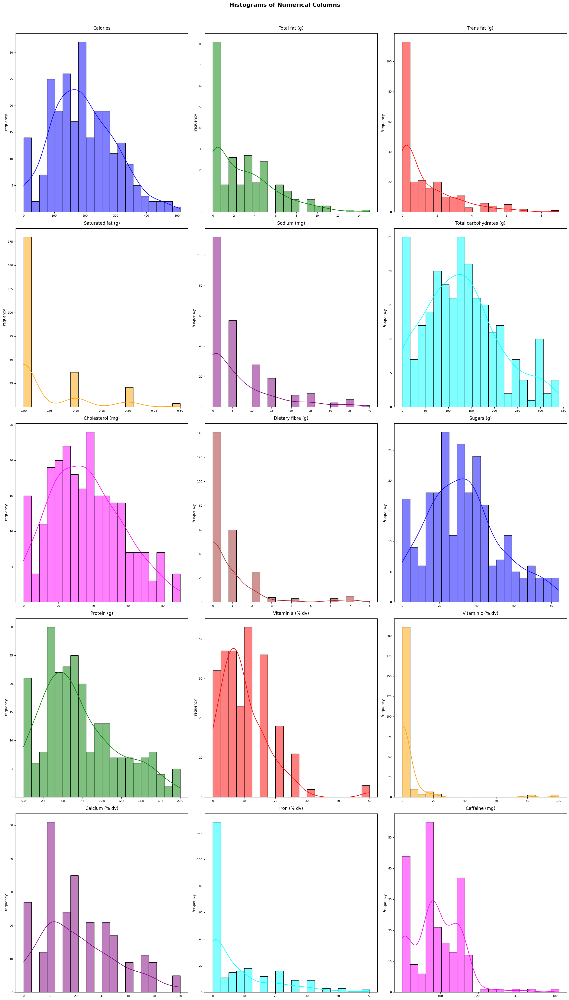

In [12]:
# Filter only numerical columns
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Calculate the number of rows and columns needed for the plots
n_plots = len(numeric_columns)
n_rows = int(np.ceil(n_plots / 3))  # Assuming 4 plots per row

# Create the subplots
fig, axes = plt.subplots(n_rows, 3, figsize=(22, 8 * n_rows))
axes = axes.flatten()

# Define a list of colors for the histograms
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta', 'brown']

# Plot histograms for each numeric column with different colors
for i, column in enumerate(numeric_columns):
    color_index = i % len(colors)  # Cycle through colors if more plots than available colors
    sns.histplot(data=df, x=column, kde=True, bins=20, ax=axes[i], color=colors[color_index])
    axes[i].set_title(column.capitalize(), fontsize=12, pad=10)  # Title with increased fontsize and padding
    axes[i].set_xlabel('')  # Remove x-label for better readability
    axes[i].set_ylabel('Frequency')  # Set y-label as 'Frequency'
    axes[i].tick_params(axis='both', labelsize=8)  # Set smaller tick label font size

# Remove unused subplots if the number of plots is odd
for j in range(n_plots, n_rows * 3):
    fig.delaxes(axes[j])


plt.suptitle('Histograms of Numerical Columns', fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()

## **To check if there is Missing Values**

In [13]:
print('Missing values status:', df.isnull().values.any())
missing_values = pd.DataFrame(df.isnull().sum(), columns=['Total Null Values'])
missing_values['Percentage'] = (missing_values['Total Null Values'] / df.shape[0]) * 100
missing_values.sort_values(by='Percentage', ascending=False).reset_index()

Missing values status: True


,index,Total Null Values,Percentage
0,Caffeine (mg),23,9.504132
1,Total Fat (g),1,0.413223
2,Dietary Fibre (g),0,0.000000
3,Iron (% DV),0,0.000000
4,Calcium (% DV),0,0.000000
5,Vitamin C (% DV),0,0.000000
6,Vitamin A (% DV),0,0.000000
7,Protein (g),0,0.000000
8,Sugars (g),0,0.000000
9,Beverage_category,0,0.000000


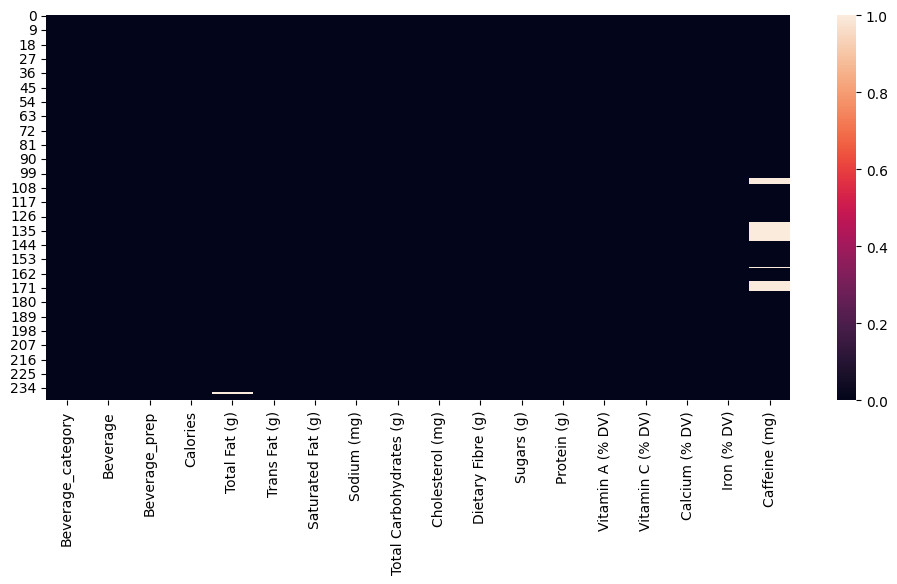

In [14]:
plt.figure(figsize = (12, 5))
sns.heatmap(data = df.isna(), vmin = 0, vmax = 1)
plt.show()

**There is only one missing value in this datasaet in Caffeine (mg) columns**

## **Dropping the missing value because its only 1 missing value**

In [15]:
df.dropna(inplace=True)


## **To check if there is duplicated data**

In [16]:
df.duplicated().sum()

0

**To make sure if there is no duplicate data in each rows**

## **To check if there is outliers**

**a). Using Boxplot to see how many outliers found in this dataset**

An outlier is data that significantly differs from other observation data. Outliers can affect the results of decision-making after analysis. There are several factors that cause the emergence of outlier data, such as data input errors, the facts on the ground are indeed like that, the subject does not understand the unit of the question, and so on.

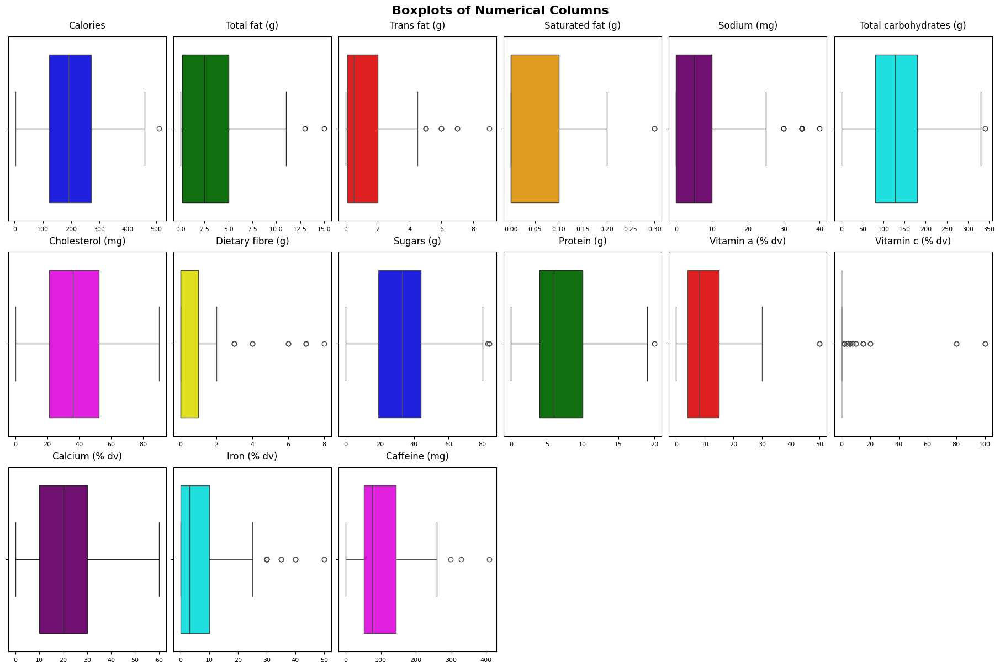

In [17]:
# Filter only numerical columns
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Calculate the number of rows and columns needed for the plots
n_plots = len(numeric_columns)
n_rows = int(np.ceil(n_plots / 6))  # Assuming 6 boxplots per row

# Create the subplots dynamically based on the number of plots
fig, axes = plt.subplots(n_rows, 6, figsize=(18, 4 * n_rows), constrained_layout=True)
axes = axes.flatten()

# Define a list of colors for the boxplots
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta', 'yellow']

# Plot boxplots for each numeric column with different colors
for i, column in enumerate(numeric_columns):
    color_index = i % len(colors)  # Cycle through colors if more plots than available colors
    sns.boxplot(data=df, x=column, ax=axes[i], color=colors[color_index])
    axes[i].set_title(column.capitalize(), fontsize=12, pad=10)  # Title with increased fontsize and padding
    axes[i].set_xlabel('')  # Remove x-label for better readability
    axes[i].set_ylabel('')  # Remove y-label for boxplot
    axes[i].tick_params(axis='both', labelsize=8)  # Set smaller tick label font size

# Remove excess subplots
for j in range(n_plots, n_rows * 6):
    fig.delaxes(axes[j])

plt.suptitle('Boxplots of Numerical Columns', fontsize=16, fontweight='bold')
plt.show()


## **Changing the Value in Iron Column**

In [18]:
def update_iron_column(iron_column):
    replacements = {
        "0.00%": "0%",
        "10.00%": "10%",
        "15.00%": "15%",
        "6.00%": "6%",
        "8.00%": "8%"
    }

    if isinstance(iron_column, str):
        for old_value, new_value in replacements.items():
            iron_column = iron_column.replace(old_value, new_value)

    return iron_column

# Apply the update_iron_column function to each element in the 'Iron (% DV)' column
df['Iron (% DV)'] = df['Iron (% DV)'].apply(update_iron_column)

# Print the resulting DataFrame
df.head()




,Beverage_category,Beverage,Beverage_prep,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
0,Coffee,Brewed Coffee,Short,3,0.1,0.0,0.0,0,5,0,0,0,0.3,0,0,0,0,175.0
1,Coffee,Brewed Coffee,Tall,4,0.1,0.0,0.0,0,10,0,0,0,0.5,0,0,0,0,260.0
2,Coffee,Brewed Coffee,Grande,5,0.1,0.0,0.0,0,10,0,0,0,1.0,0,0,0,0,330.0
3,Coffee,Brewed Coffee,Venti,5,0.1,0.0,0.0,0,10,0,0,0,1.0,0,0,2,0,410.0
4,Classic Espresso Drinks,Caffè Latte,Short Nonfat Milk,70,0.1,0.1,0.0,5,75,10,0,9,6.0,10,0,20,0,75.0


## **Changing the Varies to varies so there is no duplicate value in Caffeine column**

In [19]:
def update_caffeine_column(caffeine_column):
    replacements = {
        "Varies": "varies",
        # Add more replacements as needed
    }

    if isinstance(caffeine_column, str):
        for old_value, new_value in replacements.items():
            caffeine_column = caffeine_column.replace(old_value, new_value)

    return caffeine_column

# Apply the update_caffeine_column function to each element in the 'Caffeine (mg)' column
df['Caffeine (mg)'] = df['Caffeine (mg)'].apply(update_caffeine_column)

# Print the resulting DataFrame
df.head()


,Beverage_category,Beverage,Beverage_prep,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
0,Coffee,Brewed Coffee,Short,3,0.1,0.0,0.0,0,5,0,0,0,0.3,0,0,0,0,175.0
1,Coffee,Brewed Coffee,Tall,4,0.1,0.0,0.0,0,10,0,0,0,0.5,0,0,0,0,260.0
2,Coffee,Brewed Coffee,Grande,5,0.1,0.0,0.0,0,10,0,0,0,1.0,0,0,0,0,330.0
3,Coffee,Brewed Coffee,Venti,5,0.1,0.0,0.0,0,10,0,0,0,1.0,0,0,2,0,410.0
4,Classic Espresso Drinks,Caffè Latte,Short Nonfat Milk,70,0.1,0.1,0.0,5,75,10,0,9,6.0,10,0,20,0,75.0


## **Checking the anomaly in Beverage Category, Beverage, and Beverage Prep**

In [20]:
# Assuming 'df' is your DataFrame
grouped_df = df.groupby('Beverage_category').agg({
    'Beverage': lambda x: x.unique().tolist(),
    'Beverage_prep': lambda x: x.unique().tolist()
}).reset_index()

grouped_df

,Beverage_category,Beverage,Beverage_prep
0,Classic Espresso Drinks,"[Caffè Latte, Caffè Mocha (Without Whipped Cream), Vanilla Latte (Or Other Flavoured Latte), Caffè Americano, Cappuccino, Espresso, Skinny Latte (Any Flavour)]","[Short Nonfat Milk, 2% Milk, Soymilk, Tall Nonfat Milk, Grande Nonfat Milk, Venti Nonfat Milk, Short, Tall, Grande, Venti, Solo, Doppio]"
1,Coffee,[Brewed Coffee],"[Short, Tall, Grande, Venti]"
2,Frappuccino® Blended Coffee,"[Coffee, Mocha (Without Whipped Cream), Caramel (Without Whipped Cream), Java Chip (Without Whipped Cream)]","[Tall Nonfat Milk, Whole Milk, Soymilk, Grande Nonfat Milk, Venti Nonfat Milk]"
3,Frappuccino® Blended Crème,"[Strawberries & Crème (Without Whipped Cream), Vanilla Bean (Without Whipped Cream)]","[Tall Nonfat Milk, Whole Milk, Soymilk, Grande Nonfat Milk, Venti Nonfat Milk]"
4,Frappuccino® Light Blended Coffee,"[Coffee, Mocha, Caramel, Java Chip]","[Tall Nonfat Milk, Grande Nonfat Milk, Venti Nonfat Milk]"
5,Shaken Iced Beverages,"[Iced Brewed Coffee (With Classic Syrup), Iced Brewed Coffee (With Milk & Classic Syrup), Shaken Iced Tazo® Tea (With Classic Syrup)]","[Tall, Grande, Venti, Tall Nonfat Milk, Soymilk, Grande Nonfat Milk, 2% Milk, Venti Nonfat Milk]"
6,Signature Espresso Drinks,"[Caramel Macchiato, White Chocolate Mocha (Without Whipped Cream), Hot Chocolate (Without Whipped Cream), Caramel Apple Spice (Without Whipped Cream)]","[Short Nonfat Milk, 2% Milk, Soymilk, Tall Nonfat Milk, Grande Nonfat Milk, Venti Nonfat Milk, Short, Tall, Grande, Venti]"
7,Smoothies,"[Banana Chocolate Smoothie, Orange Mango Banana Smoothie, Strawberry Banana Smoothie]","[2% Milk, Soymilk, Grande Nonfat Milk]"
8,Tazo® Tea Drinks,"[Tazo® Chai Tea Latte, Tazo® Green Tea Latte, Tazo® Full-Leaf Red Tea Latte (Vanilla Rooibos)]","[Short Nonfat Milk, 2% Milk, Soymilk, Tall Nonfat Milk, Grande Nonfat Milk, Venti Nonfat Milk]"


## **Data Analysis and Visualization**

After the data cleaning process, an analysis will be conducted to determine:

The analysis will involve: **Focusing on Frappuccino® Blended Coffee vs Frappuccino® Light Blended Coffee**

**1. Calculating the average values for each products beverage categories, beverage, and beverage prep.**

**2. Identifying the beverage category, beverage, and beverage prep with the highest and lowest values for each products.**

**3. Determining the correlation between the health nutritions.**

| Nutrient                | Healthy Criteria                                     |
|-------------------------|------------------------------------------------------|
| Calories                | Lower number of calories                             |
| Total Fat (g)           | Lower amount of total fat                            |
| Trans Fat (g)           | Lower amount of trans fat                            |
| Saturated Fat (g)       | Lower amount of saturated fat                        |
| Sodium (mg)             | Lower amount of sodium                               |
| Total Carbohydrates (g) | Lower amount of total carbohydrates                  |
| Cholesterol (mg)        | Lower amount of cholesterol                          |
| Dietary Fibre (g)       | Higher amount of dietary fiber                        |
| Sugars (g)              | Lower amount of sugars                               |
| Protein (g)             | Higher amount of protein                              |
| Vitamin A (% DV)        | Higher percentage of Vitamin A                       |
| Vitamin C (% DV)        | Higher percentage of Vitamin C                       |
| Calcium (% DV)          | Higher percentage of Calcium                         |
| Iron (% DV)             | Higher percentage of Iron                            |
| Caffeine (mg)           | Lower amount of caffeine  

## **Choosing the Frappuccino® Blended Coffee column**

In [21]:
df_Fra = df[df["Beverage_category"] == "Frappuccino® Blended Coffee"]

# Display the updated DataFrame
df_Fra.head()

,Beverage_category,Beverage,Beverage_prep,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
181,Frappuccino® Blended Coffee,Coffee,Tall Nonfat Milk,160,0.1,0.0,0.0,0,160,36,0,36,3.0,4,0,10,10,0.0
182,Frappuccino® Blended Coffee,Coffee,Whole Milk,180,2.5,1.5,0.1,10,160,36,0,36,3.0,4,0,8,0,70.0
183,Frappuccino® Blended Coffee,Coffee,Soymilk,160,1.5,0.2,0.0,0,150,35,0,34,2.0,4,0,10,0,70.0
184,Frappuccino® Blended Coffee,Coffee,Grande Nonfat Milk,220,0.1,0.1,0.0,0,210,51,0,50,4.0,6,0,10,4,70.0
185,Frappuccino® Blended Coffee,Coffee,Whole Milk,240,3.0,2.0,0.1,10,220,50,0,50,3.0,4,0,10,0,95.0


## **Choosing the Frappuccino® Light Blended Coffee column**

In [22]:
df_Frali = df[df["Beverage_category"] == "Frappuccino® Light Blended Coffee"]

# Display the updated DataFrame
df_Frali.head()

,Beverage_category,Beverage,Beverage_prep,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
217,Frappuccino® Light Blended Coffee,Coffee,Tall Nonfat Milk,90,0.1,0.0,0.0,0,160,20,0,19,3.0,4,0,10,0,70.0
218,Frappuccino® Light Blended Coffee,Coffee,Grande Nonfat Milk,120,0.1,0.1,0.0,0,210,26,0,26,3.0,6,0,10,0,95.0
219,Frappuccino® Light Blended Coffee,Coffee,Venti Nonfat Milk,160,0.1,0.1,0.0,5,270,34,0,33,5.0,8,0,15,2,120.0
220,Frappuccino® Light Blended Coffee,Mocha,Tall Nonfat Milk,110,0.5,0.4,0.0,0,150,24,1,23,3.0,4,0,8,6,70.0
221,Frappuccino® Light Blended Coffee,Mocha,Grande Nonfat Milk,150,1.0,0.5,0.0,0,200,33,1,30,4.0,6,0,10,8,95.0


## **1. Calories Analysis Starbuck Products**

<img src = 'https://d2jx2rerrg6sh3.cloudfront.net/image-handler/picture/2019/1/By_photka.jpg'>

## **Top 9 Average Calories by Beverage Category**

In [23]:
# Calculate average calories for each beverage category
avg_calories = df.groupby(['Beverage_category'])[['Calories']].mean()

avg_calories

,Calories
Beverage_category,
Classic Espresso Drinks,140.172414
Coffee,4.250000
Frappuccino® Blended Coffee,276.944444
Frappuccino® Blended Crème,225.833333
Frappuccino® Light Blended Coffee,162.500000
Shaken Iced Beverages,112.500000
Signature Espresso Drinks,250.000000
Smoothies,282.500000
Tazo® Tea Drinks,206.666667


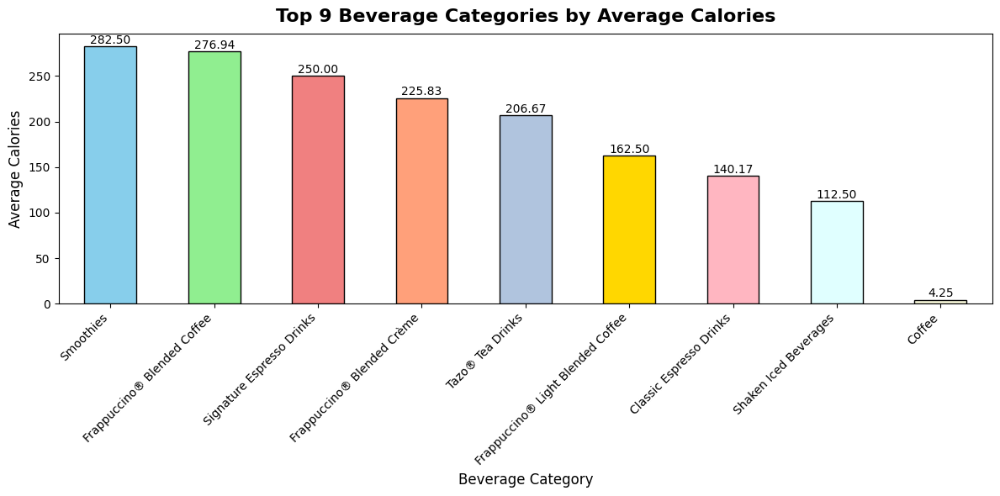

In [24]:
# Get the top 9 highest beverage categories by average calories
top_9_avg_calories = avg_calories.sort_values(by='Calories', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_calories['Calories'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_calories['Calories']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Calories', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Calories', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()




## **Calories Frappuccino® Blended Coffee vs Frappuccino® Light Blended Coffee**

In [25]:
# Calculate average calories for each beverage category
avg_calories = df_Fra.groupby('Beverage')[['Calories']].mean()

avg_calories.head()

,Calories
Beverage,
Caramel (Without Whipped Cream),268.888889
Coffee,238.888889
Java Chip (Without Whipped Cream),327.777778
Mocha (Without Whipped Cream),272.222222


In [26]:
# Calculate average calories for each beverage category
avg_calories1 = df_Frali.groupby('Beverage')[['Calories']].mean()

avg_calories1.head()

,Calories
Beverage,
Caramel,150.000000
Coffee,123.333333
Java Chip,220.000000
Mocha,156.666667


In [27]:
# Sort the DataFrame by 'Calories' column in descending order to get the highest values
top_5_highest_calories = avg_calories.sort_values(by='Calories', ascending=False).head(5)
top_5_highest_calories

,Calories
Beverage,
Java Chip (Without Whipped Cream),327.777778
Mocha (Without Whipped Cream),272.222222
Caramel (Without Whipped Cream),268.888889
Coffee,238.888889


In [28]:
# Sort the DataFrame by 'Calories' column in ascending order to get the lowest values
top_5_lowest_calories = avg_calories1.sort_values(by='Calories', ascending=True).head(5)

top_5_lowest_calories


,Calories
Beverage,
Coffee,123.333333
Caramel,150.000000
Mocha,156.666667
Java Chip,220.000000


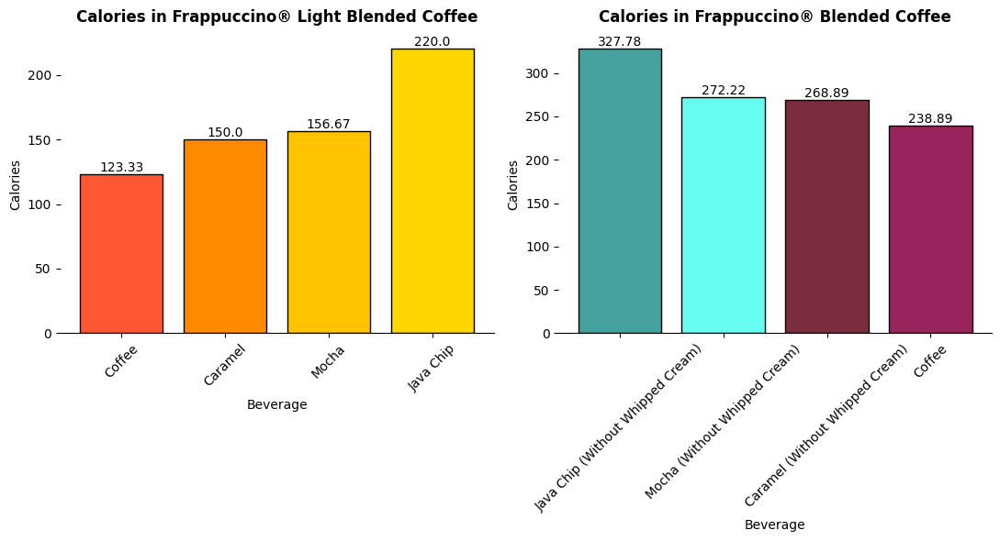

In [29]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest calories
bars1 = axes[0].bar(top_5_lowest_calories.index, top_5_lowest_calories['Calories'], color=custom_colors, edgecolor='black')
axes[0].set_title('Calories in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Calories')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest calories
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest calories
bars2 = axes[1].bar(top_5_highest_calories.index, top_5_highest_calories['Calories'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Calories in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Calories')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest calories
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()

### **Top 10 Combination Calories of Beverage & Prep in Frappuccino® Blended Coffee**

In [30]:
# Create a cross-tabulation without 'All' column
cross_tab = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Calories', values=df_Fra['Calories'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest calories
cross_tab_sorted = cross_tab.sort_values(by='Calories', ascending=False)

cross_tab_sorted.head(5)

col_0                                                  Calories
Beverage                          Beverage_prep                
Java Chip (Without Whipped Cream) Venti Nonfat Milk  420.000000
                                  Whole Milk         346.666667
Mocha (Without Whipped Cream)     Venti Nonfat Milk  340.000000
Caramel (Without Whipped Cream)   Venti Nonfat Milk  330.000000
Java Chip (Without Whipped Cream) Soymilk            320.000000

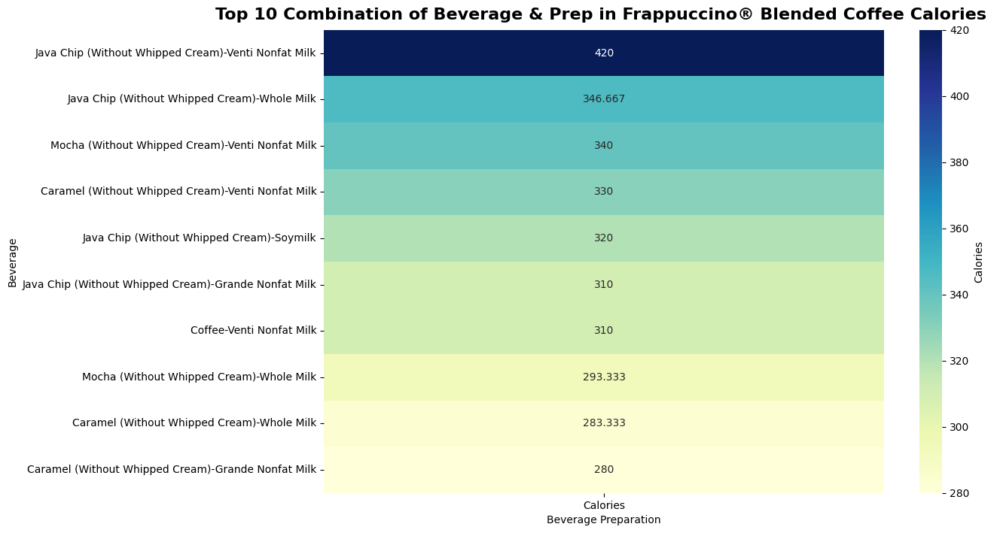

In [31]:
# Display the cross-tabulation sorted by highest calories
top_10 = cross_tab_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Calories'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Calories ',size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()

### **Top 10 Combination Average Calories of Beverage & Prep in Frappuccino® Light Blended Coffee**

In [32]:
# Create a cross-tabulation without 'All' column
cross_tab = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Calories', values=df_Frali['Calories'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest calories
cross_tab_sorted = cross_tab.sort_values(by='Calories', ascending=False)

cross_tab_sorted.head(10)

col_0                         Calories
Beverage  Beverage_prep               
Java Chip Venti Nonfat Milk      290.0
          Grande Nonfat Milk     220.0
Mocha     Venti Nonfat Milk      210.0
Caramel   Venti Nonfat Milk      200.0
Coffee    Venti Nonfat Milk      160.0
Caramel   Grande Nonfat Milk     150.0
Java Chip Tall Nonfat Milk       150.0
Mocha     Grande Nonfat Milk     150.0
Coffee    Grande Nonfat Milk     120.0
Mocha     Tall Nonfat Milk       110.0

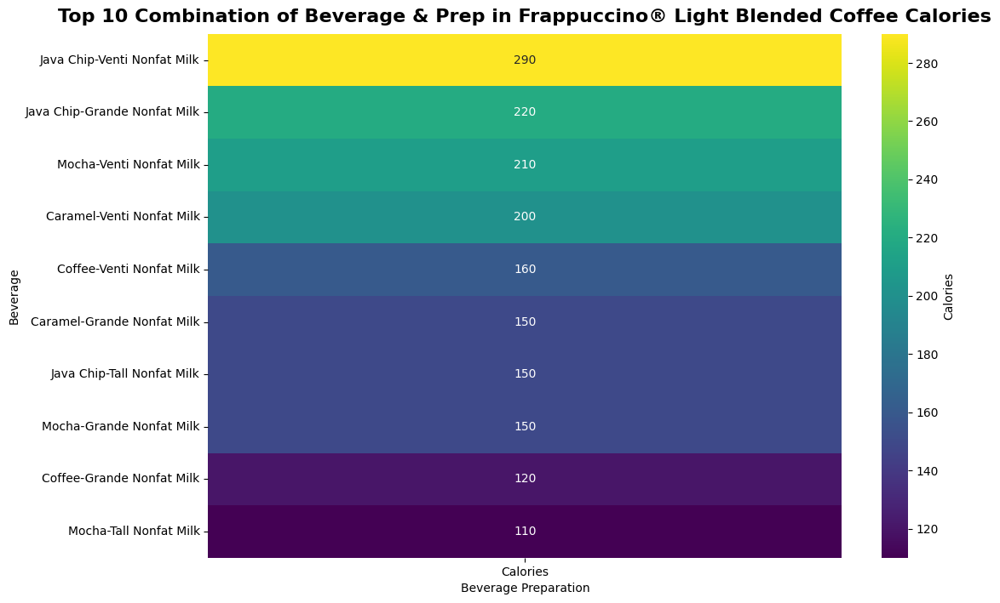

In [33]:
# Display the cross-tabulation sorted by lowest calories
top_10 = cross_tab_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Calories'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Calories',size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()

## **Scatter plots of Calories in Frappuccino® Blended Coffee with Regression Lines**

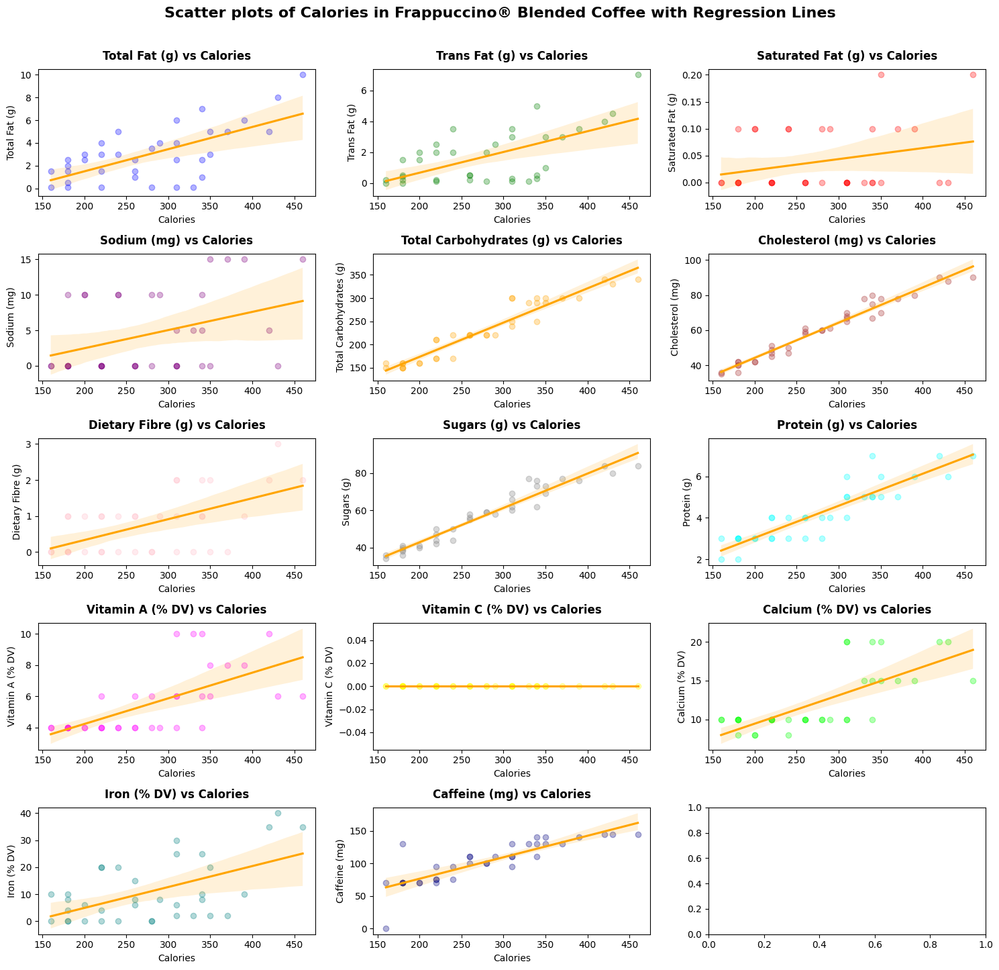

In [34]:
# Select relevant columns
numeric_columns = ['Calories', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Fra[numeric_columns]

# Re-asurring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:16], scatter_colors)):  # Exclude 'Calories', and limit to the first 15 columns
    sns.regplot(data=data, x='Calories', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Calories', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calories')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calories in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Calories in Frappuccino® Light Blended Coffee with Regression Lines**

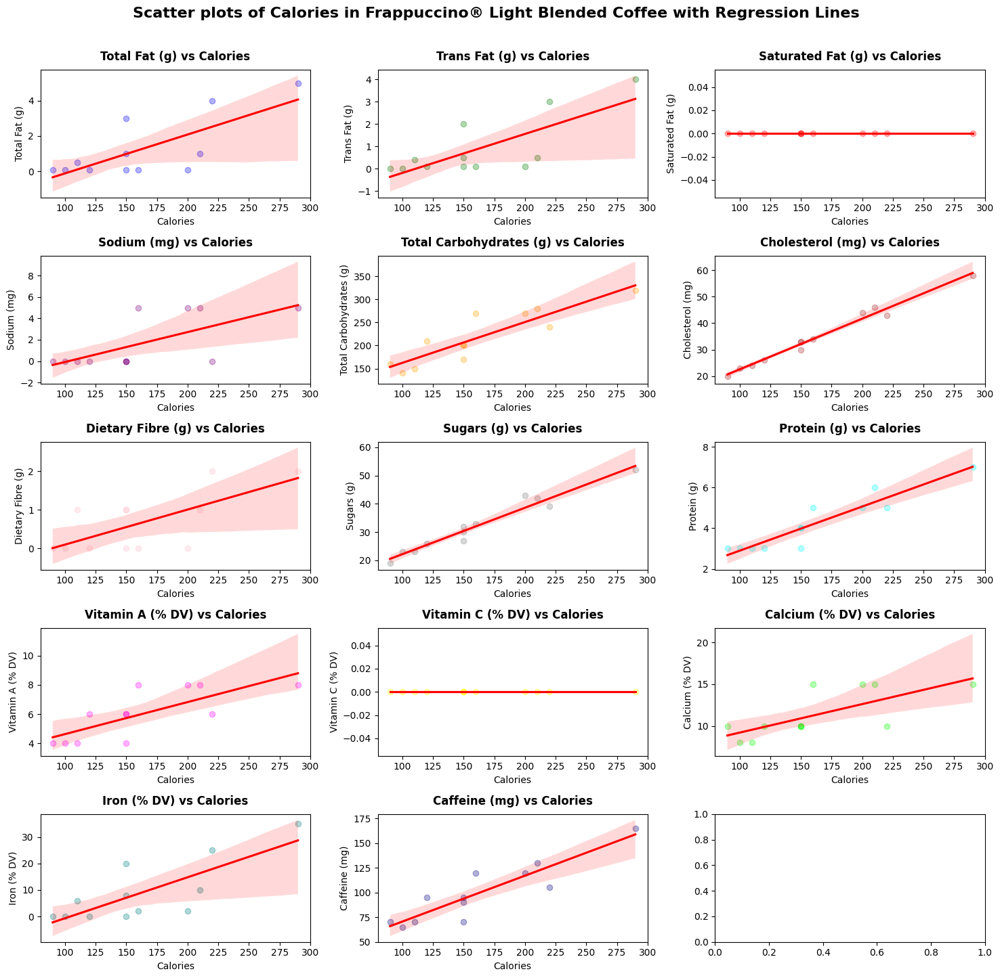

In [35]:
# Select relevant columns
numeric_columns = ['Calories', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Frali[numeric_columns]

# Re-asurring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:16], scatter_colors)):  # Exclude 'Calories', and limit to the first 15 columns
    sns.regplot(data=data, x='Calories', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Calories', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calories')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calories in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()

## **2. Total Fat (g) Analysis Starbuck Products**

<img src = 'https://lifestylemedical.com/wp-content/uploads/2021/08/Saturated-v-Unsaturated-Fat.png'>

## **Top 9 Average Total Fat by Beverage Category**

In [36]:
# Assuming df is your DataFrame containing the data
avg_total_fat = df.groupby(['Beverage_category'])[['Total Fat (g)']].mean()
avg_total_fat


,Total Fat (g)
Beverage_category,
Classic Espresso Drinks,3.127586
Coffee,0.100000
Frappuccino® Blended Coffee,3.002778
Frappuccino® Blended Crème,1.850000
Frappuccino® Light Blended Coffee,1.258333
Shaken Iced Beverages,0.625000
Signature Espresso Drinks,5.275000
Smoothies,2.312500
Tazo® Tea Drinks,2.944444


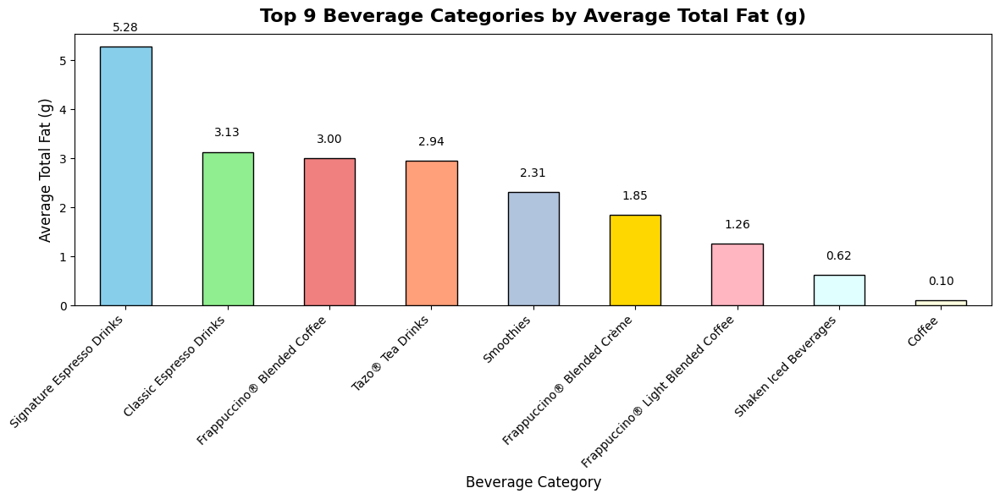

In [37]:
# Get the top 9 highest beverage categories by average Total Fat (g)
top_9_avg_total_fat = avg_total_fat.sort_values(by='Total Fat (g)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_total_fat['Total Fat (g)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations at the top of the bars
for i, value in enumerate(top_9_avg_total_fat['Total Fat (g)']):
    plt.text(i, value + 0.05 * max(top_9_avg_total_fat['Total Fat (g)']), f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Total Fat (g)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Total Fat (g)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Total Fat by Beverage in Frappuccino® Blended Coffee & Frappuccino® Light Blended Coffee**

In [38]:
# Calculate average total fat for each beverage
avg_total_fat = df_Fra.groupby('Beverage')[['Total Fat (g)']].mean()

avg_total_fat.head()

,Total Fat (g)
Beverage,
Caramel (Without Whipped Cream),1.866667
Coffee,1.811111
Java Chip (Without Whipped Cream),5.777778
Mocha (Without Whipped Cream),2.555556


In [39]:
# Calculate average total fat for each beverage
avg_total_fat1 = df_Frali.groupby('Beverage')[['Total Fat (g)']].mean()

avg_total_fat1.head()

,Total Fat (g)
Beverage,
Caramel,0.100000
Coffee,0.100000
Java Chip,4.000000
Mocha,0.833333


In [40]:
# Sort the DataFrame by 'Total Fat (g)' column in descending order to get the highest values
top_5_highest_total_fat = avg_total_fat.sort_values(by='Total Fat (g)', ascending=False).head(5)
top_5_highest_total_fat


,Total Fat (g)
Beverage,
Java Chip (Without Whipped Cream),5.777778
Mocha (Without Whipped Cream),2.555556
Caramel (Without Whipped Cream),1.866667
Coffee,1.811111


In [41]:
# Sort the DataFrame by 'Total Fat (g)' column in ascending order to get the lowest values
top_5_lowest_total_fat = avg_total_fat1.sort_values(by='Total Fat (g)', ascending=True).head(5)
top_5_lowest_total_fat  

,Total Fat (g)
Beverage,
Caramel,0.100000
Coffee,0.100000
Mocha,0.833333
Java Chip,4.000000


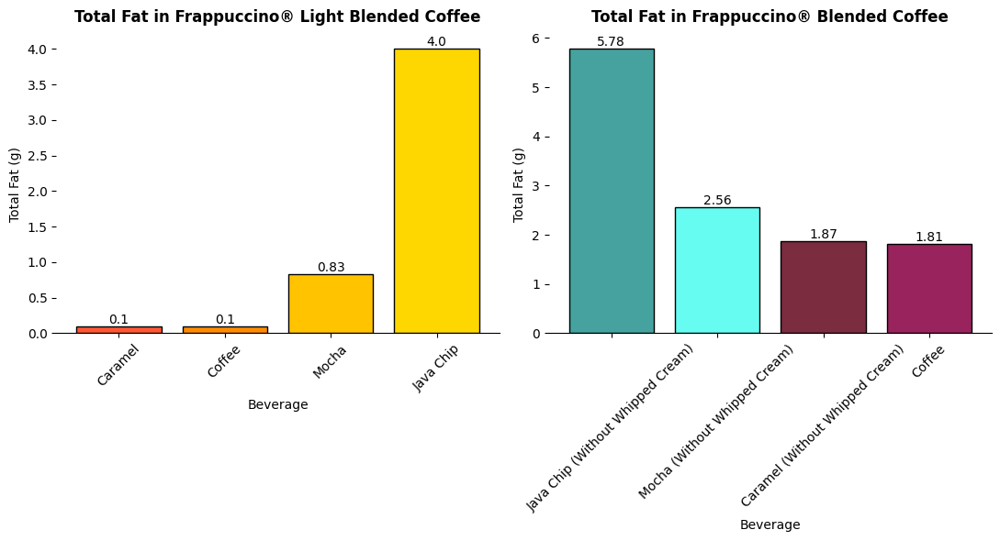

In [42]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest total fat
bars1 = axes[0].bar(top_5_lowest_total_fat.index, top_5_lowest_total_fat['Total Fat (g)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Total Fat in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Total Fat (g)')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest total fat
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest total fat
bars2 = axes[1].bar(top_5_highest_total_fat.index, top_5_highest_total_fat['Total Fat (g)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Total Fat in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Total Fat (g)')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest total fat
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()

## **Top 10 Average Total Fat in Combination of Beverage & Prep in Frappuccino® Blended Coffee by Total Fat**

In [43]:
# Create a cross-tabulation without 'All' column
cross_tab = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Total Fat (g)', values=df_Fra['Total Fat (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest total fat
cross_tab_sorted = cross_tab.sort_values(by='Total Fat (g)', ascending=False)

cross_tab_sorted.head(5)


col_0                                                 Total Fat (g)
Beverage                          Beverage_prep                    
Java Chip (Without Whipped Cream) Whole Milk               7.333333
                                  Soymilk                  6.000000
                                  Venti Nonfat Milk        5.000000
Mocha (Without Whipped Cream)     Whole Milk               4.333333
Java Chip (Without Whipped Cream) Grande Nonfat Milk       4.000000

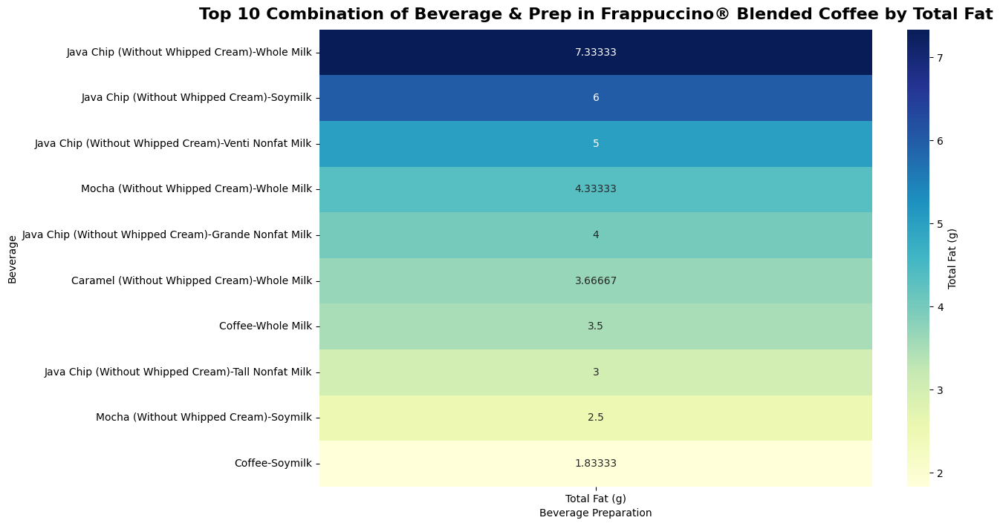

In [44]:
# Display the cross-tabulation sorted by highest total fat
top_10_total_fat = cross_tab_sorted.head(10)

# Create a heatmap for total fat
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_total_fat, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Total Fat (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Total Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Average Total Fat in Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Total Fat**

In [45]:
# Create a cross-tabulation without 'All' column
cross_tab = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Total Fat (g)', values=df_Frali['Total Fat (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest total fat
cross_tab_sorted = cross_tab.sort_values(by='Total Fat (g)', ascending=False)

cross_tab_sorted.head(10)

col_0                         Total Fat (g)
Beverage  Beverage_prep                    
Java Chip Venti Nonfat Milk             5.0
          Grande Nonfat Milk            4.0
          Tall Nonfat Milk              3.0
Mocha     Grande Nonfat Milk            1.0
          Venti Nonfat Milk             1.0
          Tall Nonfat Milk              0.5
Caramel   Grande Nonfat Milk            0.1
          Tall Nonfat Milk              0.1
          Venti Nonfat Milk             0.1
Coffee    Grande Nonfat Milk            0.1

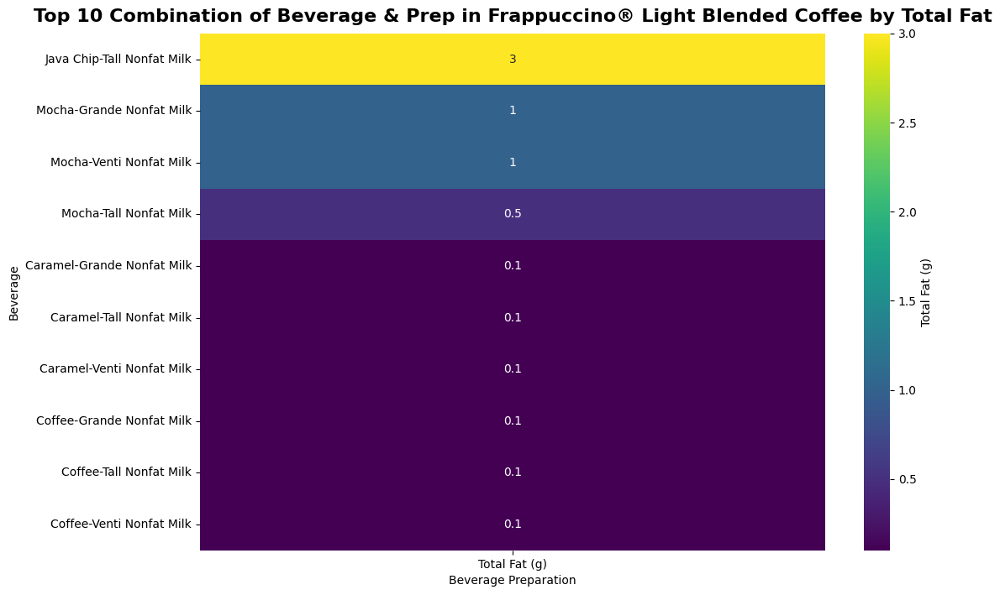

In [46]:
# Display the cross-tabulation sorted by lowest total fat
top_10_total_fat = cross_tab_sorted.tail(10)  # Using tail(10) to get the lowest values

# Create a heatmap for total fat
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_total_fat, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Total Fat (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Total Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Total fat (g) in Frappuccino® Light Blended Coffee with Regression Lines**

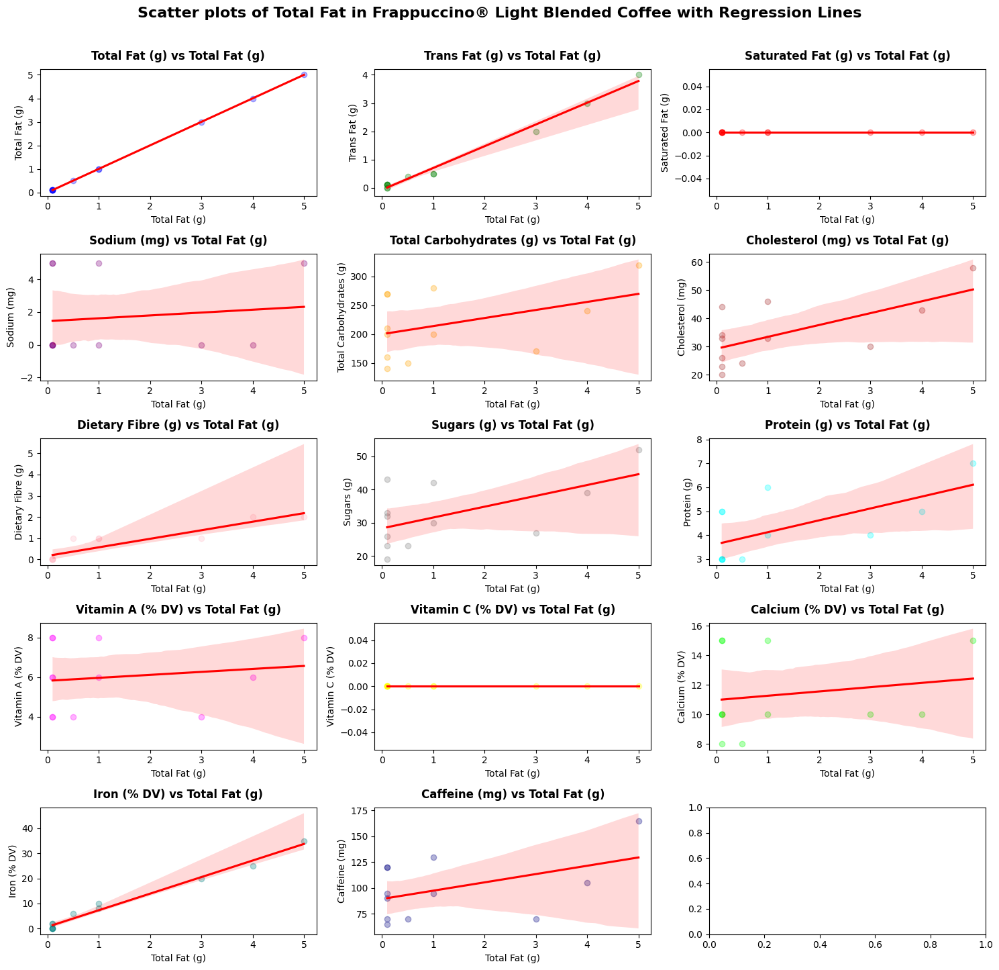

In [47]:
# Select relevant columns
numeric_columns = ['Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Frali[numeric_columns]

# Re-assuring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns, scatter_colors)):
    sns.regplot(data=data, x='Total Fat (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Total Fat (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Total Fat (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Total Fat in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()

## **Scatter plots of Total fat (g) in Frappuccino® Blended Coffee with Regression Lines**

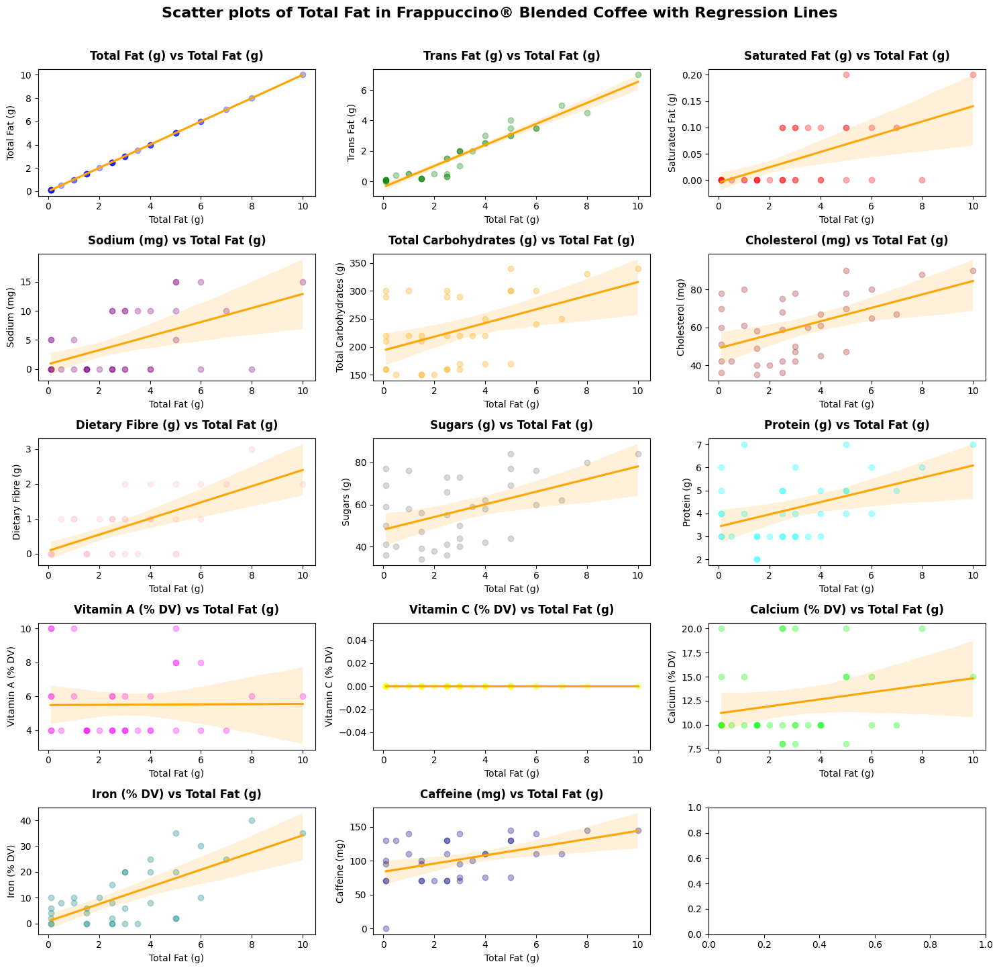

In [48]:
# Select relevant columns
numeric_columns = ['Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Fra[numeric_columns]

# Re-assuring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns, scatter_colors)):
    sns.regplot(data=data, x='Total Fat (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Total Fat (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Total Fat (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Total Fat in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()

## **3. Trans Fat (g) Analysis Starbuck Products**

<img src = 'https://lh6.googleusercontent.com/h8miZcuufPUaqQHlzofIMJ-cvu10kyo8iO2A8CJONoFgz26mtt38B7IoioKP1nmKEPKF7pxUgHM99pA4rNYd7mS4TBvobq-scsXLMkhyP7K6l6TbnGu5fcI3pja6YewkLqaoEgUMCfHtFlkdBqekKVYIsAAzFPLpOKu6X606bWpcailolB3uTfm8kx35KQ'>

## **Top 9 Average Trans Fat (g) by Beverage Category**

In [49]:
avg_trans_fat = df.groupby(['Beverage_category'])[['Trans Fat (g)']].mean()


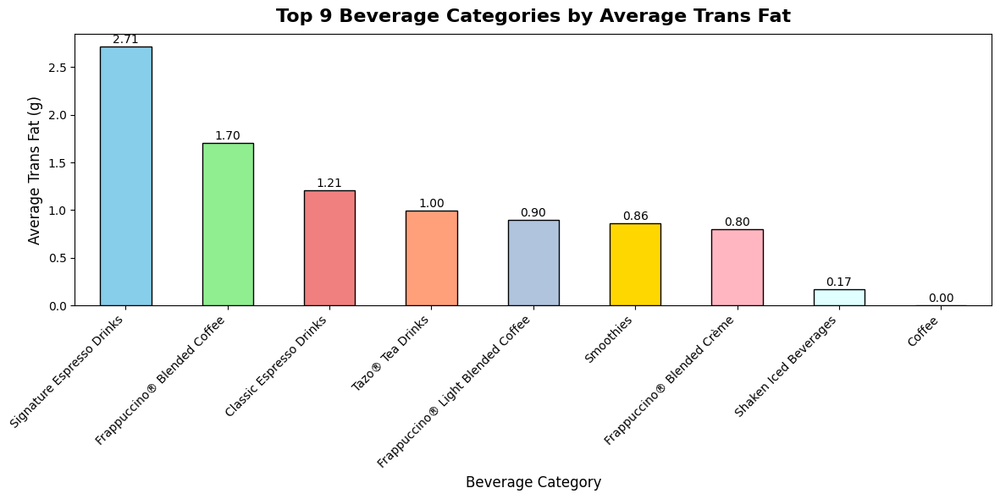

In [50]:
# Get the top 9 highest beverage categories by average Trans Fat
top_9_avg_trans_fat = avg_trans_fat.sort_values(by='Trans Fat (g)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_trans_fat['Trans Fat (g)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_trans_fat['Trans Fat (g)']):
    plt.text(i, value + 0.01, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Trans Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Trans Fat (g)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

## **Average Trans Fat (g) in Frappuccino® Blended Coffee & Frappuccino® Light Blended Coffee**

In [51]:
avg_trans_fat = df_Fra.groupby('Beverage')[['Trans Fat (g)']].mean()

avg_trans_fat.head()


,Trans Fat (g)
Beverage,
Caramel (Without Whipped Cream),0.822222
Coffee,0.822222
Java Chip (Without Whipped Cream),3.888889
Mocha (Without Whipped Cream),1.266667


In [52]:
avg_trans_fat1 = df_Frali.groupby('Beverage')[['Trans Fat (g)']].mean()

avg_trans_fat1.head()

,Trans Fat (g)
Beverage,
Caramel,0.066667
Coffee,0.066667
Java Chip,3.000000
Mocha,0.466667


In [53]:
top_5_highest_trans_fat = avg_trans_fat.sort_values(by='Trans Fat (g)', ascending=False).head(5)


In [54]:
top_5_lowest_trans_fat = avg_trans_fat1.sort_values(by='Trans Fat (g)', ascending=True).head(5)


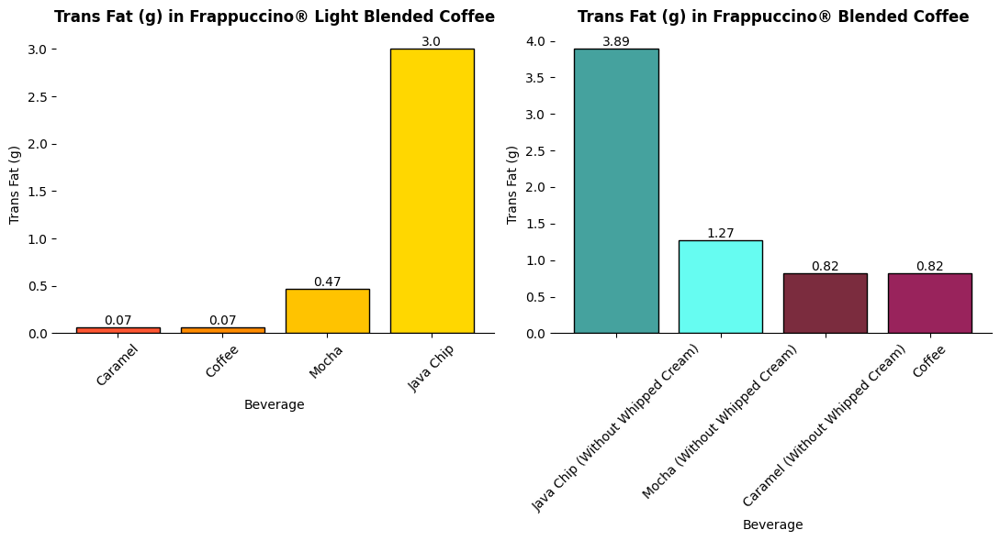

In [55]:
custom_colors_trans_fat = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors_trans_fat1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest Trans Fat
bars_trans_fat1 = axes[0].bar(top_5_lowest_trans_fat.index, top_5_lowest_trans_fat['Trans Fat (g)'], color=custom_colors_trans_fat, edgecolor='black')
axes[0].set_title('Trans Fat (g) in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Trans Fat (g)')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest Trans Fat
for bar in bars_trans_fat1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest Trans Fat
bars_trans_fat2 = axes[1].bar(top_5_highest_trans_fat.index, top_5_highest_trans_fat['Trans Fat (g)'], color=custom_colors_trans_fat1, edgecolor='black')
axes[1].set_title('Trans Fat (g) in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Trans Fat (g)')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest Trans Fat
for bar in bars_trans_fat2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Average Total Fat in Combination of Beverage & Prep in Frappuccino® Blended Coffee Trans Fat**

In [56]:
# Create a cross-tabulation without 'All' column
cross_tab_trans_fat = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Trans Fat (g)', values=df_Fra['Trans Fat (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest Trans Fat
cross_tab_trans_fat_sorted = cross_tab_trans_fat.sort_values(by='Trans Fat (g)', ascending=False)

cross_tab_trans_fat_sorted.head(5)


col_0                                                 Trans Fat (g)
Beverage                          Beverage_prep                    
Java Chip (Without Whipped Cream) Whole Milk               5.166667
                                  Venti Nonfat Milk        4.000000
                                  Soymilk                  3.500000
                                  Grande Nonfat Milk       3.000000
Mocha (Without Whipped Cream)     Whole Milk               2.666667

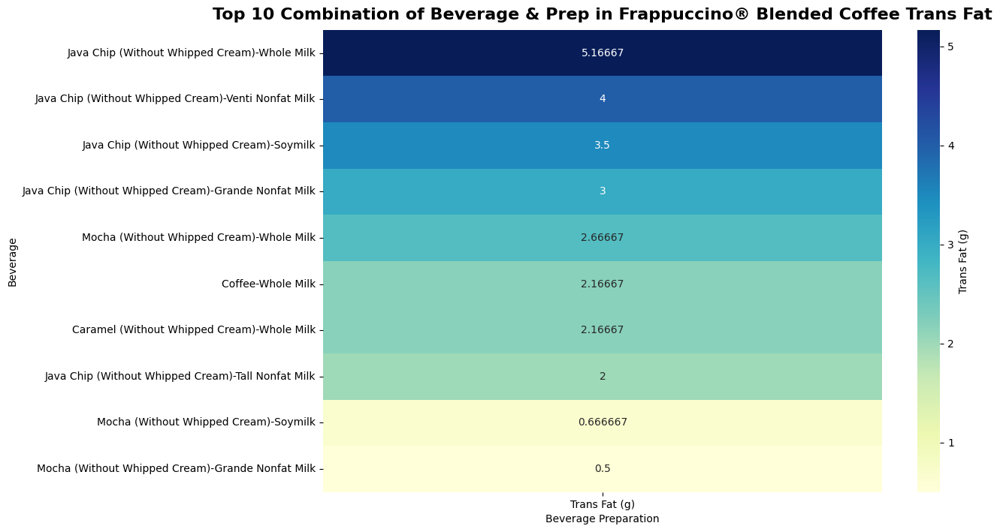

In [57]:
# Display the cross-tabulation sorted by highest Trans Fat
top_10_trans_fat = cross_tab_trans_fat_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_trans_fat, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Trans Fat (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Trans Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Average Total Fat in Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Trans Fat**

In [58]:
# Create a cross-tabulation without 'All' column for Trans Fat
cross_tab_trans_fat = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Trans Fat (g)', values=df_Frali['Trans Fat (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest Trans Fat
cross_tab_trans_fat_sorted = cross_tab_trans_fat.sort_values(by='Trans Fat (g)', ascending=False)

cross_tab_trans_fat_sorted.head(10)


col_0                         Trans Fat (g)
Beverage  Beverage_prep                    
Java Chip Venti Nonfat Milk             4.0
          Grande Nonfat Milk            3.0
          Tall Nonfat Milk              2.0
Mocha     Grande Nonfat Milk            0.5
          Venti Nonfat Milk             0.5
          Tall Nonfat Milk              0.4
Caramel   Grande Nonfat Milk            0.1
          Venti Nonfat Milk             0.1
Coffee    Grande Nonfat Milk            0.1
          Venti Nonfat Milk             0.1

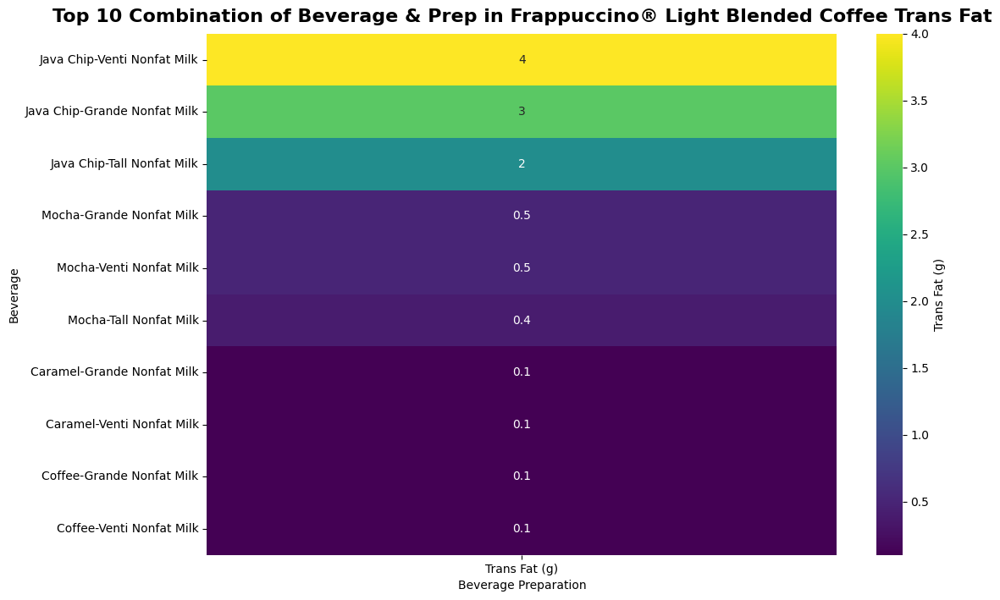

In [59]:
# Display the cross-tabulation sorted by lowest Trans Fat
top_10_trans_fat = cross_tab_trans_fat_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_trans_fat, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Trans Fat (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Trans Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Trans Fat (g) in Frappuccino® Light Blended Coffee with Regression Lines**

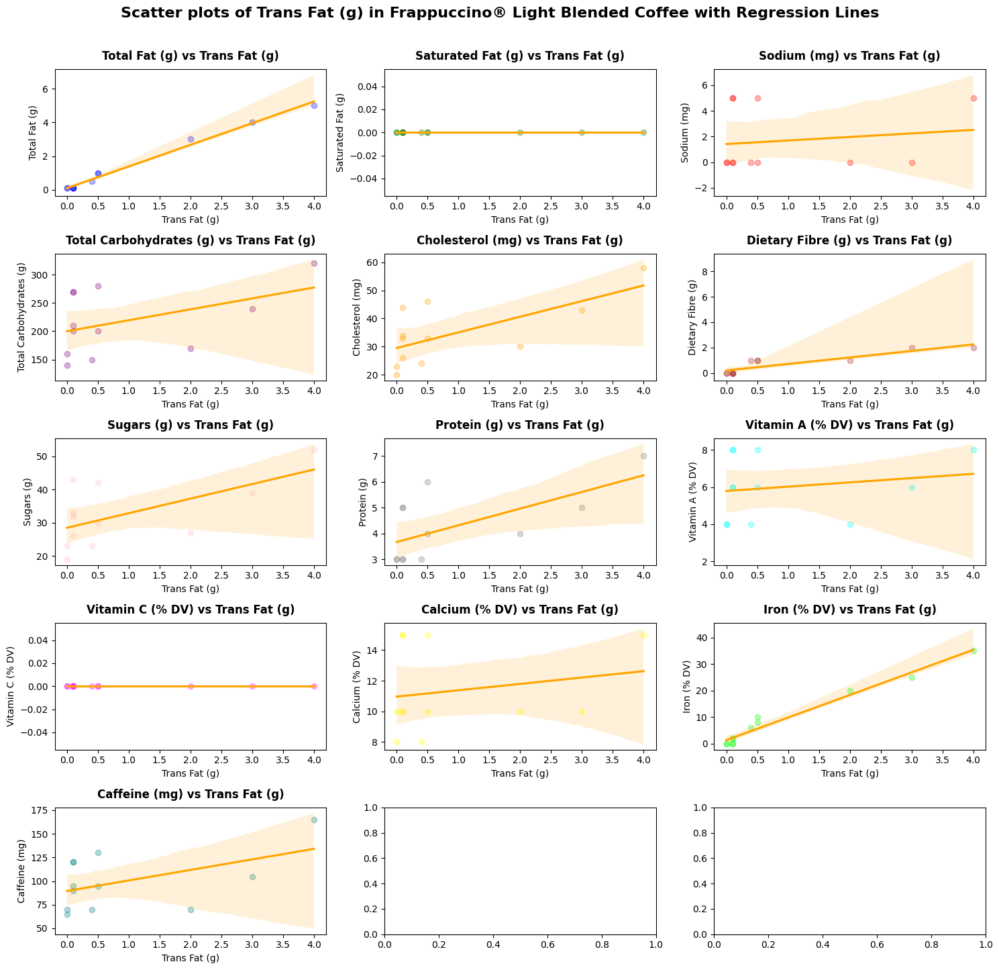

In [60]:
# Select relevant columns
numeric_columns_trans_fat = ['Trans Fat (g)', 'Total Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                             'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                             'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                             'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_trans_fat = df_Frali[numeric_columns_trans_fat]

# Reassuring to any remaining handling missing values by dropping rows with any missing values
data_trans_fat = data_trans_fat.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_trans_fat = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                             'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_trans_fat[1:], scatter_colors_trans_fat)):  # Exclude 'Trans Fat (g)', and limit to the first 14 columns
    sns.regplot(data=data_trans_fat, x='Trans Fat (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Trans Fat (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Trans Fat (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Trans Fat (g) in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Trans Fat (g) in Frappuccino® Blended Coffee with Regression Lines**

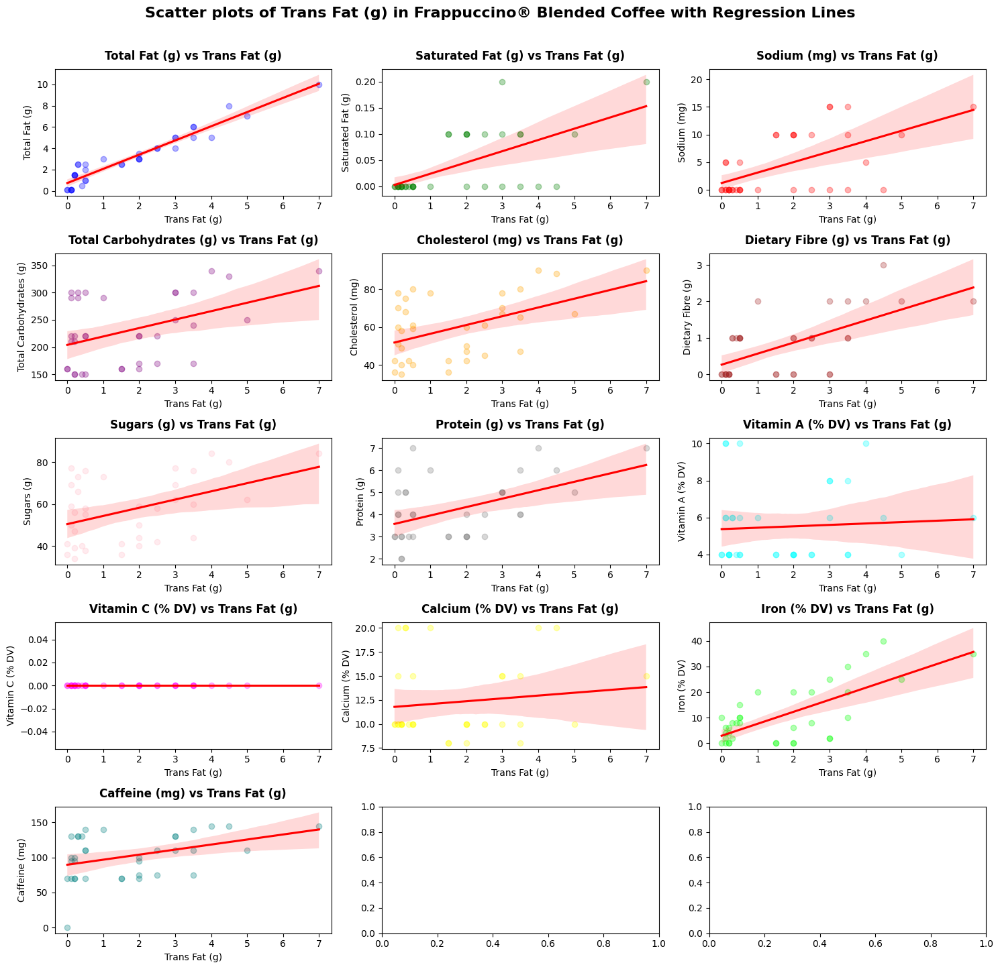

In [223]:
# Select relevant columns
numeric_columns_trans_fat = ['Trans Fat (g)', 'Total Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                             'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                             'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                             'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_trans_fat = df_Fra[numeric_columns_trans_fat]

# Reassuring to any remaining handling missing values by dropping rows with any missing values
data_trans_fat = data_trans_fat.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_trans_fat = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                             'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_trans_fat[1:], scatter_colors_trans_fat)):  # Exclude 'Trans Fat (g)', and limit to the first 14 columns
    sns.regplot(data=data_trans_fat, x='Trans Fat (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Trans Fat (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Trans Fat (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Trans Fat (g) in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **4. Saturated Fat (g) Analysis Starbuck Product**

<img src = 'https://www.clearvuehealth.com/images/fats-chd-compare.jpg'>

## **Top 9 Beverage Categories by Average Saturated Fat**

In [62]:
avg_saturated_fat = df.groupby(['Beverage_category'])[['Saturated Fat (g)']].mean()


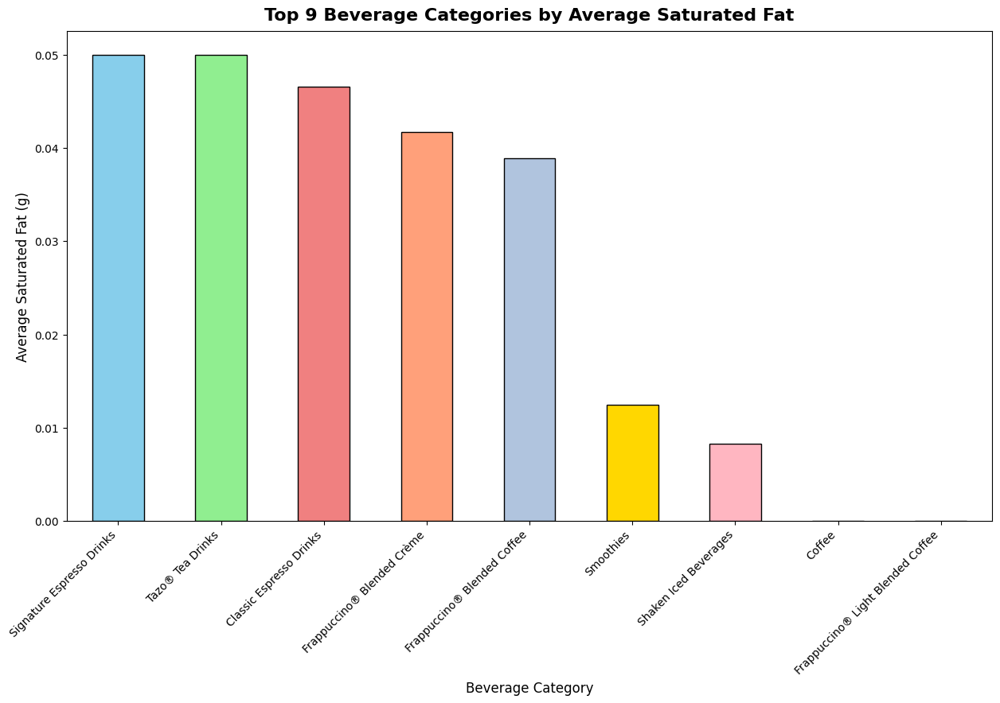

In [63]:
# Get the top 9 highest beverage categories by average saturated fat
top_9_avg_saturated_fat = avg_saturated_fat.sort_values(by='Saturated Fat (g)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(15, 8))  # Increased figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
bar_plot = top_9_avg_saturated_fat['Saturated Fat (g)'].plot(kind='bar', color=colors, edgecolor='black')


# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Saturated Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Saturated Fat (g)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.show()

## **Average Saturated Fat in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [64]:
avg_saturated_fat = df_Fra.groupby('Beverage')[['Saturated Fat (g)']].mean()


In [65]:
avg_saturated_fat1 = df_Frali.groupby('Beverage')[['Saturated Fat (g)']].mean()


In [66]:
top_5_highest_saturated_fat = avg_saturated_fat.sort_values(by='Saturated Fat (g)', ascending=False).head(5)


In [67]:
top_5_lowest_saturated_fat = avg_saturated_fat1.sort_values(by='Saturated Fat (g)', ascending=True).head(5)


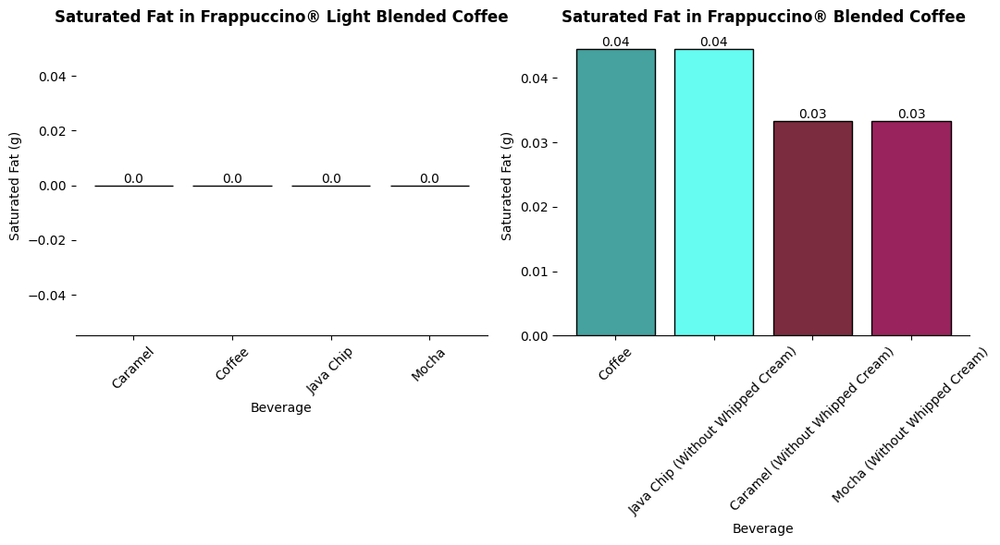

In [68]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest saturated fat
bars1 = axes[0].bar(top_5_lowest_saturated_fat.index, top_5_lowest_saturated_fat['Saturated Fat (g)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Saturated Fat in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Saturated Fat (g)')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest saturated fat
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest saturated fat
bars2 = axes[1].bar(top_5_highest_saturated_fat.index, top_5_highest_saturated_fat['Saturated Fat (g)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Saturated Fat in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Saturated Fat (g)')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest saturated fat
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Saturated Fat**

In [69]:
# Create a cross-tabulation without 'All' column
cross_tab_saturated_fat = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Saturated Fat (g)', values=df_Fra['Saturated Fat (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest saturated fat
cross_tab_sorted_saturated_fat = cross_tab_saturated_fat.sort_values(by='Saturated Fat (g)', ascending=False)

cross_tab_sorted_saturated_fat.head(5)


,col_0,Saturated Fat (g)
Beverage,Beverage_prep,
Java Chip (Without Whipped Cream),Whole Milk,0.133333
Coffee,Whole Milk,0.133333
Mocha (Without Whipped Cream),Whole Milk,0.100000
Caramel (Without Whipped Cream),Whole Milk,0.100000
Java Chip (Without Whipped Cream),Soymilk,0.000000


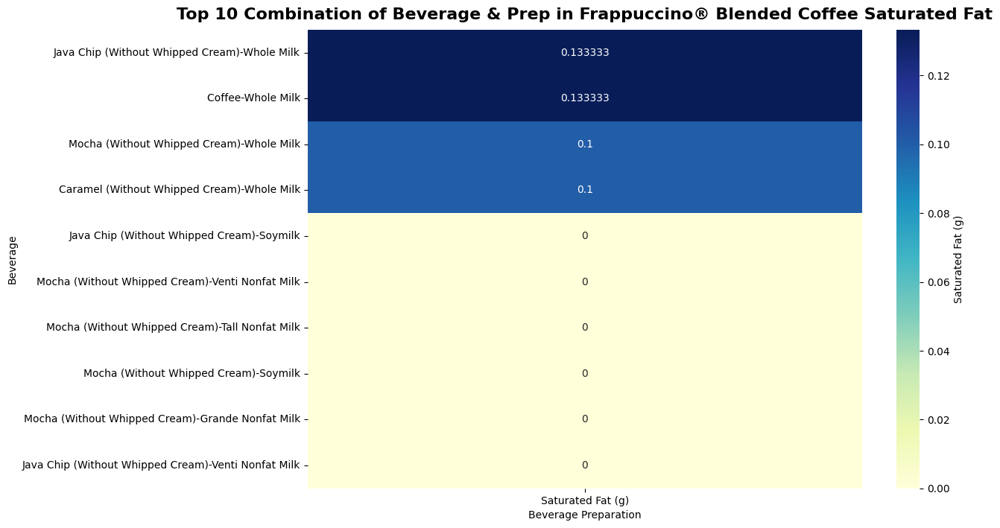

In [70]:
# Display the cross-tabulation sorted by highest saturated fat
top_10_saturated_fat = cross_tab_sorted_saturated_fat.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_saturated_fat, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Saturated Fat (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Saturated Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Saturated Fat**

In [71]:
# Create a cross-tabulation without 'All' column
cross_tab_saturated_fat = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Saturated Fat (g)', values=df_Frali['Saturated Fat (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest saturated fat
cross_tab_sorted_saturated_fat = cross_tab_saturated_fat.sort_values(by='Saturated Fat (g)', ascending=False)

cross_tab_sorted_saturated_fat.head(10)


col_0                         Saturated Fat (g)
Beverage  Beverage_prep                        
Caramel   Grande Nonfat Milk                0.0
          Tall Nonfat Milk                  0.0
          Venti Nonfat Milk                 0.0
Coffee    Grande Nonfat Milk                0.0
          Tall Nonfat Milk                  0.0
          Venti Nonfat Milk                 0.0
Java Chip Grande Nonfat Milk                0.0
          Tall Nonfat Milk                  0.0
          Venti Nonfat Milk                 0.0
Mocha     Grande Nonfat Milk                0.0

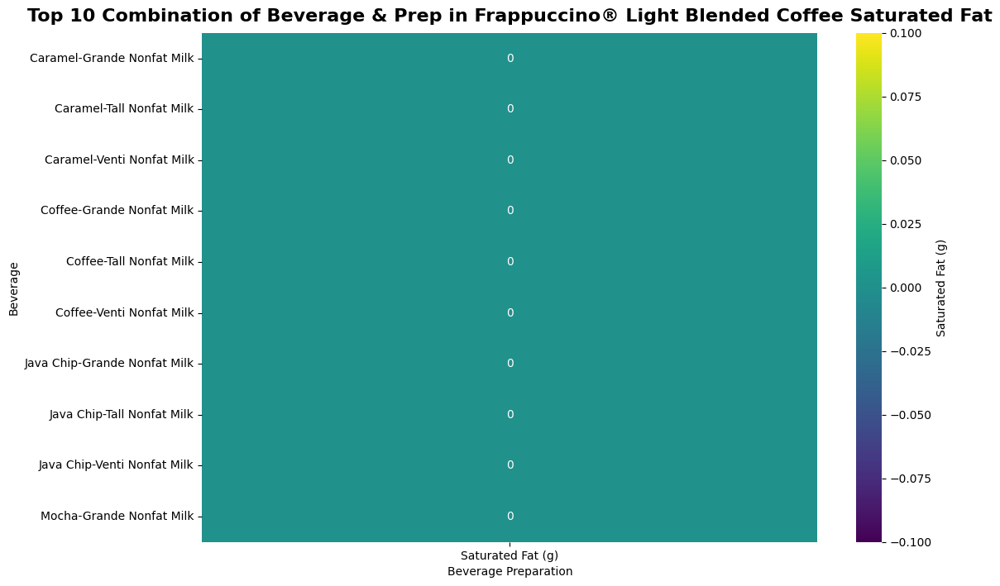

In [72]:
# Display the cross-tabulation sorted by lowest saturated fat
top_10_saturated_fat = cross_tab_sorted_saturated_fat.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_saturated_fat, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Saturated Fat (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Saturated Fat', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Saturated Fat in Frappuccino® Blended Coffee with Regression Lines**

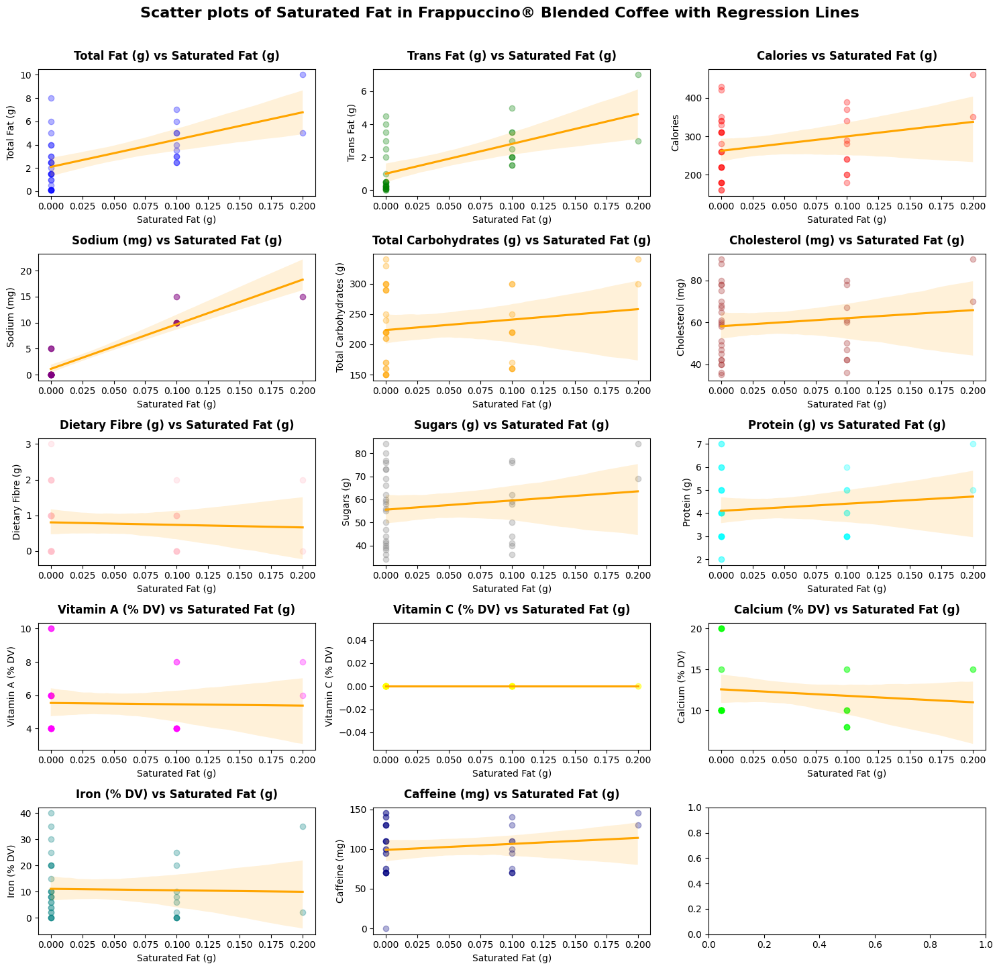

In [73]:
# Select relevant columns
numeric_columns = ['Saturated Fat (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Calories', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Fra[numeric_columns]

# Re-asurring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:], scatter_colors)):  # Exclude 'Saturated Fat (g)', and limit to the first 15 columns
    sns.regplot(data=data, x='Saturated Fat (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Saturated Fat (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Saturated Fat (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Saturated Fat in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Saturated Fat in Frappuccino® Light Blended Coffee with Regression Lines**

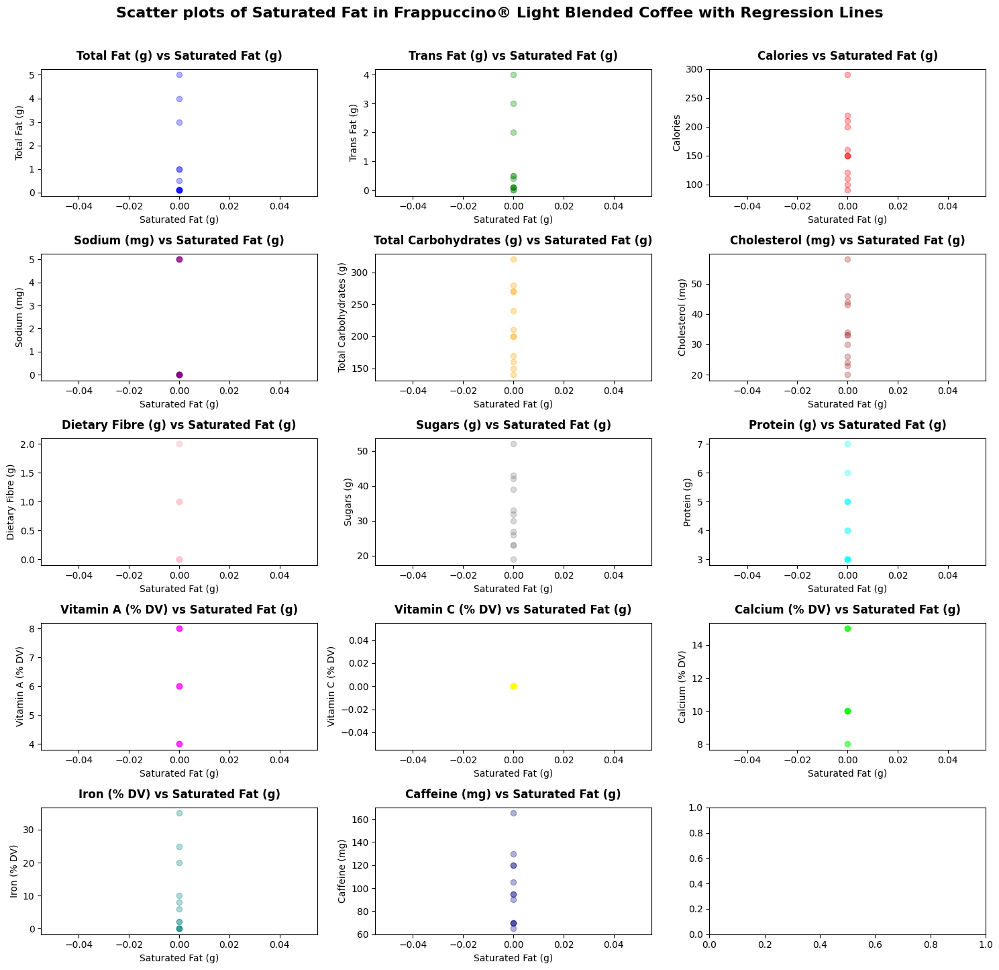

In [74]:
# Select relevant columns
numeric_columns = ['Saturated Fat (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Calories', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Frali[numeric_columns]

# Re-asurring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:], scatter_colors)):  # Exclude 'Saturated Fat (g)', and limit to the first 15 columns
    sns.regplot(data=data, x='Saturated Fat (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Saturated Fat (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Saturated Fat (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Saturated Fat in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **5. Sodium (mg) Analysis Starbuck Product**
<img src = 'https://www.heart.org/-/media/AHA/H4GM/Infographics/Excess_Sodium_infographic.png'>

## **Top 9 Beverage Categories by Average Sodium Content**

In [75]:
avg_sodium = df.groupby(['Beverage_category'])[['Sodium (mg)']].mean()


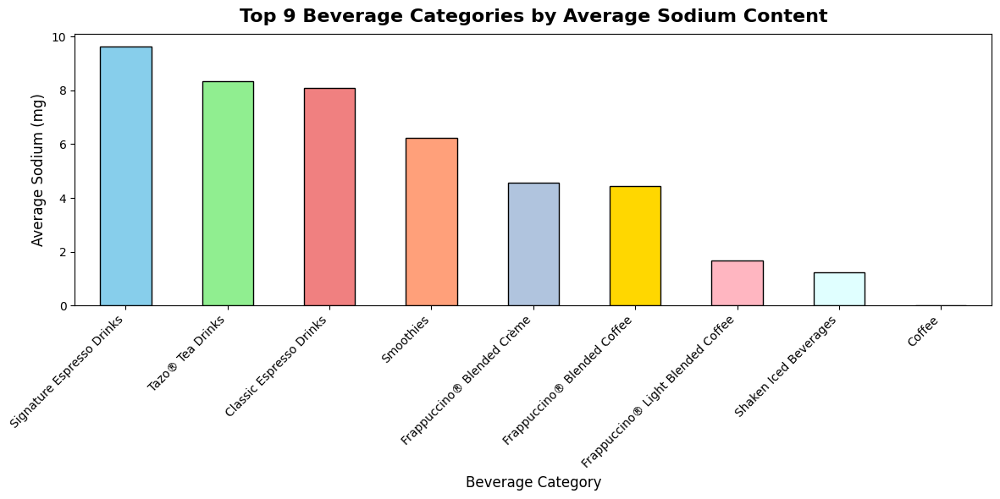

In [76]:
# Get the top 9 highest beverage categories by average sodium
top_9_avg_sodium = avg_sodium.sort_values(by='Sodium (mg)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_sodium['Sodium (mg)'].plot(kind='bar', color=colors, edgecolor='black')


# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Sodium Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Sodium (mg)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Sodium in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [77]:
avg_sodium = df_Fra.groupby('Beverage')[['Sodium (mg)']].mean()


In [78]:
avg_sodium1 = df_Frali.groupby('Beverage')[['Sodium (mg)']].mean()


In [79]:
top_5_highest_sodium = avg_sodium.sort_values(by='Sodium (mg)', ascending=False).head(5)


In [80]:
top_5_lowest_sodium = avg_sodium1.sort_values(by='Sodium (mg)', ascending=True).head(5)


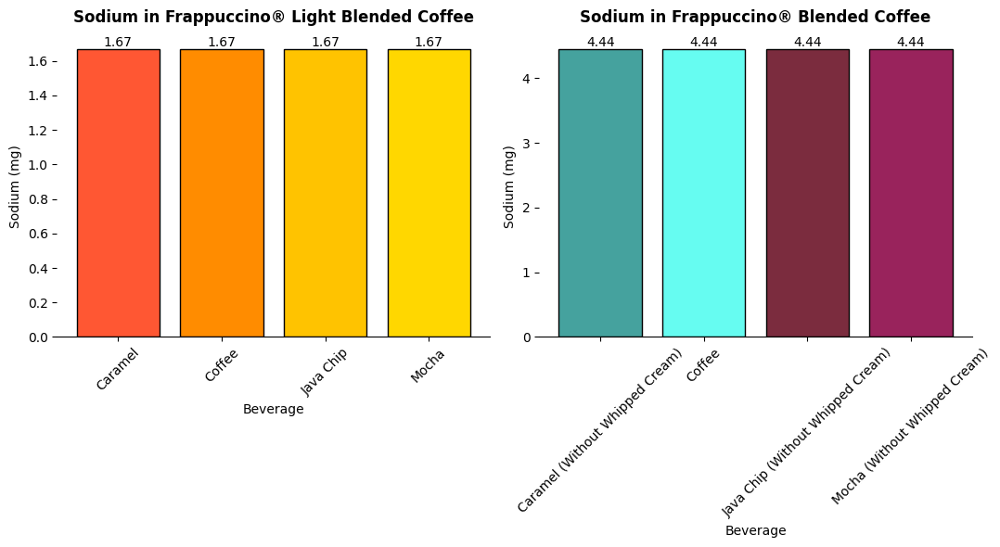

In [81]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest sodium
bars1 = axes[0].bar(top_5_lowest_sodium.index, top_5_lowest_sodium['Sodium (mg)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Sodium in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Sodium (mg)')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest sodium
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest sodium
bars2 = axes[1].bar(top_5_highest_sodium.index, top_5_highest_sodium['Sodium (mg)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Sodium in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Sodium (mg)')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest sodium
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee average Sodium Content**

In [82]:
# Create a cross-tabulation without 'All' column
cross_tab_sodium = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Sodium (mg)', values=df_Fra['Sodium (mg)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest sodium
cross_tab_sodium_sorted = cross_tab_sodium.sort_values(by='Sodium (mg)', ascending=False)

cross_tab_sodium_sorted.head(5)


,col_0,Sodium (mg)
Beverage,Beverage_prep,
Mocha (Without Whipped Cream),Whole Milk,11.666667
Caramel (Without Whipped Cream),Whole Milk,11.666667
Coffee,Whole Milk,11.666667
Java Chip (Without Whipped Cream),Whole Milk,11.666667
Mocha (Without Whipped Cream),Venti Nonfat Milk,5.000000


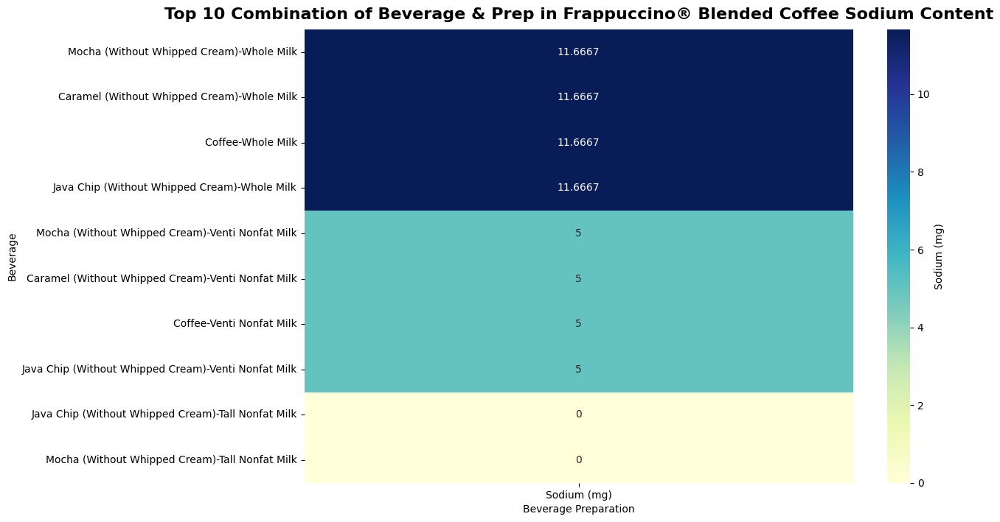

In [83]:
# Display the cross-tabulation sorted by highest sodium
top_10_sodium = cross_tab_sodium_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_sodium, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Sodium (mg)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Sodium Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Sodium Content**

In [84]:
# Create a cross-tabulation without 'All' column
cross_tab_sodium = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Sodium (mg)', values=df_Frali['Sodium (mg)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest sodium
cross_tab_sodium_sorted = cross_tab_sodium.sort_values(by='Sodium (mg)', ascending=False)

cross_tab_sodium_sorted.head(10)


col_0                         Sodium (mg)
Beverage  Beverage_prep                  
Caramel   Venti Nonfat Milk           5.0
Coffee    Venti Nonfat Milk           5.0
Java Chip Venti Nonfat Milk           5.0
Mocha     Venti Nonfat Milk           5.0
Caramel   Grande Nonfat Milk          0.0
          Tall Nonfat Milk            0.0
Coffee    Grande Nonfat Milk          0.0
          Tall Nonfat Milk            0.0
Java Chip Grande Nonfat Milk          0.0
          Tall Nonfat Milk            0.0

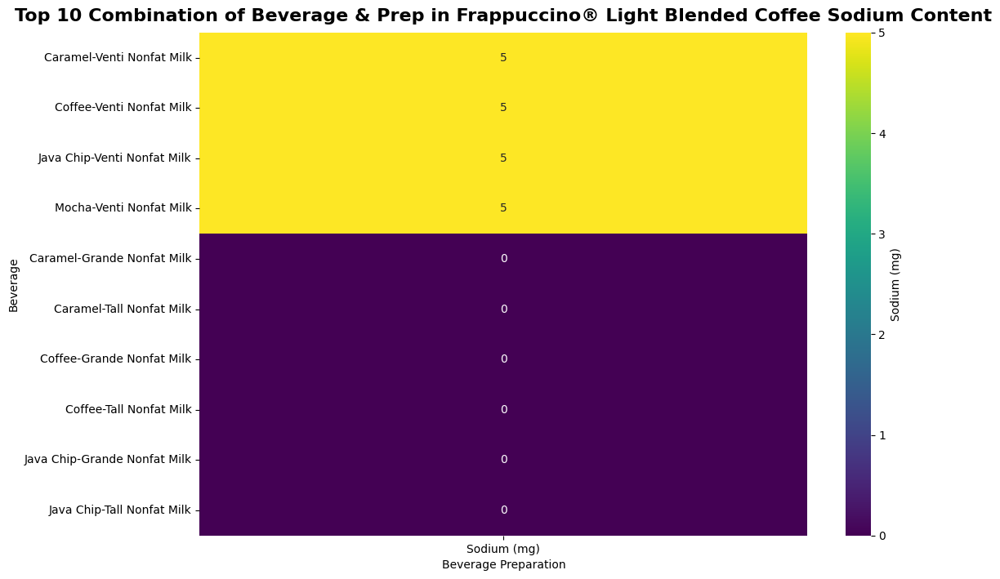

In [85]:
# Display the cross-tabulation sorted by lowest sodium
top_10_sodium = cross_tab_sodium_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_sodium, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Sodium (mg)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Sodium Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Sodium in Frappuccino® Light Blended Coffee with Regression Lines**

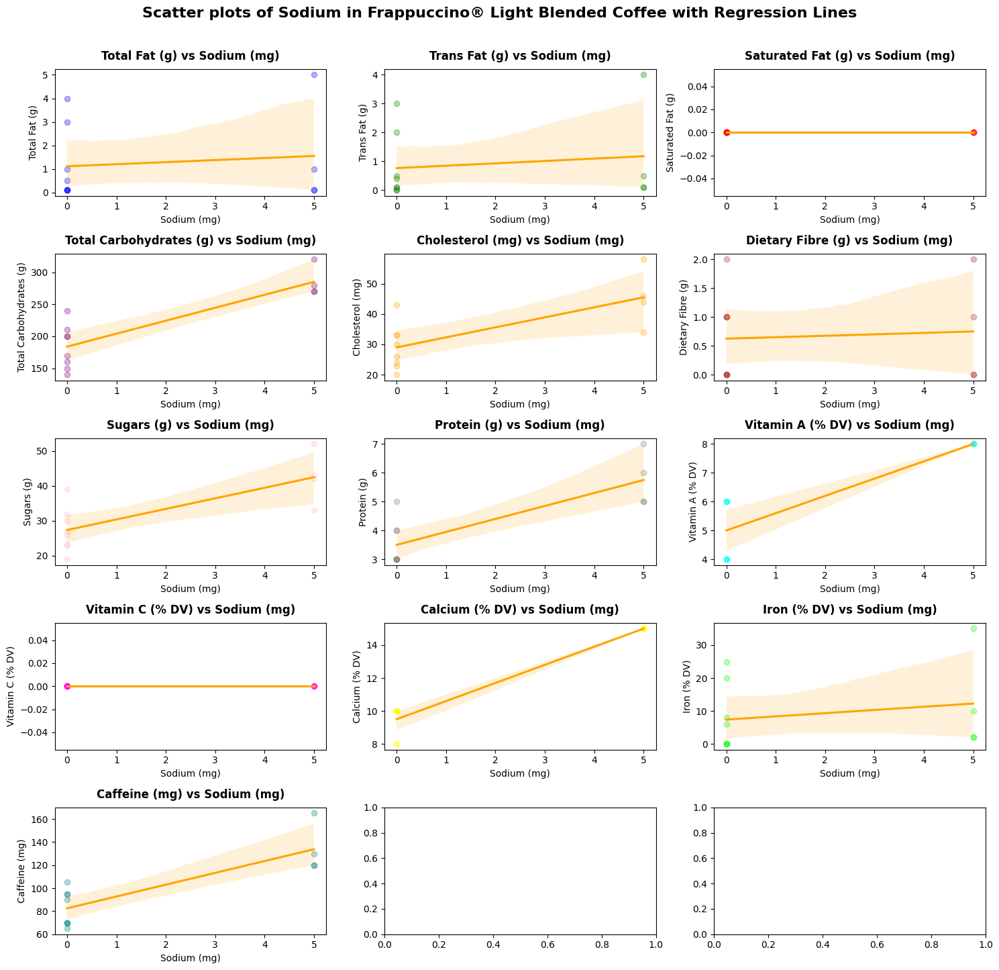

In [86]:
# Select relevant columns
numeric_columns = ['Sodium (mg)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Total Carbohydrates (g)',
                   'Cholesterol (mg)', 'Dietary Fibre (g)', 'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)',
                   'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Frali[numeric_columns]

# Re-assuring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:], scatter_colors)):  # Exclude 'Sodium (mg)', and limit to the first 14 columns
    sns.regplot(data=data, x='Sodium (mg)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Sodium (mg)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Sodium (mg)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Sodium in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Sodium in Frappuccino® Blended Coffee with Regression Lines**

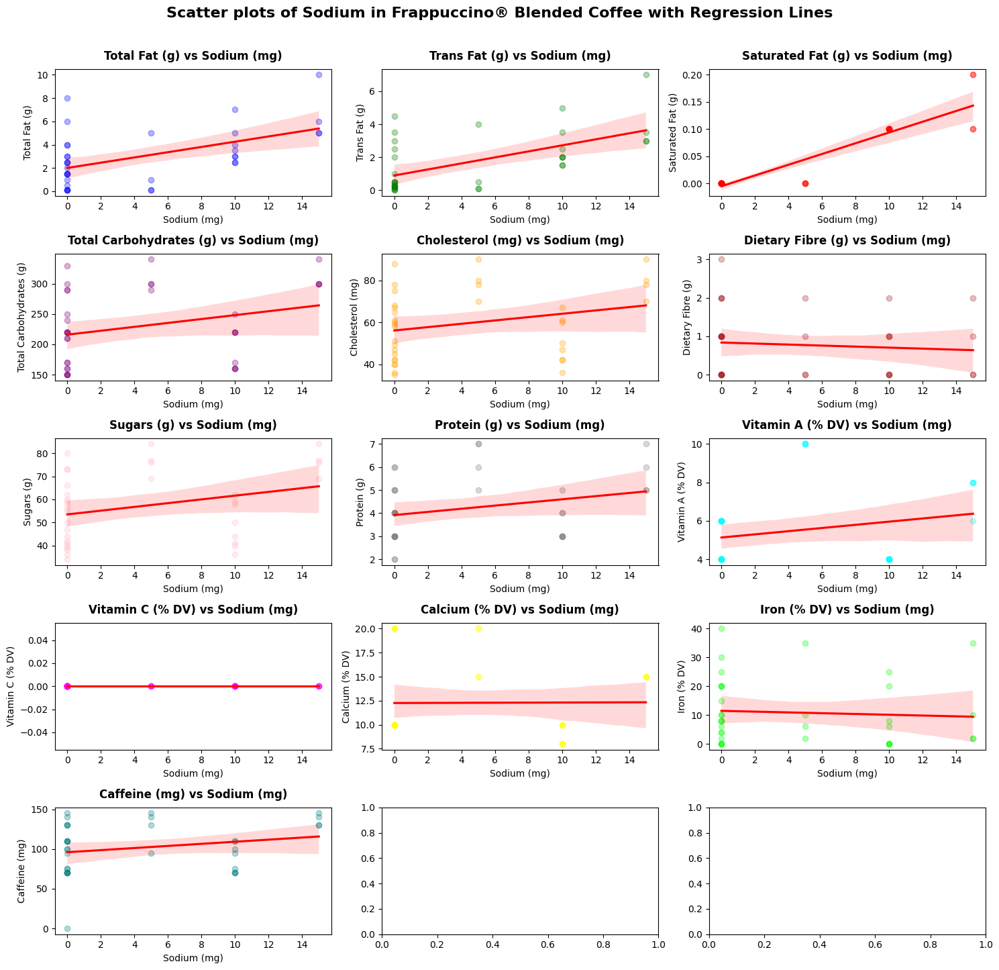

In [224]:
# Select relevant columns
numeric_columns = ['Sodium (mg)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Total Carbohydrates (g)',
                   'Cholesterol (mg)', 'Dietary Fibre (g)', 'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)',
                   'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Fra[numeric_columns]

# Re-assuring to any remaining Handling missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:], scatter_colors)):  # Exclude 'Sodium (mg)', and limit to the first 14 columns
    sns.regplot(data=data, x='Sodium (mg)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Sodium (mg)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Sodium (mg)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Sodium in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **6. Total Carbohydrates (g) Analysis Starbuck Product**
<img src ='https://sciencenotes.org/wp-content/uploads/2022/10/Examples-of-Carbohydrates.png'>

## **Top 9 Beverage Categories by Average Total Carbohydrates**

In [88]:
# Calculate average total carbohydrates for each beverage category
avg_carbohydrates = df.groupby(['Beverage_category'])[['Total Carbohydrates (g)']].mean()


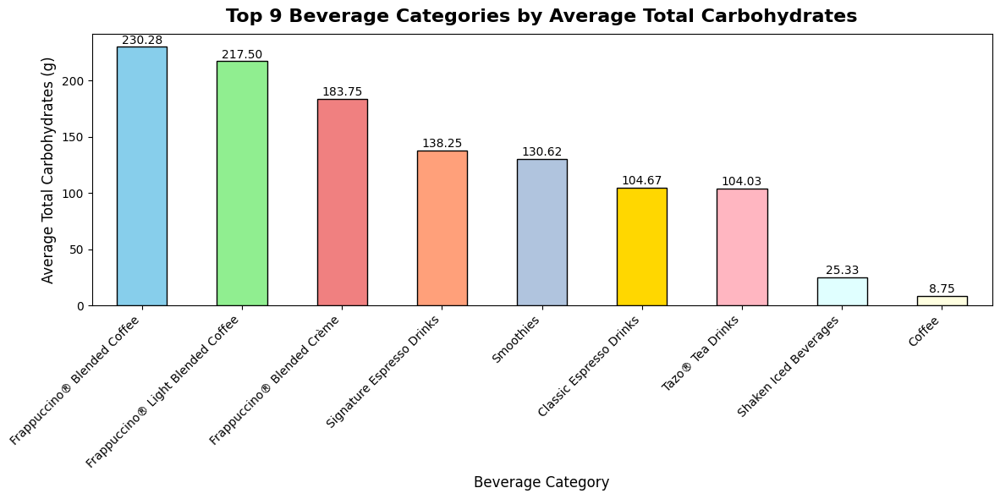

In [89]:
# Get the top 9 highest beverage categories by average total carbohydrates
top_9_avg_carbohydrates = avg_carbohydrates.sort_values(by='Total Carbohydrates (g)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_carbohydrates['Total Carbohydrates (g)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_carbohydrates['Total Carbohydrates (g)']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Total Carbohydrates', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Total Carbohydrates (g)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Total Carbohydrates in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [90]:
# Calculate average total carbohydrates for each beverage category
avg_carbohydrates = df_Fra.groupby('Beverage')[['Total Carbohydrates (g)']].mean()

# Display the first few rows of the result
avg_carbohydrates.head()


,Total Carbohydrates (g)
Beverage,
Caramel (Without Whipped Cream),223.333333
Coffee,223.333333
Java Chip (Without Whipped Cream),251.111111
Mocha (Without Whipped Cream),223.333333


In [91]:
# Calculate average total carbohydrates for each beverage category
avg_carbohydrates1 = df_Frali.groupby('Beverage')[['Total Carbohydrates (g)']].mean()

# Display the first few rows of the result
avg_carbohydrates1.head()


,Total Carbohydrates (g)
Beverage,
Caramel,203.333333
Coffee,213.333333
Java Chip,243.333333
Mocha,210.000000


In [92]:
# Sort the DataFrame by 'Total Carbohydrates (g)' column in descending order
top_5_highest_carbohydrates = avg_carbohydrates.sort_values(by='Total Carbohydrates (g)', ascending=False).head(5)


In [93]:
# Sort the DataFrame by 'Total Carbohydrates (g)' column in ascending order
top_5_lowest_carbohydrates = avg_carbohydrates1.sort_values(by='Total Carbohydrates (g)', ascending=True).head(5)


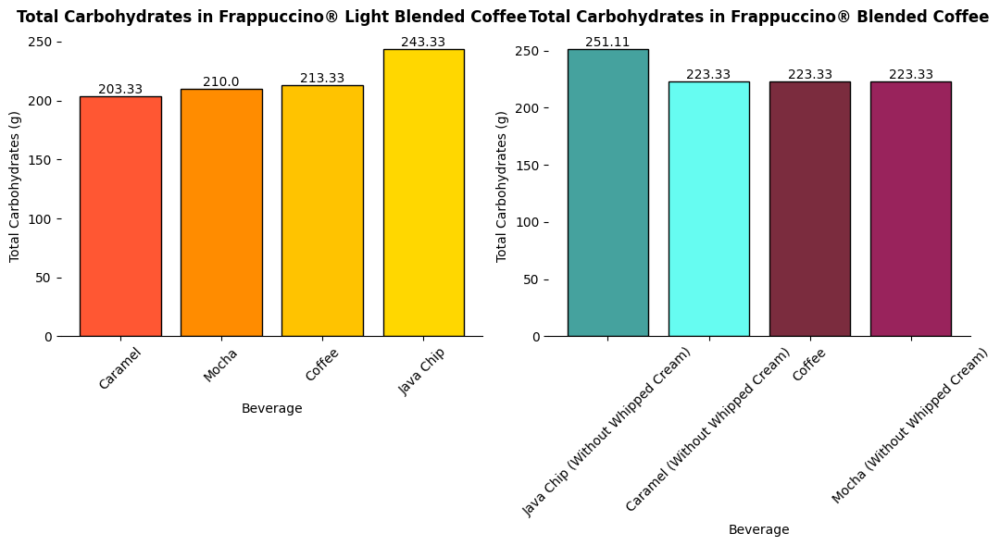

In [94]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest carbohydrates
bars1 = axes[0].bar(top_5_lowest_carbohydrates.index, top_5_lowest_carbohydrates['Total Carbohydrates (g)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Total Carbohydrates in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Total Carbohydrates (g)')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest carbohydrates
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest carbohydrates
bars2 = axes[1].bar(top_5_highest_carbohydrates.index, top_5_highest_carbohydrates['Total Carbohydrates (g)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Total Carbohydrates in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Total Carbohydrates (g)')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest carbohydrates
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Average Carbohydrates**

In [95]:
# Create a cross-tabulation without 'All' column
cross_tab_carbo = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Total Carbohydrates (g)', values=df_Fra['Total Carbohydrates (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest total carbohydrates
cross_tab_sorted_carbo = cross_tab_carbo.sort_values(by='Total Carbohydrates (g)', ascending=True)

cross_tab_sorted_carbo.head(5)


,col_0,Total Carbohydrates (g)
Beverage,Beverage_prep,
Mocha (Without Whipped Cream),Tall Nonfat Milk,150.0
Caramel (Without Whipped Cream),Tall Nonfat Milk,160.0
Coffee,Tall Nonfat Milk,160.0
Java Chip (Without Whipped Cream),Tall Nonfat Milk,170.0
Coffee,Grande Nonfat Milk,210.0


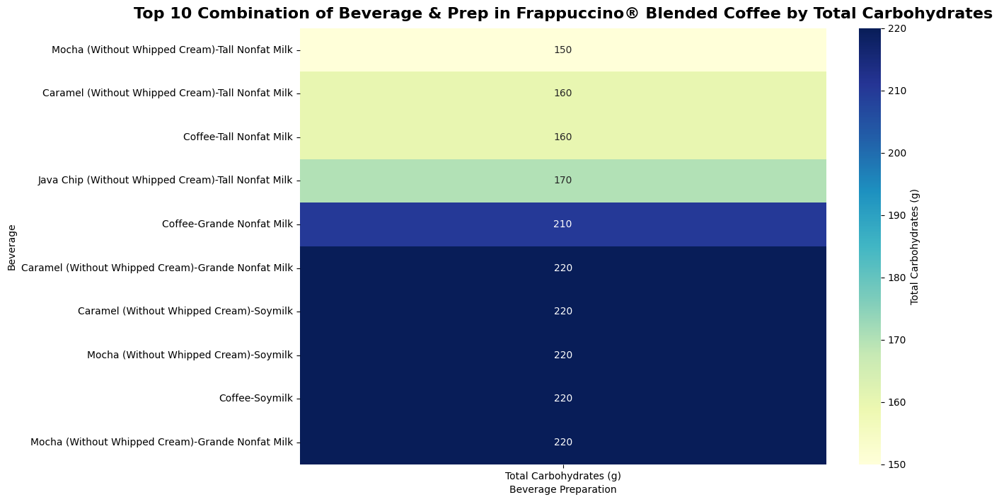

In [96]:
# Display the cross-tabulation sorted by highest total carbohydrates
top_10_carbo = cross_tab_sorted_carbo.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_carbo, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Total Carbohydrates (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Total Carbohydrates', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()

## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Average Carbohydrates**

In [97]:
# Create a cross-tabulation without 'All' column
cross_tab_carbo = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Total Carbohydrates (g)', values=df_Frali['Total Carbohydrates (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest total carbohydrates
cross_tab_sorted_carbo = cross_tab_carbo.sort_values(by='Total Carbohydrates (g)', ascending=True)

cross_tab_sorted_carbo.head(10)

,col_0,Total Carbohydrates (g)
Beverage,Beverage_prep,
Caramel,Tall Nonfat Milk,140.0
Mocha,Tall Nonfat Milk,150.0
Coffee,Tall Nonfat Milk,160.0
Java Chip,Tall Nonfat Milk,170.0
Caramel,Grande Nonfat Milk,200.0
Mocha,Grande Nonfat Milk,200.0
Coffee,Grande Nonfat Milk,210.0
Java Chip,Grande Nonfat Milk,240.0
Caramel,Venti Nonfat Milk,270.0


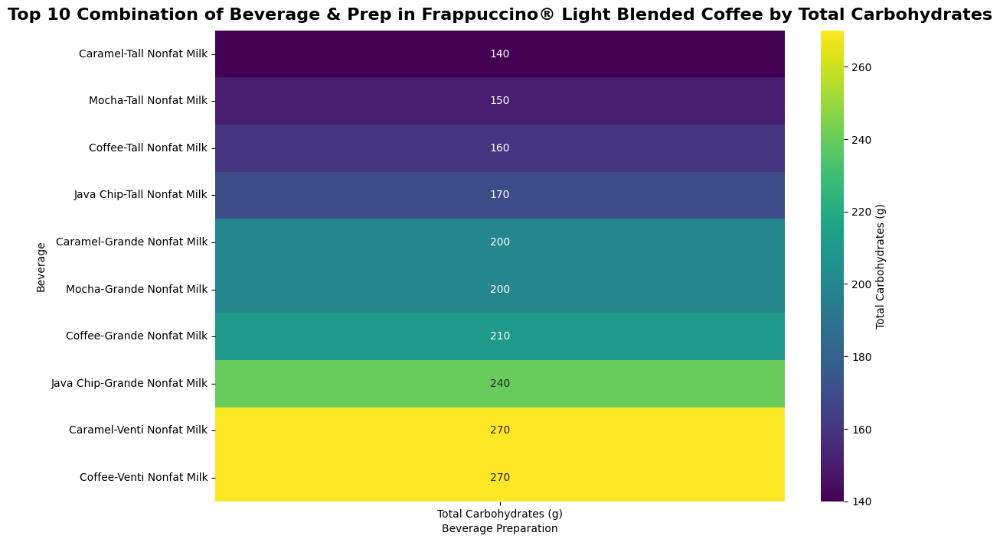

In [98]:
# Display the cross-tabulation sorted by lowest total carbohydrates
top_10_carbo = cross_tab_sorted_carbo.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_carbo, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Total Carbohydrates (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Total Carbohydrates', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Average Total Carbohydrates in Frappuccino® Blended Coffee with Regression Lines**

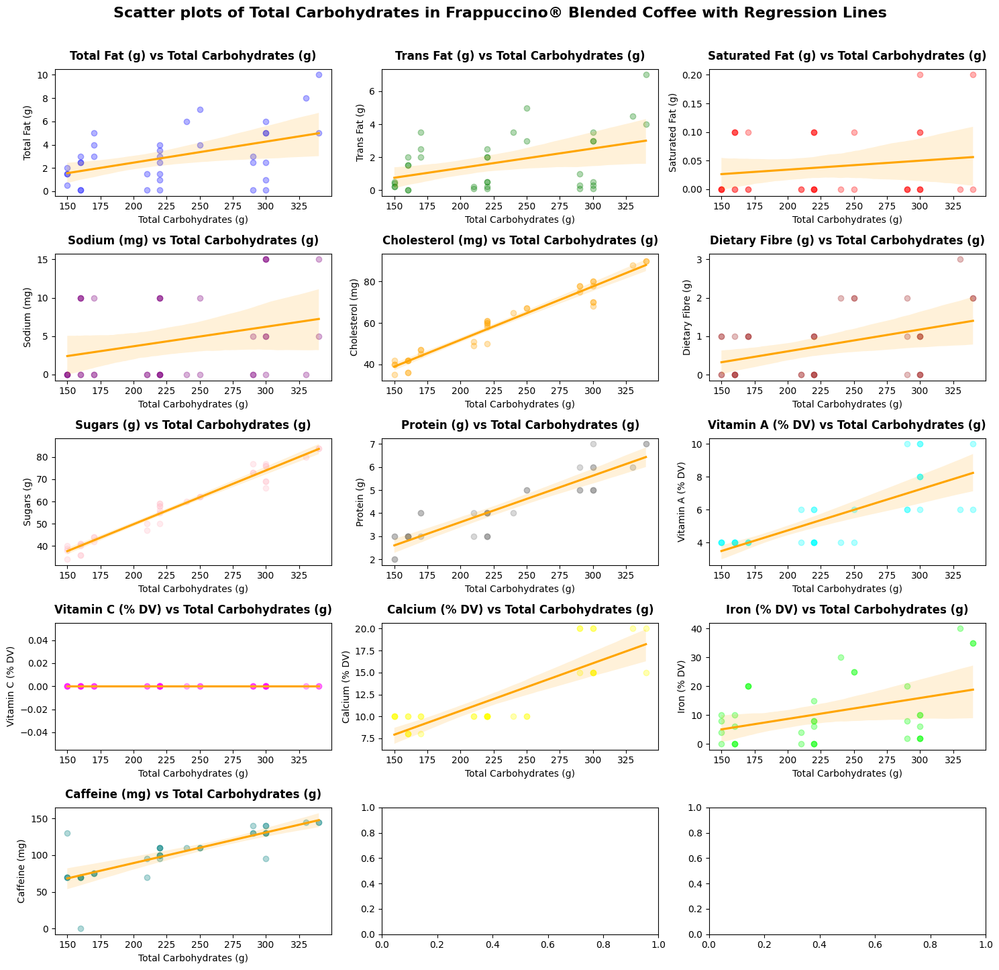

In [99]:
# Select relevant columns
numeric_columns_carbo = ['Total Carbohydrates (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                          'Cholesterol (mg)', 'Dietary Fibre (g)', 'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)',
                          'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_carbo = df_Fra[numeric_columns_carbo]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_carbo = data_carbo.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_carbo[1:], scatter_colors)):  # Exclude 'Total Carbohydrates (g)'
    sns.regplot(data=data_carbo, x='Total Carbohydrates (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Total Carbohydrates (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Total Carbohydrates (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Total Carbohydrates in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Average Total Carbohydrates in Frappuccino® Light Blended Coffee with Regression Lines**

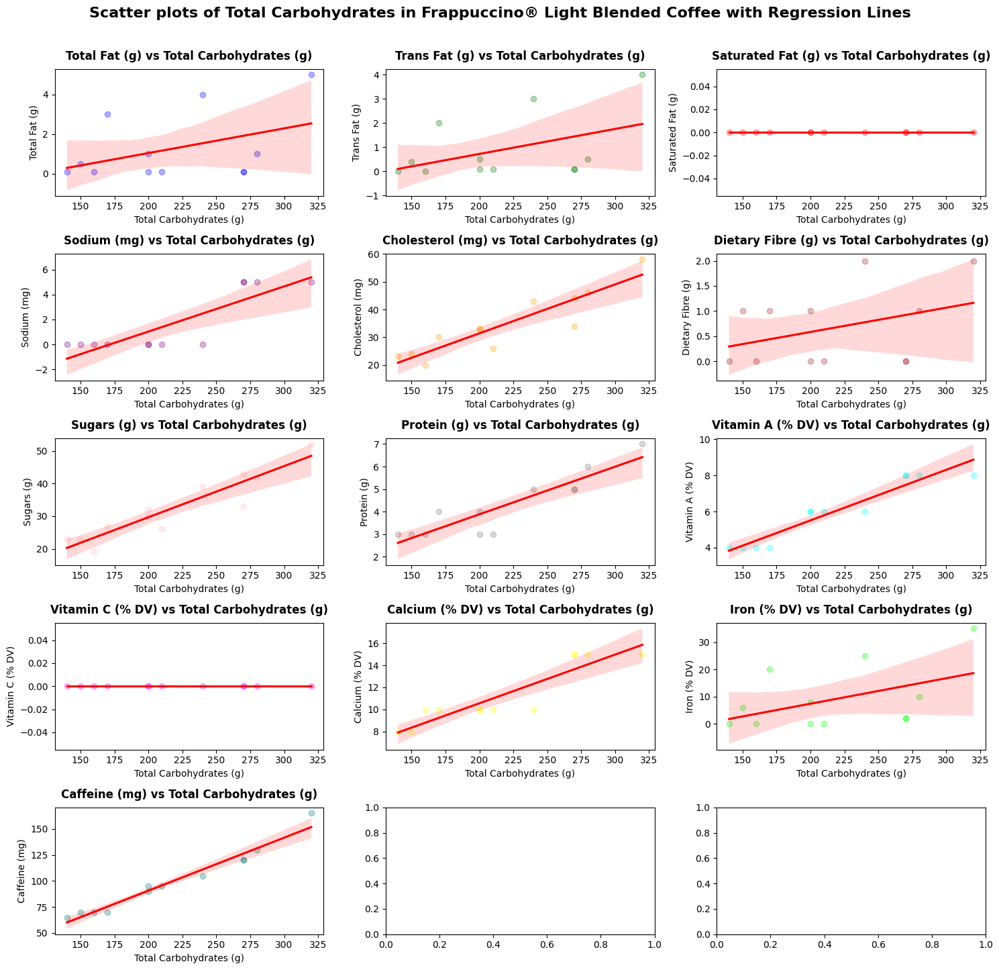

In [100]:
# Select relevant columns
numeric_columns_carbo = ['Total Carbohydrates (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                          'Cholesterol (mg)', 'Dietary Fibre (g)', 'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)',
                          'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_carbo = df_Frali[numeric_columns_carbo]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_carbo = data_carbo.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_carbo[1:], scatter_colors)):  # Exclude 'Total Carbohydrates (g)'
    sns.regplot(data=data_carbo, x='Total Carbohydrates (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Total Carbohydrates (g)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Total Carbohydrates (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Total Carbohydrates in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **7. Cholesterol (mg) Analysis Starbuck Product**
<img src = 'https://www.singhealth.com.sg/sites/shcommonassets/Assets/Food-type-new.png'>

## **Top 9 Beverage Categories by Average Cholesterol**

In [101]:
# Calculate average cholesterol for each beverage category
avg_cholesterol = df.groupby(['Beverage_category'])[['Cholesterol (mg)']].mean()


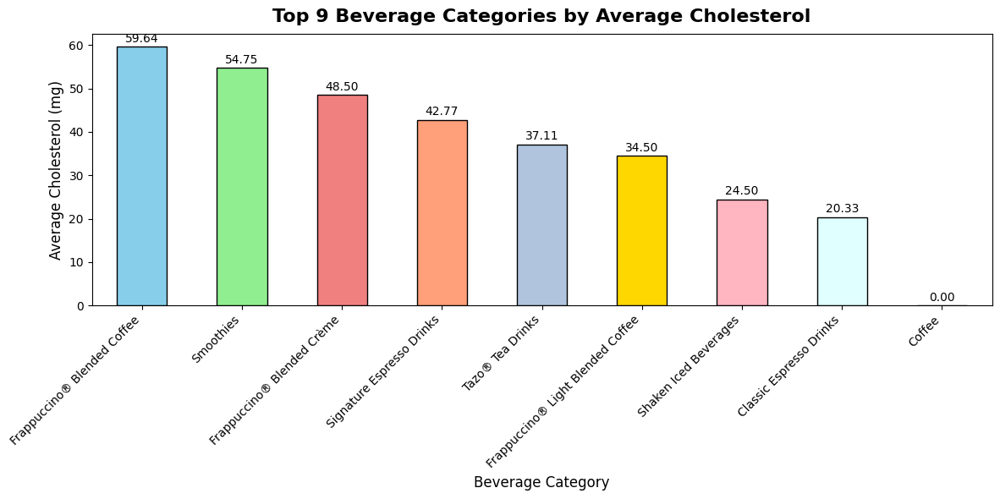

In [102]:
# Get the top 9 highest beverage categories by average cholesterol
top_9_avg_cholesterol = avg_cholesterol.sort_values(by='Cholesterol (mg)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_cholesterol['Cholesterol (mg)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_cholesterol['Cholesterol (mg)']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Cholesterol', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Cholesterol (mg)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Cholesterol in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [103]:
# Calculate average cholesterol for each beverage
avg_cholesterol = df_Fra.groupby('Beverage')[['Cholesterol (mg)']].mean()

avg_cholesterol.head()


,Cholesterol (mg)
Beverage,
Caramel (Without Whipped Cream),59.222222
Coffee,51.666667
Java Chip (Without Whipped Cream),67.333333
Mocha (Without Whipped Cream),60.333333


In [104]:
# Calculate average cholesterol for each beverage
avg_cholesterol1 = df_Frali.groupby('Beverage')[['Cholesterol (mg)']].mean()

avg_cholesterol1.head()


,Cholesterol (mg)
Beverage,
Caramel,33.333333
Coffee,26.666667
Java Chip,43.666667
Mocha,34.333333


In [105]:
# Sort the DataFrame by 'Cholesterol (mg)' column in descending order to get the highest values
top_5_highest_cholesterol = avg_cholesterol.sort_values(by='Cholesterol (mg)', ascending=False).head(5)

# Display the result
top_5_highest_cholesterol


,Cholesterol (mg)
Beverage,
Java Chip (Without Whipped Cream),67.333333
Mocha (Without Whipped Cream),60.333333
Caramel (Without Whipped Cream),59.222222
Coffee,51.666667


In [106]:
# Sort the DataFrame by 'Cholesterol (mg)' column in ascending order to get the lowest values
top_5_lowest_cholesterol = avg_cholesterol1.sort_values(by='Cholesterol (mg)', ascending=True).head(5)

# Display the result
top_5_lowest_cholesterol


,Cholesterol (mg)
Beverage,
Coffee,26.666667
Caramel,33.333333
Mocha,34.333333
Java Chip,43.666667


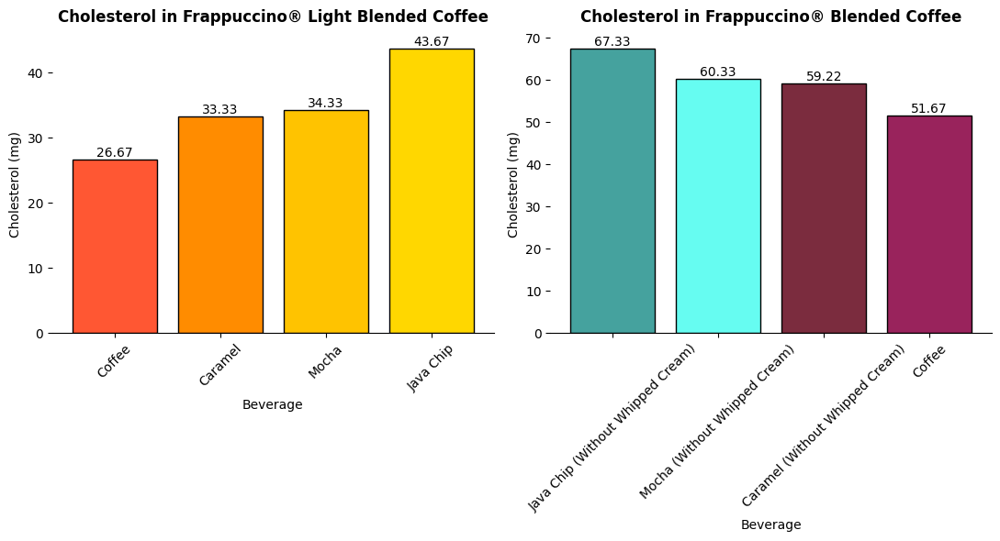

In [107]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest cholesterol
bars1 = axes[0].bar(top_5_lowest_cholesterol.index, top_5_lowest_cholesterol['Cholesterol (mg)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Cholesterol in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Cholesterol (mg)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest cholesterol
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest cholesterol
bars2 = axes[1].bar(top_5_highest_cholesterol.index, top_5_highest_cholesterol['Cholesterol (mg)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Cholesterol in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Cholesterol (mg)')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest cholesterol
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Average Cholesterol**

In [108]:
# Create a cross-tabulation without 'All' column for Cholesterol
cross_tab_cholesterol = pd.crosstab(
    index=[df_Fra['Beverage'], df_Fra['Beverage_prep']],
    columns='Cholesterol',
    values=df_Fra['Cholesterol (mg)'],
    aggfunc='mean'
)

# Display the cross-tabulation sorted by lowest cholesterol
cross_tab_cholesterol_sorted = cross_tab_cholesterol.sort_values(by='Cholesterol', ascending=False)

cross_tab_cholesterol_sorted.head(5)


,col_0,Cholesterol
Beverage,Beverage_prep,
Java Chip (Without Whipped Cream),Venti Nonfat Milk,90.0
Mocha (Without Whipped Cream),Venti Nonfat Milk,80.0
Caramel (Without Whipped Cream),Venti Nonfat Milk,78.0
Coffee,Venti Nonfat Milk,70.0
Java Chip (Without Whipped Cream),Whole Milk,68.0


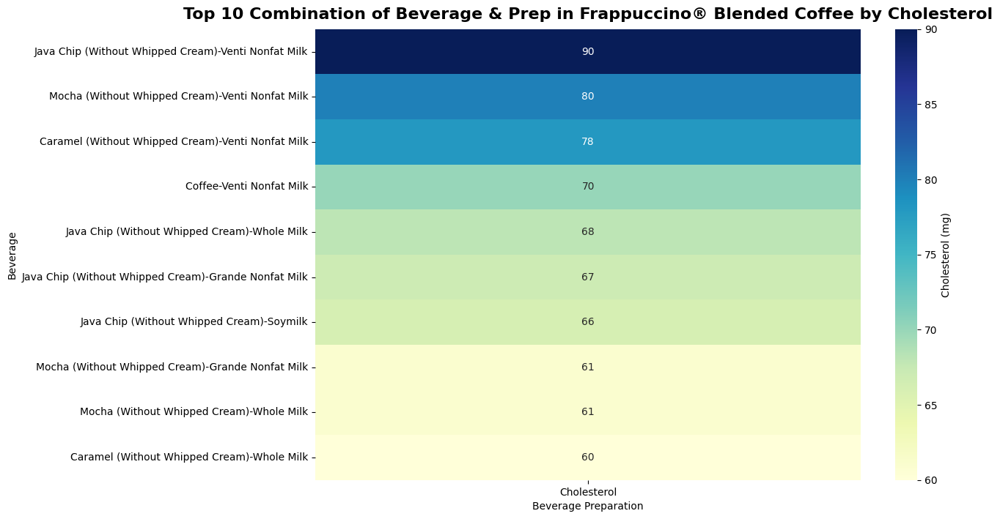

In [109]:
# Display the cross-tabulation sorted by highest cholesterol
top_10_cholesterol = cross_tab_cholesterol_sorted.head(10)

# Create a heatmap for Cholesterol
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_cholesterol, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Cholesterol (mg)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Cholesterol', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Average Cholesterol**

In [110]:
# Create a cross-tabulation without 'All' column for Cholesterol
cross_tab_cholesterol = pd.crosstab(
    index=[df_Frali['Beverage'], df_Frali['Beverage_prep']],
    columns='Cholesterol',
    values=df_Frali['Cholesterol (mg)'],
    aggfunc='mean'
)

# Display the cross-tabulation sorted by lowest cholesterol
cross_tab_cholesterol_sorted = cross_tab_cholesterol.sort_values(by='Cholesterol', ascending=False)

cross_tab_cholesterol_sorted.head(10)


,col_0,Cholesterol
Beverage,Beverage_prep,
Java Chip,Venti Nonfat Milk,58.0
Mocha,Venti Nonfat Milk,46.0
Caramel,Venti Nonfat Milk,44.0
Java Chip,Grande Nonfat Milk,43.0
Coffee,Venti Nonfat Milk,34.0
Caramel,Grande Nonfat Milk,33.0
Mocha,Grande Nonfat Milk,33.0
Java Chip,Tall Nonfat Milk,30.0
Coffee,Grande Nonfat Milk,26.0


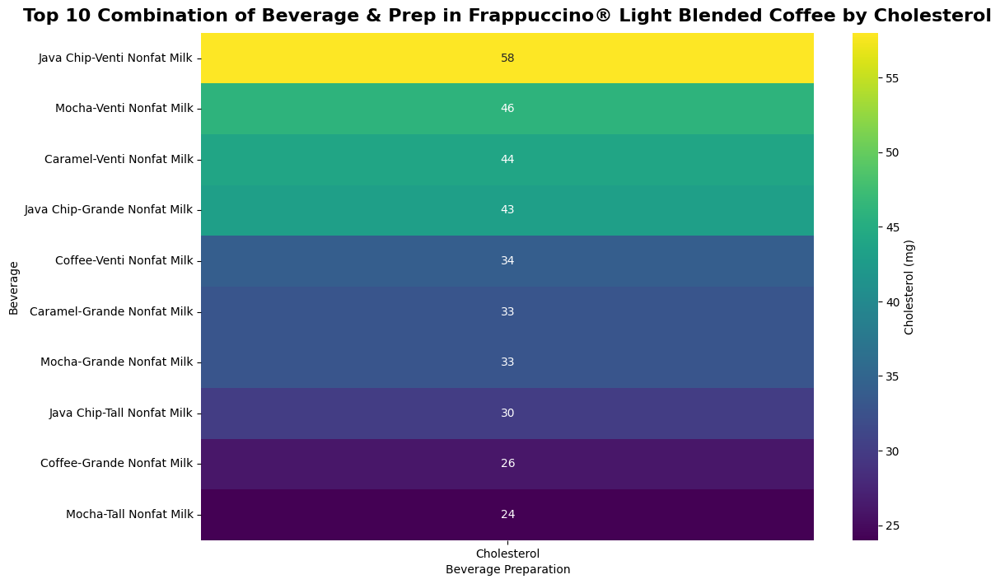

In [111]:
# Display the cross-tabulation sorted by lowest cholesterol
top_10_cholesterol = cross_tab_cholesterol_sorted.head(10)

# Create a heatmap for Cholesterol
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_cholesterol, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Cholesterol (mg)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Cholesterol', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Cholesterol in Frappuccino® Blended Coffee with Regression Lines**

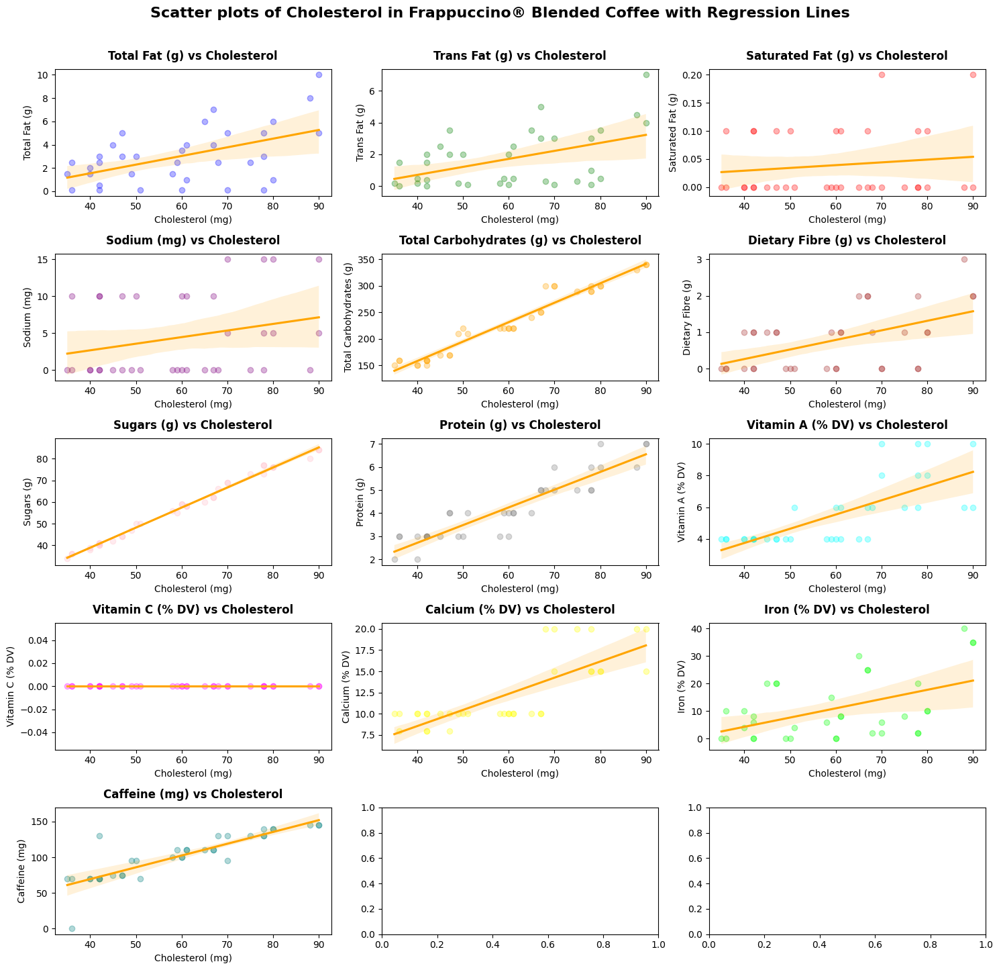

In [112]:
# Select relevant columns
numeric_columns = ['Cholesterol (mg)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Dietary Fibre (g)', 'Sugars (g)', 'Protein (g)',
                   'Vitamin A (% DV)', 'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Fra[numeric_columns]

# Re-assuring to handle any remaining missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:], scatter_colors)):  # Exclude 'Cholesterol (mg)', and limit to the first 15 columns
    sns.regplot(data=data, x='Cholesterol (mg)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Cholesterol', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Cholesterol (mg)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Cholesterol in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Cholesterol in Frappuccino® Light Blended Coffee with Regression Lines**

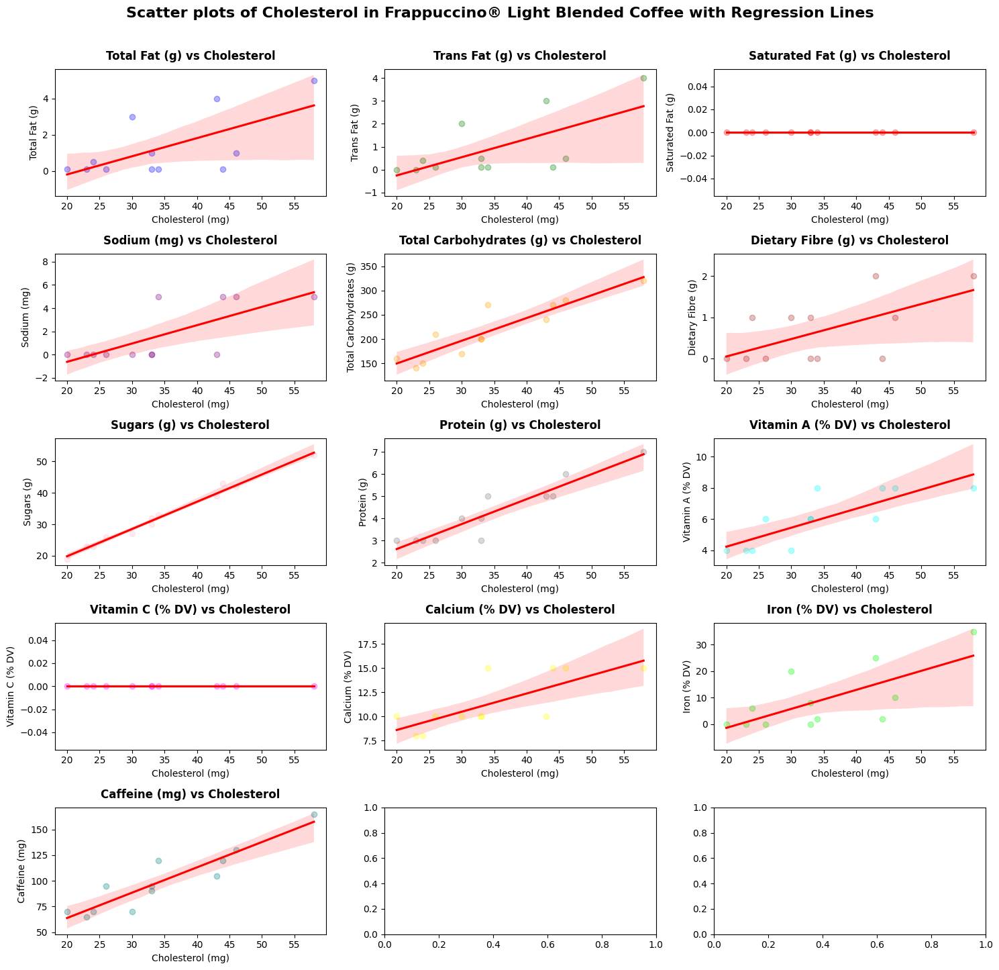

In [113]:
# Select relevant columns
numeric_columns = ['Cholesterol (mg)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Dietary Fibre (g)', 'Sugars (g)', 'Protein (g)',
                   'Vitamin A (% DV)', 'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data = df_Frali[numeric_columns]

# Re-assuring to handle any remaining missing values by dropping rows with any missing values
data = data.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:], scatter_colors)):  # Exclude 'Cholesterol (mg)', and limit to the first 15 columns
    sns.regplot(data=data, x='Cholesterol (mg)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Cholesterol', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Cholesterol (mg)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Cholesterol in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **8. Dietary Fibre (g) Analysis Starbuck Product**
<img src = 'https://www.mdpi.com/biomedicines/biomedicines-10-01242/article_deploy/html/images/biomedicines-10-01242-g001.png'>

## **Top 9 Beverage Categories by Average Dietary Fiber**

In [114]:
avg_dietary_fiber = df.groupby(['Beverage_category'])[['Dietary Fibre (g)']].mean()


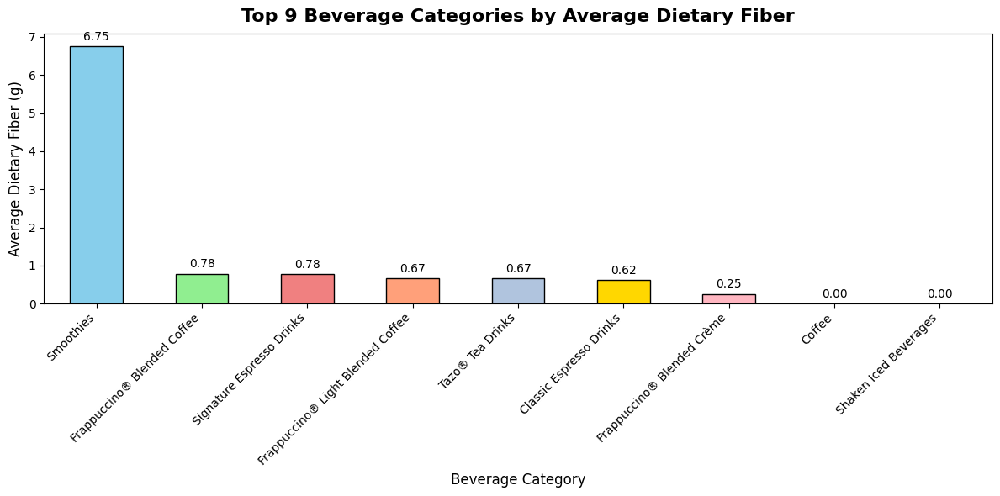

In [115]:
# Get the top 9 highest beverage categories by average dietary fiber
top_9_avg_dietary_fiber = avg_dietary_fiber.sort_values(by='Dietary Fibre (g)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_dietary_fiber['Dietary Fibre (g)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_dietary_fiber['Dietary Fibre (g)']):
    plt.text(i, value + 0.1, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Dietary Fiber', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Dietary Fiber (g)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Dietary Fiber in Frappuccino® Blended Coffee & Frappuccino® Light Blended Coffee**

In [116]:
avg_dietary_fiber = df_Fra.groupby('Beverage')[['Dietary Fibre (g)']].mean()


In [117]:
avg_dietary_fiber1 = df_Frali.groupby('Beverage')[['Dietary Fibre (g)']].mean()


In [118]:
top_5_highest_dietary_fiber = avg_dietary_fiber.sort_values(by='Dietary Fibre (g)', ascending=False).head(5)


In [119]:
top_5_lowest_dietary_fiber = avg_dietary_fiber1.sort_values(by='Dietary Fibre (g)', ascending=True).head(5)


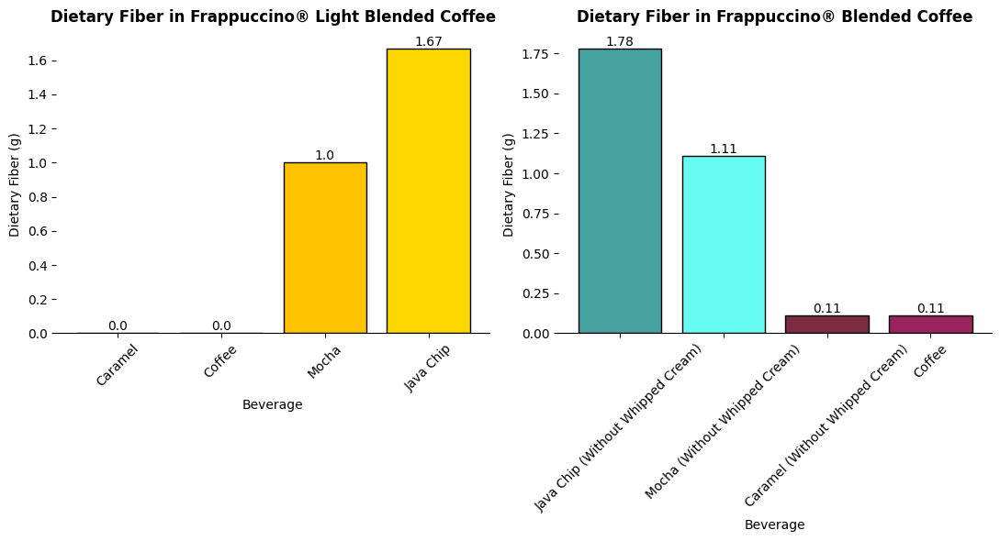

In [120]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest dietary fiber
bars1 = axes[0].bar(top_5_lowest_dietary_fiber.index, top_5_lowest_dietary_fiber['Dietary Fibre (g)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Dietary Fiber in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Dietary Fiber (g)')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest dietary fiber
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest dietary fiber
bars2 = axes[1].bar(top_5_highest_dietary_fiber.index, top_5_highest_dietary_fiber['Dietary Fibre (g)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Dietary Fiber in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Dietary Fiber (g)')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest dietary fiber
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Dietary Fiber**

In [121]:
# Create a cross-tabulation without 'All' column for Dietary Fiber
cross_tab_dietary = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Dietary Fiber (g)', values=df_Fra['Dietary Fibre (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest dietary fiber
cross_tab_dietary_sorted = cross_tab_dietary.sort_values(by='Dietary Fiber (g)', ascending=False)

cross_tab_dietary_sorted.head(5)


col_0                                                 Dietary Fiber (g)
Beverage                          Beverage_prep                        
Java Chip (Without Whipped Cream) Grande Nonfat Milk           2.000000
                                  Soymilk                      2.000000
                                  Venti Nonfat Milk            2.000000
                                  Whole Milk                   1.666667
Mocha (Without Whipped Cream)     Soymilk                      1.333333

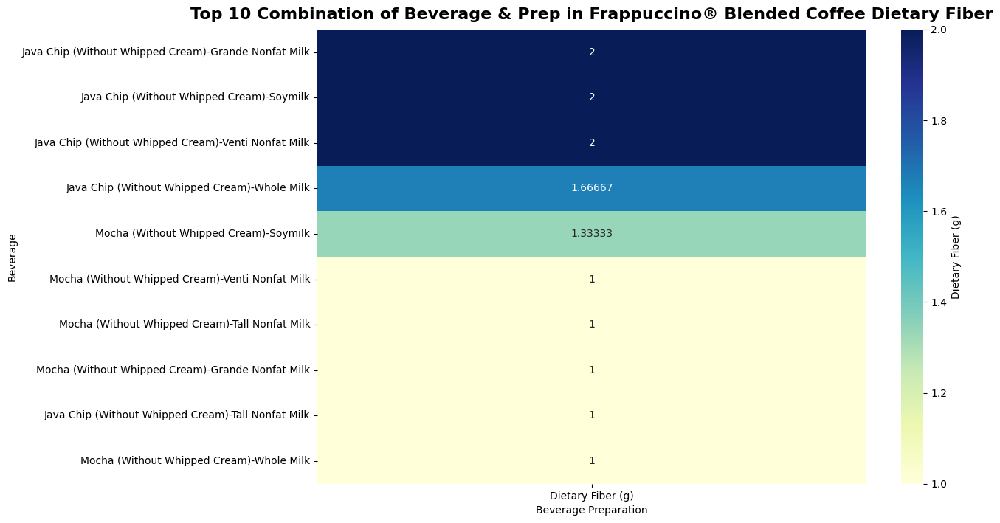

In [122]:
# Display the cross-tabulation sorted by highest dietary fiber
top_10_dietary = cross_tab_dietary_sorted.head(10)

# Create a heatmap for dietary fiber
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_dietary, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Dietary Fiber (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Dietary Fiber', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Dietary Fiber**

In [123]:
# Create a cross-tabulation without 'All' column for Dietary Fiber
cross_tab_dietary = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Dietary Fiber (g)', values=df_Frali['Dietary Fibre (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest dietary fiber
cross_tab_dietary_sorted = cross_tab_dietary.sort_values(by='Dietary Fiber (g)', ascending=False)

cross_tab_dietary_sorted.head(10)


col_0                         Dietary Fiber (g)
Beverage  Beverage_prep                        
Java Chip Grande Nonfat Milk                2.0
          Venti Nonfat Milk                 2.0
          Tall Nonfat Milk                  1.0
Mocha     Grande Nonfat Milk                1.0
          Tall Nonfat Milk                  1.0
          Venti Nonfat Milk                 1.0
Caramel   Grande Nonfat Milk                0.0
          Tall Nonfat Milk                  0.0
          Venti Nonfat Milk                 0.0
Coffee    Grande Nonfat Milk                0.0

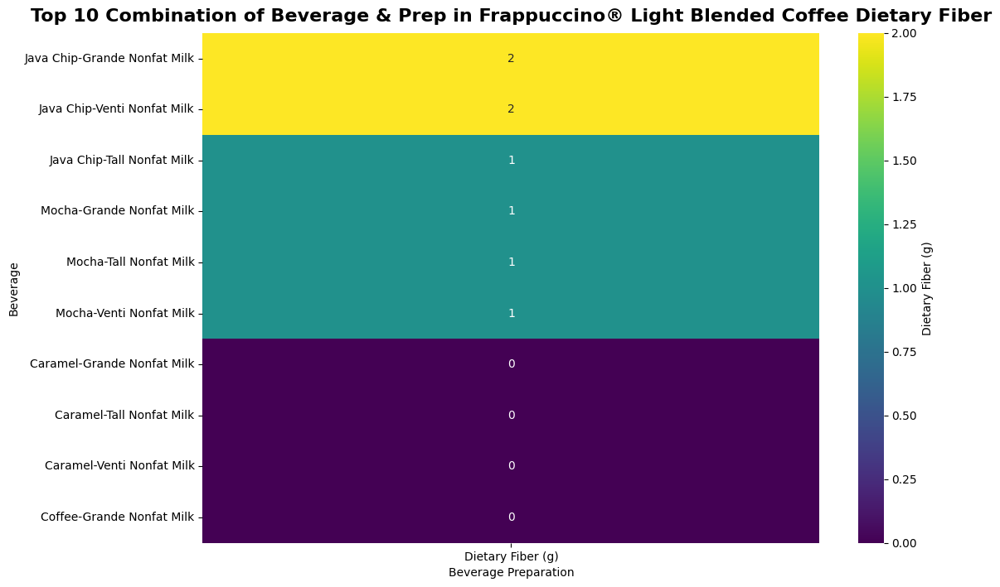

In [124]:
# Display the cross-tabulation sorted by lowest dietary fiber
top_10_dietary = cross_tab_dietary_sorted.head(10)

# Create a heatmap for dietary fiber
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_dietary, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Dietary Fiber (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Dietary Fiber', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Dietary Fiber in Frappuccino® Light Blended Coffee with Regression Lines**

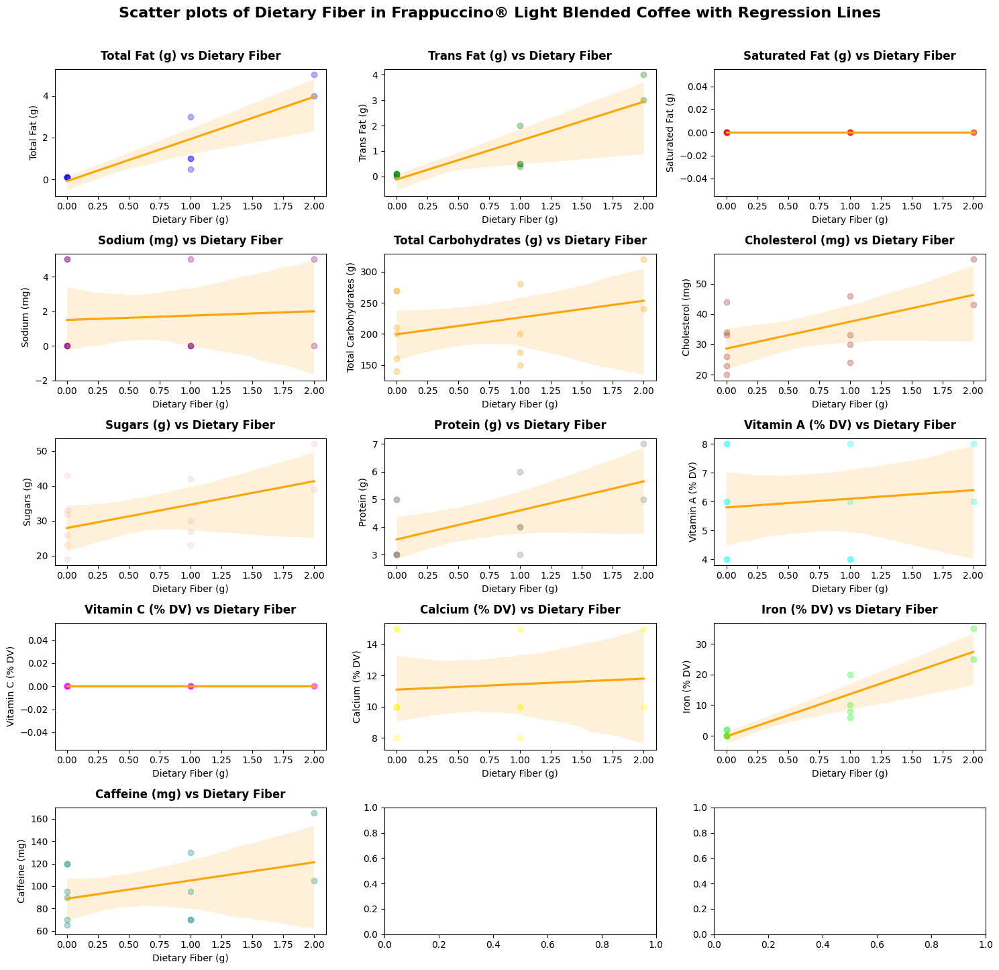

In [125]:
# Select relevant columns
numeric_columns = ['Dietary Fibre (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Sugars (g)', 'Protein (g)',
                   'Vitamin A (% DV)', 'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_dietary = df_Frali[numeric_columns]

# Reassuring to any remaining handling missing values by dropping rows with any missing values
data_dietary = data_dietary.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:15], scatter_colors)):  # Exclude 'Dietary Fibre (g)', and limit to the first 14 columns
    sns.regplot(data=data_dietary, x='Dietary Fibre (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Dietary Fiber', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Dietary Fiber (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Dietary Fiber in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Dietary Fiber in Frappuccino® Light Blended Coffee with Regression Lines**

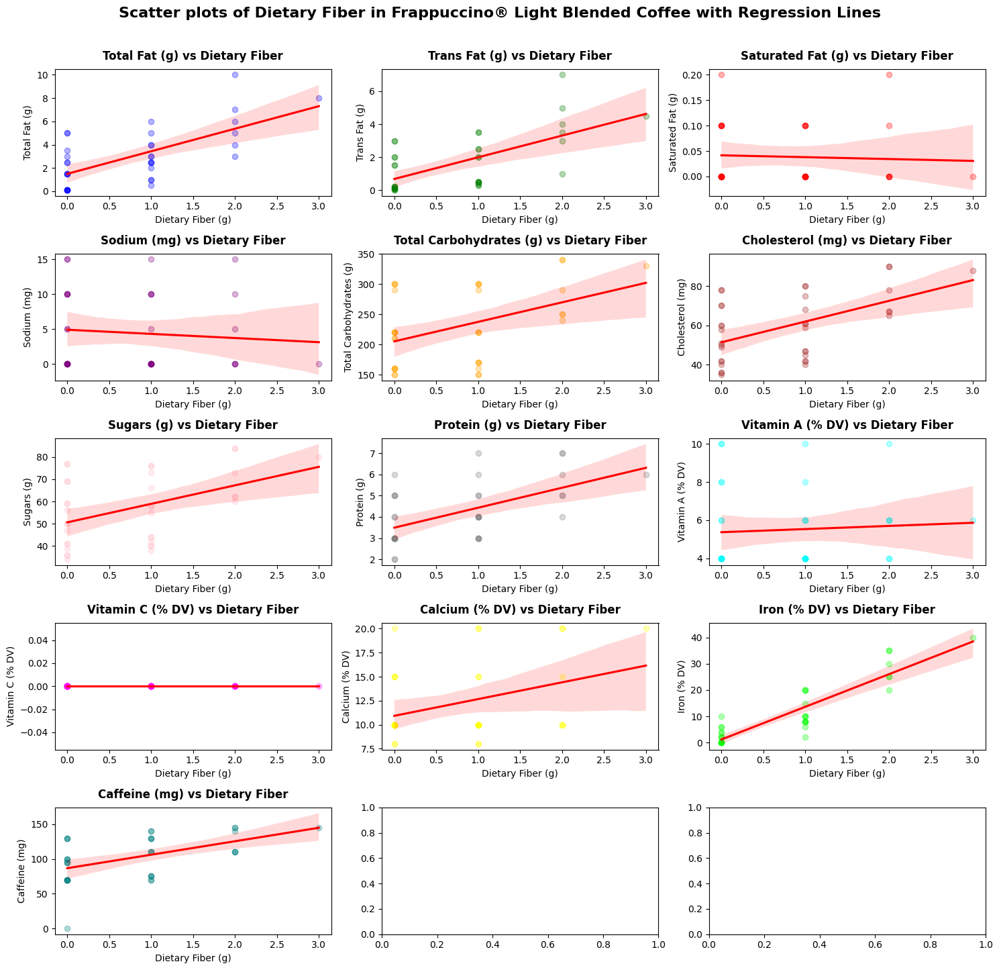

In [126]:
# Select relevant columns
numeric_columns_dietary = ['Dietary Fibre (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                            'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Sugars (g)', 'Protein (g)',
                            'Vitamin A (% DV)', 'Vitamin C (% DV)', 'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_dietary = df_Fra[numeric_columns_dietary]

# Reassuring to any remaining handling missing values by dropping rows with any missing values
data_dietary = data_dietary.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_dietary[1:15], scatter_colors)):  # Exclude 'Dietary Fibre (g)', and limit to the first 14 columns
    sns.regplot(data=data_dietary, x='Dietary Fibre (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Dietary Fiber', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Dietary Fiber (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Dietary Fiber in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **9.Sugars (g) Analysis Starbuck Product**
<img src = 'https://putnamridge.com/wp-content/uploads/2019/03/sugar-drinks.jpg'>

## **Top 9 Beverage Categories by Average Sugars Content**

In [127]:
# Calculate average sugar content for each beverage category
avg_sugar = df.groupby(['Beverage_category'])[['Sugars (g)']].mean()


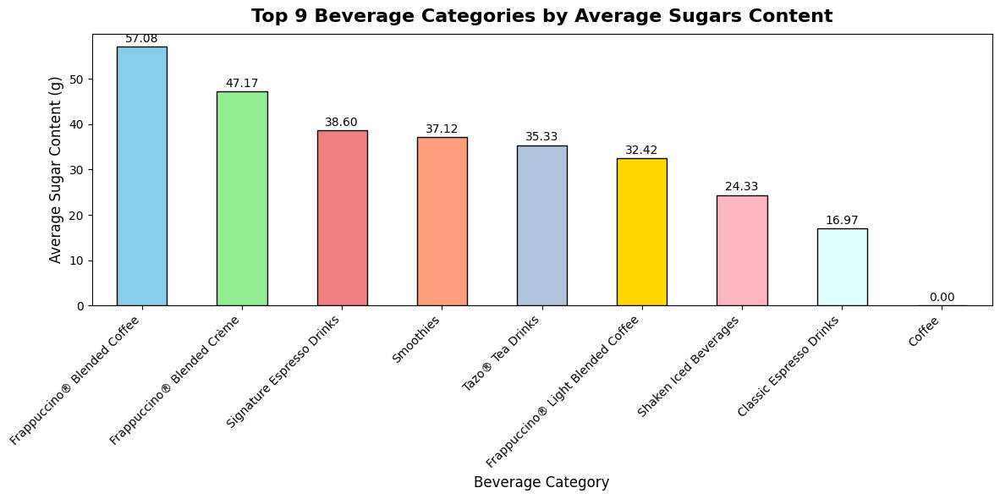

In [128]:
# Get the top 9 highest beverage categories by average sugar content
top_9_avg_sugar = avg_sugar.sort_values(by='Sugars (g)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_sugar['Sugars (g)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_sugar['Sugars (g)']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Sugars Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Sugar Content (g)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Sugar Content in Frappuccino® Blended Coffee & Frappuccino® Light Blended Coffee**

In [129]:
# Calculate average sugar content for each beverage
avg_sugar = df_Fra.groupby('Beverage')[['Sugars (g)']].mean()

avg_sugar.head()


,Sugars (g)
Beverage,
Caramel (Without Whipped Cream),58.000000
Coffee,50.777778
Java Chip (Without Whipped Cream),62.444444
Mocha (Without Whipped Cream),57.111111


In [130]:
# Calculate average sugar content for each beverage
avg_sugar1 = df_Frali.groupby('Beverage')[['Sugars (g)']].mean()

avg_sugar1.head()


,Sugars (g)
Beverage,
Caramel,32.666667
Coffee,26.000000
Java Chip,39.333333
Mocha,31.666667


In [131]:
# Sort the DataFrame by 'Sugar (g)' column in descending order to get the highest values
top_5_highest_sugar = avg_sugar.sort_values(by='Sugars (g)', ascending=False).head(5)


In [132]:
# Sort the DataFrame by 'Sugar (g)' column in ascending order to get the lowest values
top_5_lowest_sugar = avg_sugar1.sort_values(by='Sugars (g)', ascending=True).head(5)


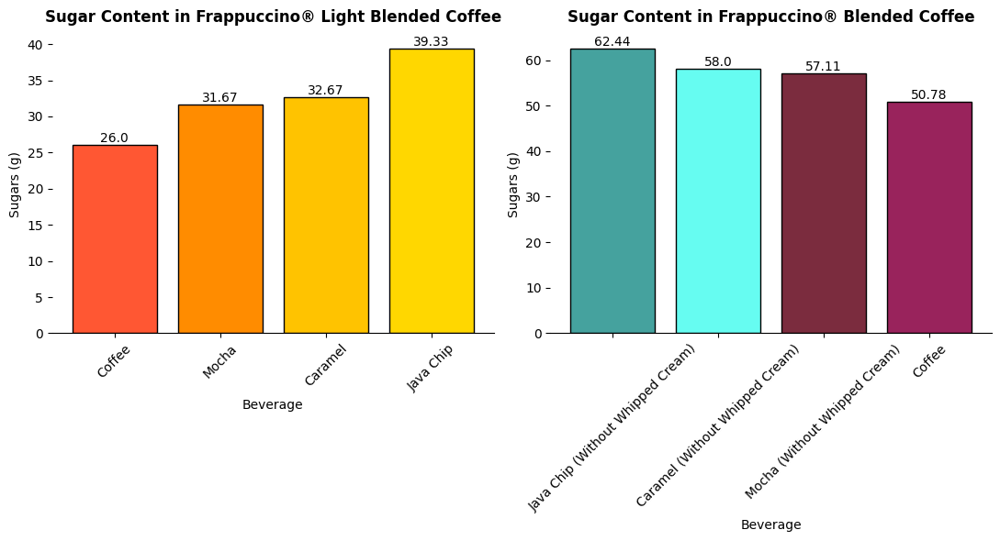

In [133]:
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest sugar content
bars1 = axes[0].bar(top_5_lowest_sugar.index, top_5_lowest_sugar['Sugars (g)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Sugar Content in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Sugars (g)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest sugar content
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest sugar content
bars2 = axes[1].bar(top_5_highest_sugar.index, top_5_highest_sugar['Sugars (g)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Sugar Content in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Sugars (g)')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest sugar content
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Sugar Content**

In [134]:
# Create a cross-tabulation without 'All' column for Sugar content
cross_tab_sugar = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Sugars (g)', values=df_Fra['Sugars (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest sugar content
cross_tab_sorted_sugar = cross_tab_sugar.sort_values(by='Sugars (g)', ascending=True)

cross_tab_sorted_sugar.head(5)


,col_0,Sugars (g)
Beverage,Beverage_prep,
Coffee,Tall Nonfat Milk,36.0
Mocha (Without Whipped Cream),Tall Nonfat Milk,40.0
Caramel (Without Whipped Cream),Tall Nonfat Milk,41.0
Java Chip (Without Whipped Cream),Tall Nonfat Milk,44.0
Coffee,Soymilk,49.0


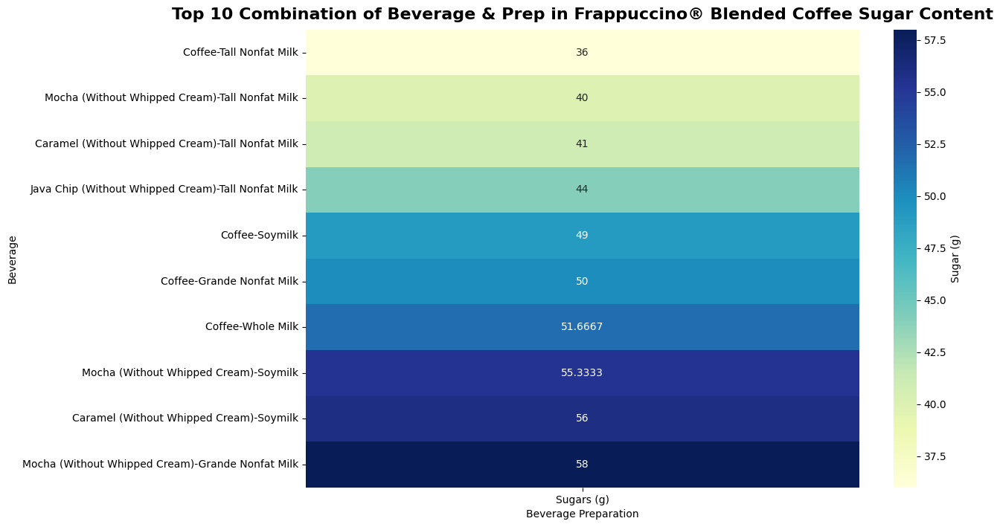

In [135]:
# Display the cross-tabulation sorted by highest sugar content
top_10_sugar = cross_tab_sorted_sugar.head(10)

# Create a heatmap for sugar content
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_sugar, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Sugar (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Sugar Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Sugar Content**

In [136]:
# Create a cross-tabulation without 'All' column for Sugar content
cross_tab_sugar = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Sugars (g)', values=df_Frali['Sugars (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest sugar content
cross_tab_sorted_sugar = cross_tab_sugar.sort_values(by='Sugars (g)', ascending=False)

cross_tab_sorted_sugar.head(10)


,col_0,Sugars (g)
Beverage,Beverage_prep,
Java Chip,Venti Nonfat Milk,52.0
Caramel,Venti Nonfat Milk,43.0
Mocha,Venti Nonfat Milk,42.0
Java Chip,Grande Nonfat Milk,39.0
Coffee,Venti Nonfat Milk,33.0
Caramel,Grande Nonfat Milk,32.0
Mocha,Grande Nonfat Milk,30.0
Java Chip,Tall Nonfat Milk,27.0
Coffee,Grande Nonfat Milk,26.0


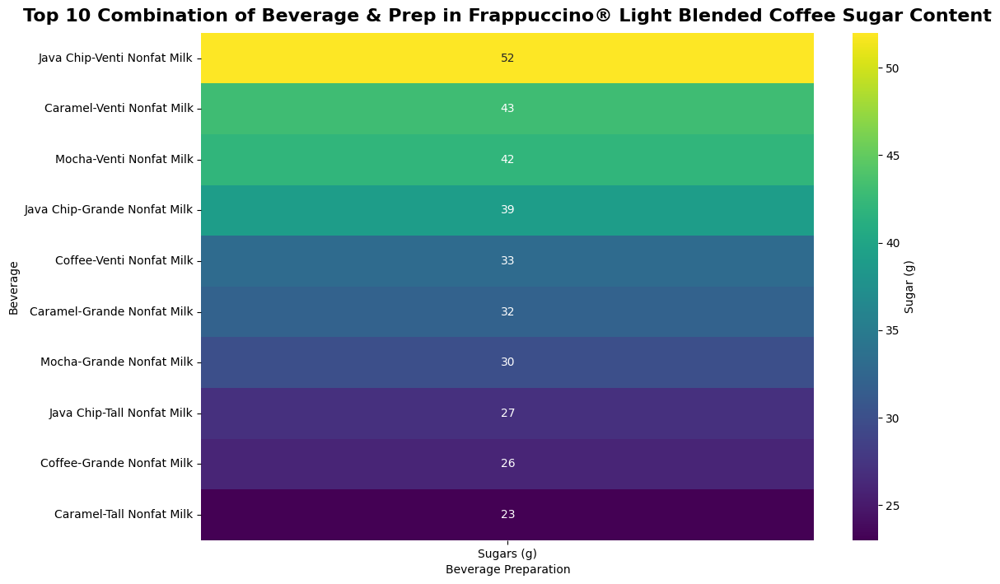

In [137]:
# Display the cross-tabulation sorted by lowest sugar content
top_10_sugar = cross_tab_sorted_sugar.head(10)

# Create a heatmap for sugar content
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_sugar, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Sugar (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Sugar Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Sugar Content in Frappuccino® Blended Coffee with Regression Lines**

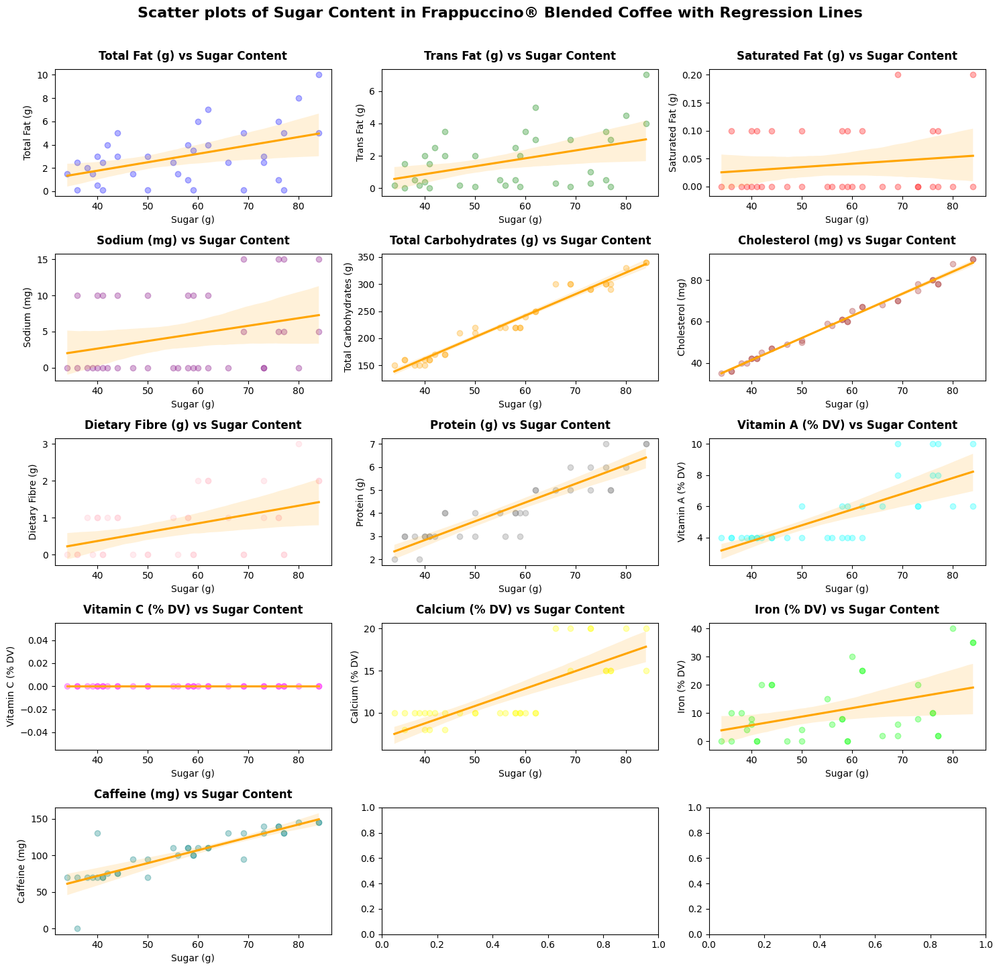

In [138]:
# Select relevant columns for sugar content
numeric_columns_sugar = ['Sugars (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                          'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                          'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                          'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame for sugar content
data_sugar = df_Fra[numeric_columns_sugar]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_sugar = data_sugar.dropna()

# Create scatter plots with regression lines for sugar content
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_sugar = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                         'yellow', 'lime', 'teal', 'navy']

for i, (col, color) in enumerate(zip(numeric_columns_sugar[1:], scatter_colors_sugar)):  # Exclude 'Sugar (g)', and limit to the first 14 columns
    sns.regplot(data=data_sugar, x='Sugars (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Sugar Content', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Sugar (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Sugar Content in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Sugar Content in Frappuccino® Light Blended Coffee with Regression Lines**

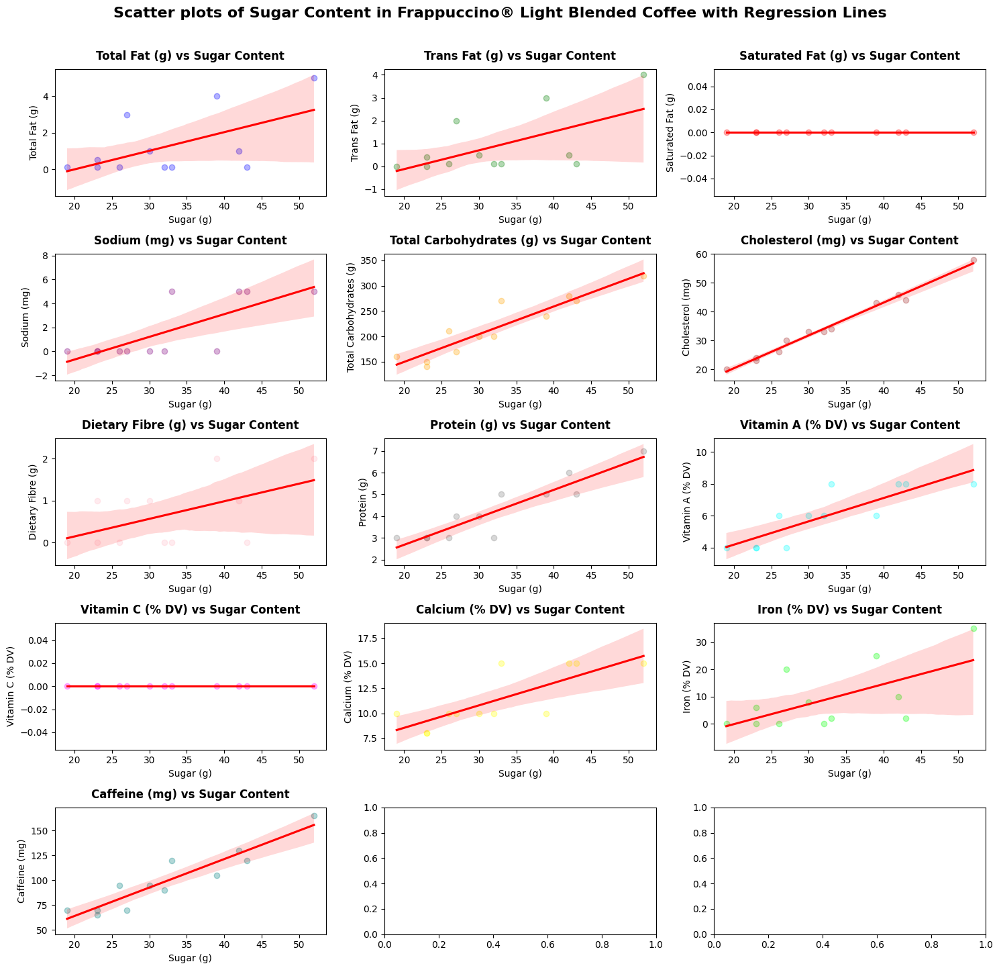

In [139]:
# Select relevant columns for sugar content
numeric_columns_sugar = ['Sugars (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                          'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                          'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                          'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame for sugar content
data_sugar = df_Frali[numeric_columns_sugar]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_sugar = data_sugar.dropna()

# Create scatter plots with regression lines for sugar content
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_sugar = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                         'yellow', 'lime', 'teal', 'navy']

for i, (col, color) in enumerate(zip(numeric_columns_sugar[1:], scatter_colors_sugar)):  # Exclude 'Sugar (g)', and limit to the first 14 columns
    sns.regplot(data=data_sugar, x='Sugars (g)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Sugar Content', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Sugar (g)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Sugar Content in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **10. Protein (g) Analysis Starbuck Product**
<img src = 'https://www.felixhospital.com/sites/default/files/2023-05/top-5-high-protein-foods.jpg'>

## **Top 9 Beverage Categories by Average Protein (g)**

In [141]:
avg_protein = df.groupby(['Beverage_category'])[['Protein (g)']].mean()


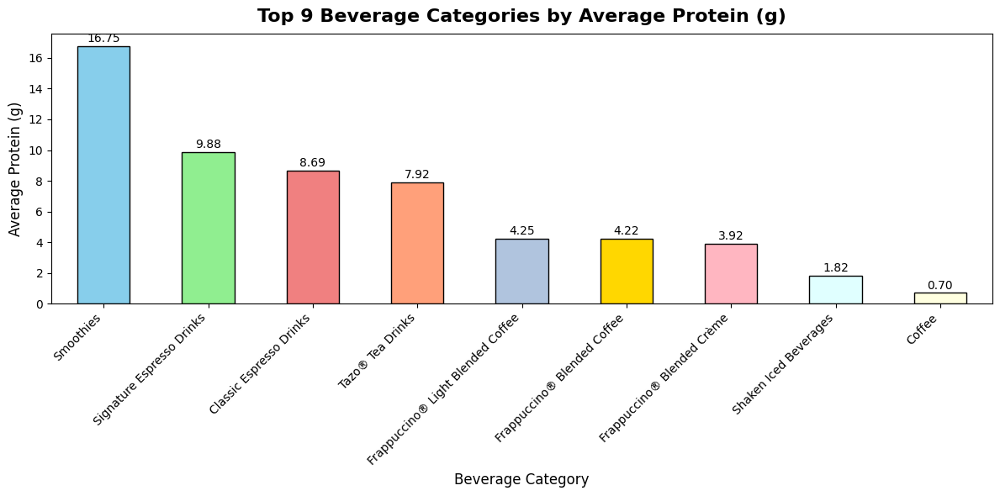

In [142]:
# Get the top 9 highest beverage categories by average protein (g)
top_9_avg_protein = avg_protein.sort_values(by='Protein (g)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_protein['Protein (g)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_protein['Protein (g)']):
    plt.text(i, value + 0.1, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Protein (g)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Protein (g)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Protein in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [143]:
avg_protein = df_Fra.groupby('Beverage')[['Protein (g)']].mean()


In [144]:
avg_protein1 = df_Frali.groupby('Beverage')[['Protein (g)']].mean()


In [145]:
top_5_highest_protein = avg_protein.sort_values(by='Protein (g)', ascending=False).head(5)


In [146]:
top_5_lowest_protein = avg_protein1.sort_values(by='Protein (g)', ascending=True).head(5)

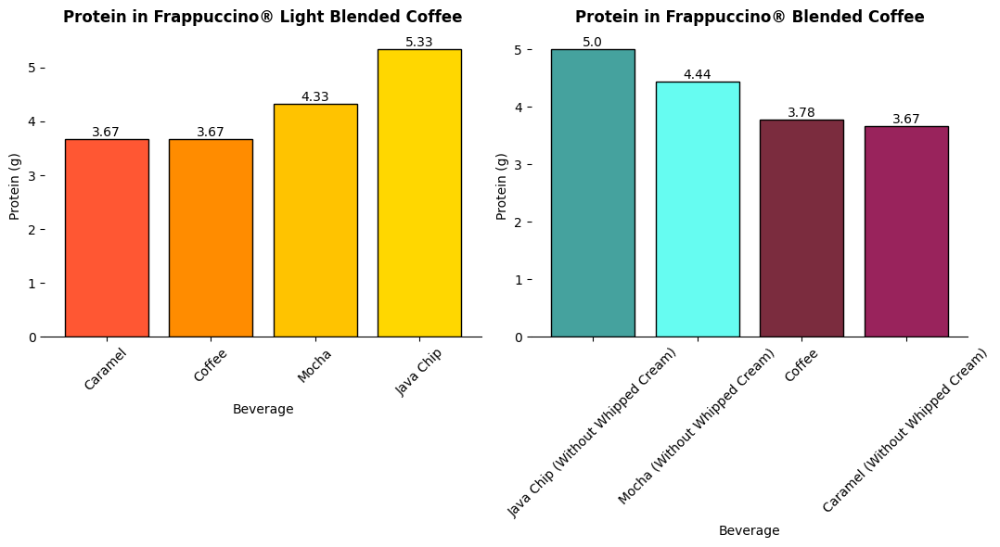

In [147]:
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest protein
bars1 = axes[0].bar(top_5_lowest_protein.index, top_5_lowest_protein['Protein (g)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Protein in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Protein (g)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest protein
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest protein
bars2 = axes[1].bar(top_5_highest_protein.index, top_5_highest_protein['Protein (g)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Protein in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Protein (g)')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest protein
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Protein**

In [148]:
# Create a cross-tabulation without 'All' column for Protein
cross_tab_protein = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Protein (g)', values=df_Fra['Protein (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest protein values
cross_tab_sorted_protein = cross_tab_protein.sort_values(by='Protein (g)', ascending=True)

cross_tab_sorted_protein.head(5)


,col_0,Protein (g)
Beverage,Beverage_prep,
Caramel (Without Whipped Cream),Tall Nonfat Milk,3.000000
Mocha (Without Whipped Cream),Tall Nonfat Milk,3.000000
Coffee,Tall Nonfat Milk,3.000000
Caramel (Without Whipped Cream),Soymilk,3.333333
Coffee,Soymilk,3.333333


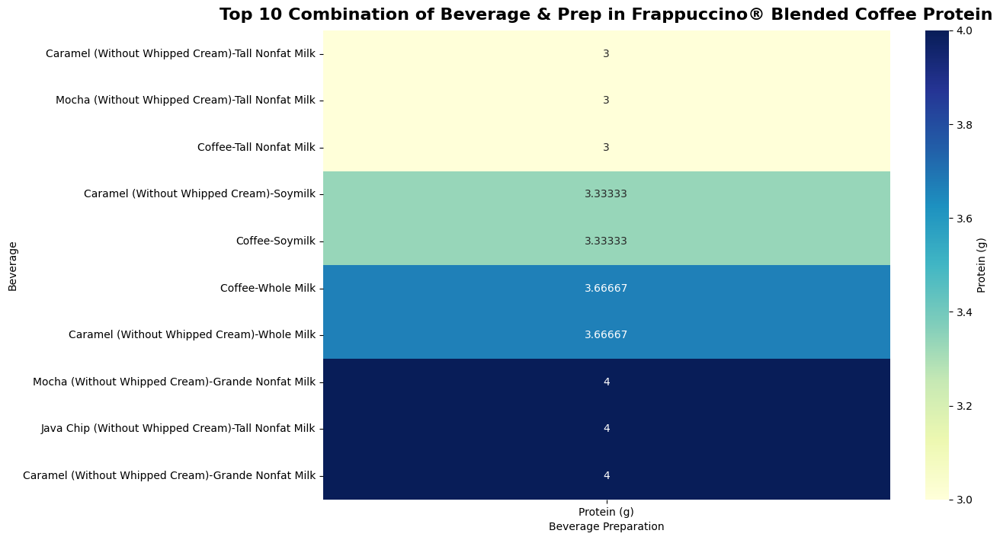

In [149]:
# Display the cross-tabulation sorted by highest protein values
top_10_protein = cross_tab_sorted_protein.head(10)

# Create a heatmap for Protein
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_protein, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Protein (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Protein', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Protein**

In [150]:
# Create a cross-tabulation without 'All' column for Protein
cross_tab_protein = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Protein (g)', values=df_Frali['Protein (g)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest protein values
cross_tab_sorted_protein = cross_tab_protein.sort_values(by='Protein (g)', ascending=True)

cross_tab_sorted_protein.head(10)


col_0                         Protein (g)
Beverage  Beverage_prep                  
Caramel   Grande Nonfat Milk          3.0
          Tall Nonfat Milk            3.0
Coffee    Grande Nonfat Milk          3.0
          Tall Nonfat Milk            3.0
Mocha     Tall Nonfat Milk            3.0
Java Chip Tall Nonfat Milk            4.0
Mocha     Grande Nonfat Milk          4.0
Caramel   Venti Nonfat Milk           5.0
Coffee    Venti Nonfat Milk           5.0
Java Chip Grande Nonfat Milk          5.0

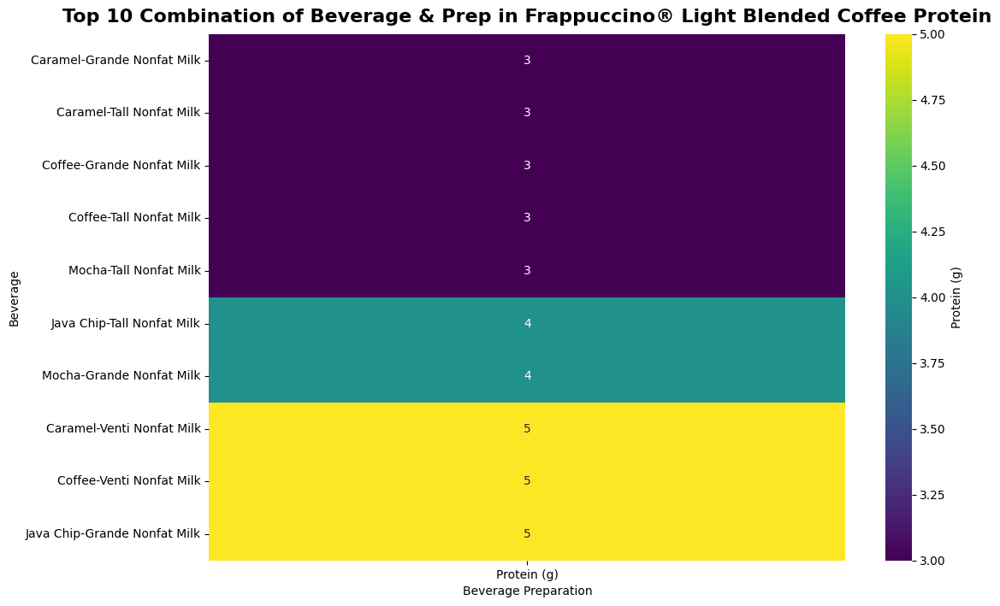

In [151]:
# Display the cross-tabulation sorted by lowest protein values
top_10_protein = cross_tab_sorted_protein.head(10)

# Create a heatmap for Protein
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_protein, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Protein (g)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Protein', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Protein in Frappuccino® Blended Coffee with Regression Lines**

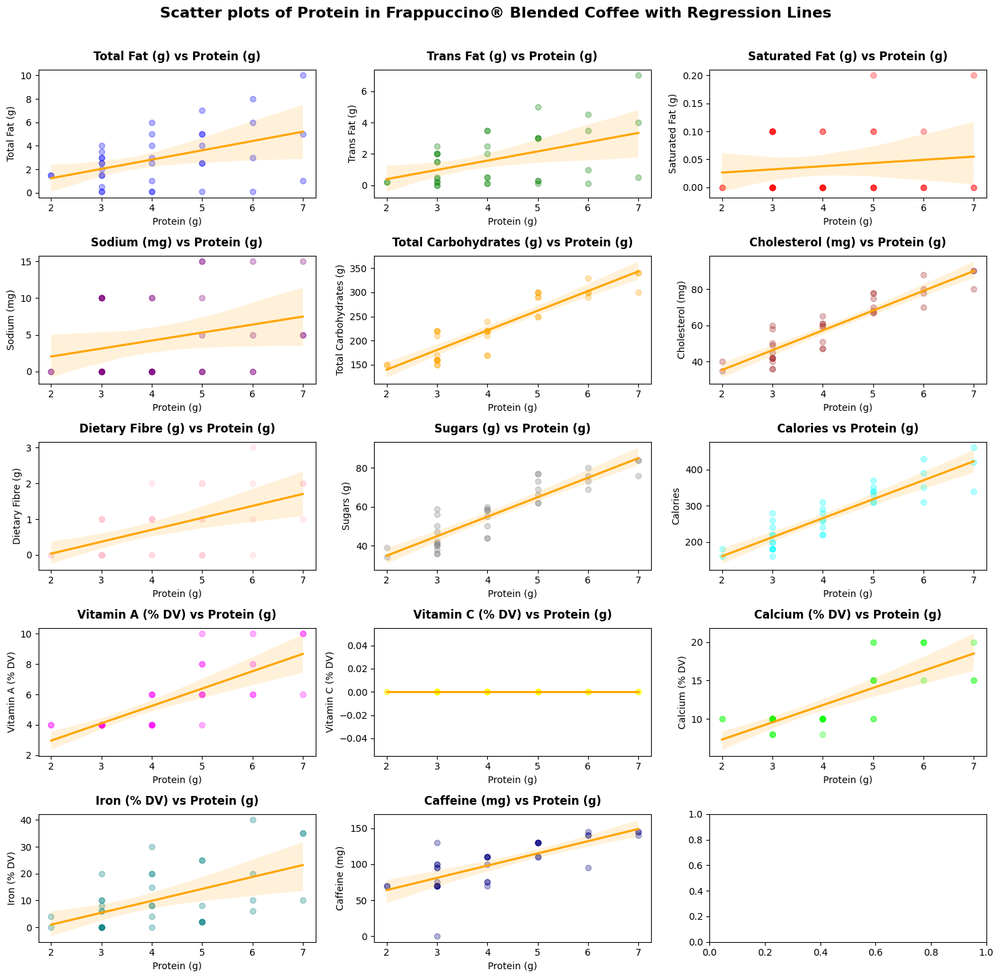

In [152]:
# Select relevant columns for Protein
numeric_columns_protein = ['Protein (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                           'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                           'Sugars (g)', 'Calories', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                           'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame for Protein
data_protein = df_Fra[numeric_columns_protein]

# Re-assuring to any remaining Handling missing values by dropping rows with any missing values
data_protein = data_protein.dropna()

# Create scatter plots with regression lines for Protein
fig_protein, axes_protein = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_protein = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                          'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_protein[1:], scatter_colors_protein)):  # Exclude 'Protein (g)', and limit to the first 14 columns
    sns.regplot(data=data_protein, x='Protein (g)', y=col, ax=axes_protein[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes_protein[i//3, i%3].set_title(f'{col} vs Protein (g)', pad=10, fontweight='bold', fontsize=12)
    axes_protein[i//3, i%3].set_xlabel('Protein (g)')
    axes_protein[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Protein in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Protein in Frappuccino® Light Blended Coffee with Regression Lines**

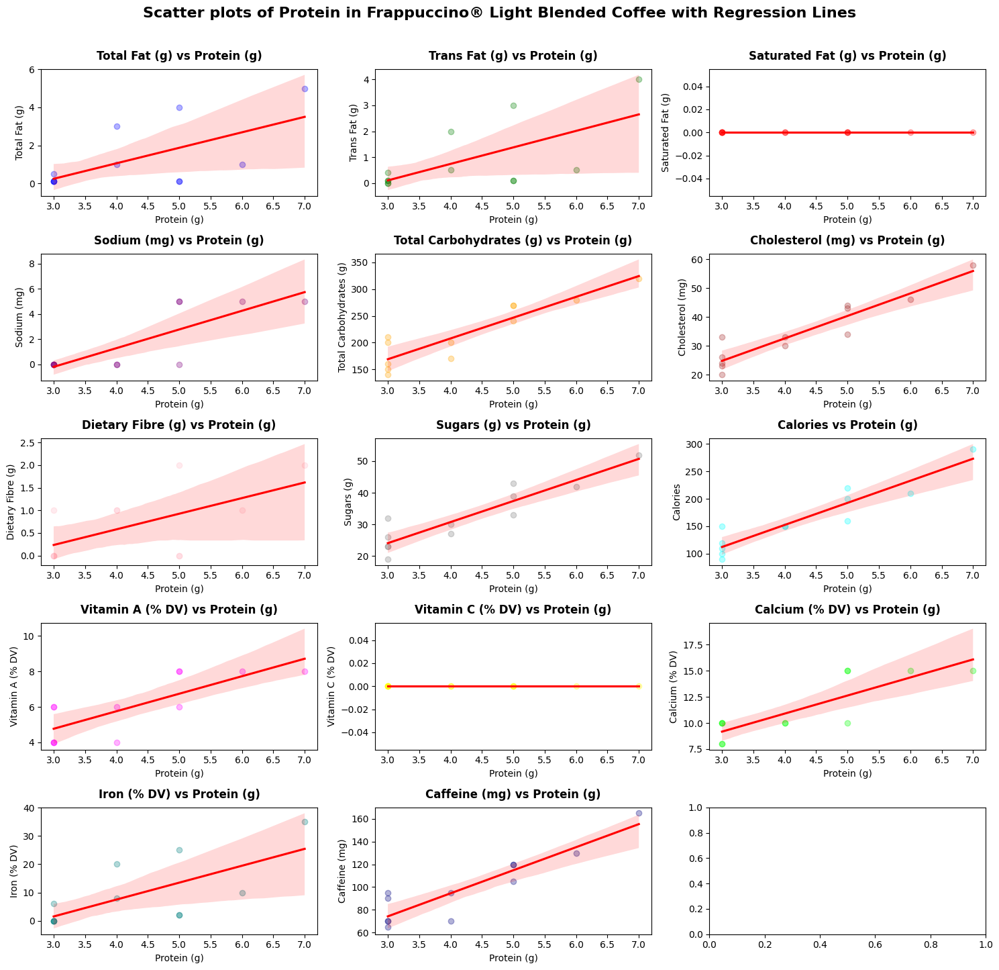

In [153]:
# Select relevant columns for Protein
numeric_columns_protein = ['Protein (g)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                           'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                           'Sugars (g)', 'Calories', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                           'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame for Protein
data_protein = df_Frali[numeric_columns_protein]

# Re-assuring to any remaining Handling missing values by dropping rows with any missing values
data_protein = data_protein.dropna()

# Create scatter plots with regression lines for Protein
fig_protein, axes_protein = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_protein = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                          'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_protein[1:], scatter_colors_protein)):  # Exclude 'Protein (g)', and limit to the first 14 columns
    sns.regplot(data=data_protein, x='Protein (g)', y=col, ax=axes_protein[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes_protein[i//3, i%3].set_title(f'{col} vs Protein (g)', pad=10, fontweight='bold', fontsize=12)
    axes_protein[i//3, i%3].set_xlabel('Protein (g)')
    axes_protein[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Protein in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **11. Vitamin A (% DV) Analysis Starbuck Product**
<img src = 'https://www.rebuildyourvision.com/wp-content/uploads/2015/09/Everything-You-Need-to-Know-about-Vitamin-A.jpg'>

## **Top 9 Beverage Categories by Average Vitamin A (% DV)**

In [232]:
avg_vitamin_a = df.groupby(['Beverage_category'])[['Vitamin A (% DV)']].mean()
avg_vitamin_a


,Vitamin A (% DV)
Beverage_category,
Classic Espresso Drinks,12.724138
Coffee,0.000000
Frappuccino® Blended Coffee,5.500000
Frappuccino® Blended Crème,6.166667
Frappuccino® Light Blended Coffee,6.000000
Shaken Iced Beverages,2.500000
Signature Espresso Drinks,13.150000
Smoothies,21.750000
Tazo® Tea Drinks,12.111111


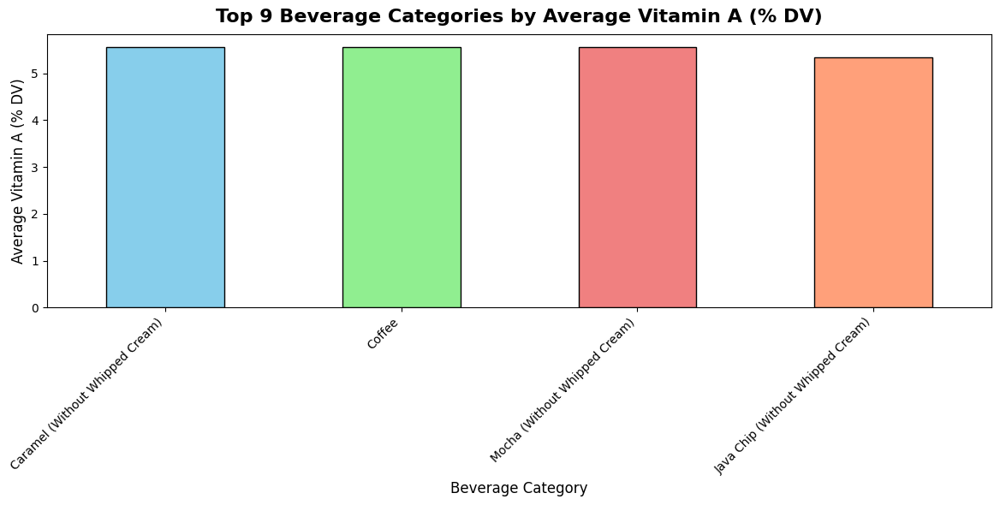

In [231]:
# Get the top 9 highest beverage categories by average Vitamin A (% DV)
top_9_avg_vitamin_a = avg_vitamin_a.sort_values(by='Vitamin A (% DV)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_vitamin_a['Vitamin A (% DV)'].plot(kind='bar', color=colors, edgecolor='black')


# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Vitamin A (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Vitamin A (% DV)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Vitamin A (% DV) in Frappuccino® Blended Coffee * Frappuccino® Light Blended Coffee**

In [156]:
avg_vitamin_a = df_Fra.groupby('Beverage')[['Vitamin A (% DV)']].mean()

avg_vitamin_a.head()


,Vitamin A (% DV)
Beverage,
Caramel (Without Whipped Cream),5.555556
Coffee,5.555556
Java Chip (Without Whipped Cream),5.333333
Mocha (Without Whipped Cream),5.555556


In [157]:
avg_vitamin_a1 = df_Frali.groupby('Beverage')[['Vitamin A (% DV)']].mean()

avg_vitamin_a1.head()


,Vitamin A (% DV)
Beverage,
Caramel,6.0
Coffee,6.0
Java Chip,6.0
Mocha,6.0


In [158]:
top_5_highest_vitamin_a = avg_vitamin_a.sort_values(by='Vitamin A (% DV)', ascending=False).head(5)


In [159]:
top_5_lowest_vitamin_a = avg_vitamin_a1.sort_values(by='Vitamin A (% DV)', ascending=True).head(5)


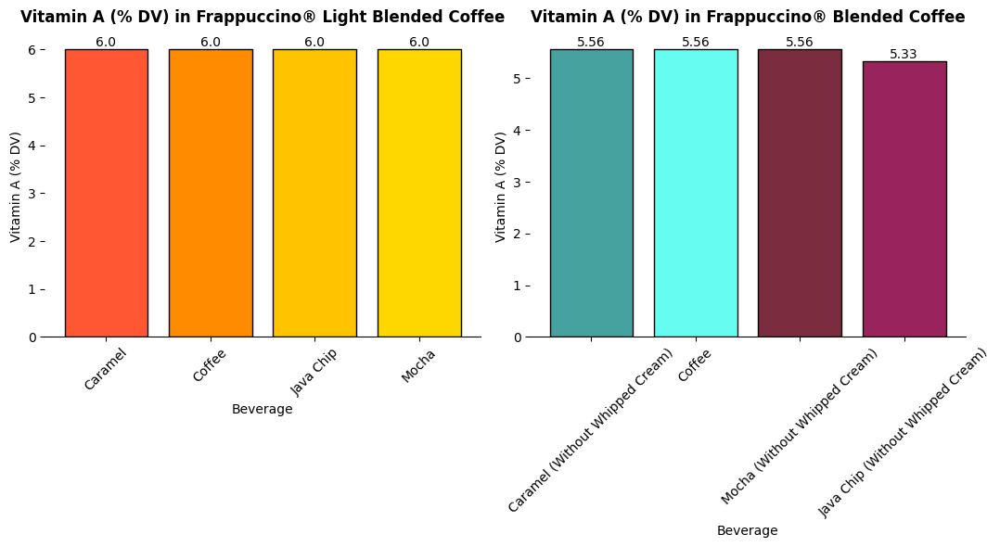

In [160]:
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest Vitamin A (% DV)
bars1 = axes[0].bar(top_5_lowest_vitamin_a.index, top_5_lowest_vitamin_a['Vitamin A (% DV)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Vitamin A (% DV) in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Vitamin A (% DV)')
axes[0].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest Vitamin A (% DV)
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest Vitamin A (% DV)
bars2 = axes[1].bar(top_5_highest_vitamin_a.index, top_5_highest_vitamin_a['Vitamin A (% DV)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Vitamin A (% DV) in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Vitamin A (% DV)')
axes[1].tick_params(axis='x', rotation=45)  # Removed the ha parameter
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest Vitamin A (% DV)
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Vitamin A (% DV)**

In [161]:
# Create a cross-tabulation without 'All' column for Vitamin A (% DV)
cross_tab_vitamin_a = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Vitamin A (% DV)', values=df_Fra['Vitamin A (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest Vitamin A (% DV)
cross_tab_sorted_vitamin_a = cross_tab_vitamin_a.sort_values(by='Vitamin A (% DV)', ascending=True)

cross_tab_sorted_vitamin_a.head(5)


,col_0,Vitamin A (% DV)
Beverage,Beverage_prep,
Caramel (Without Whipped Cream),Tall Nonfat Milk,4.000000
Mocha (Without Whipped Cream),Tall Nonfat Milk,4.000000
Coffee,Tall Nonfat Milk,4.000000
Java Chip (Without Whipped Cream),Tall Nonfat Milk,4.000000
Caramel (Without Whipped Cream),Soymilk,4.666667


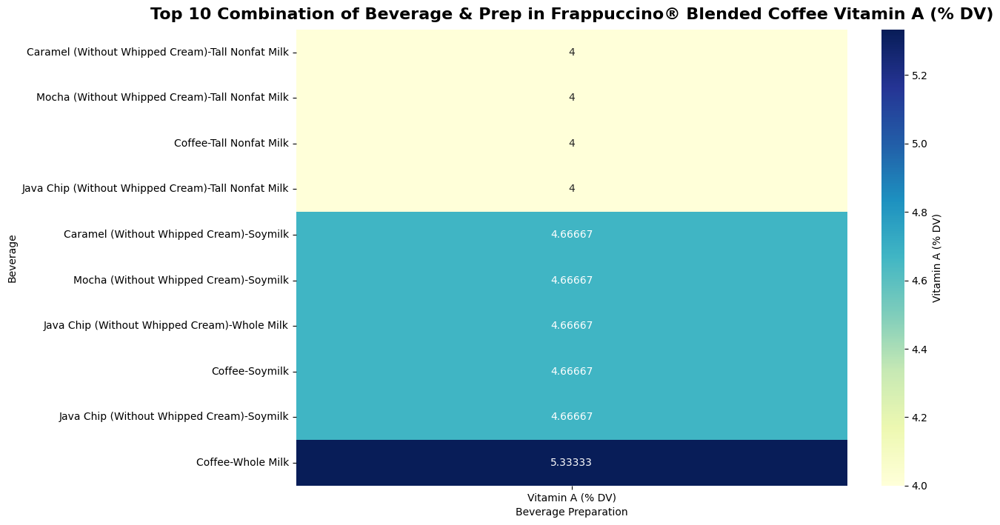

In [162]:
# Display the cross-tabulation sorted by highest Vitamin A (% DV)
top_10_vitamin_a = cross_tab_sorted_vitamin_a.head(10)

# Create a heatmap for Vitamin A (% DV)
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_vitamin_a, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Vitamin A (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Vitamin A (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Vitamin A (% DV)**

In [163]:
# Create a cross-tabulation without 'All' column for Vitamin A (% DV)
cross_tab_vitamin_a = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Vitamin A (% DV)', values=df_Frali['Vitamin A (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by lowest Vitamin A (% DV)
cross_tab_sorted_vitamin_a = cross_tab_vitamin_a.sort_values(by='Vitamin A (% DV)', ascending=True)

cross_tab_sorted_vitamin_a.head(10)


,col_0,Vitamin A (% DV)
Beverage,Beverage_prep,
Caramel,Tall Nonfat Milk,4.0
Coffee,Tall Nonfat Milk,4.0
Java Chip,Tall Nonfat Milk,4.0
Mocha,Tall Nonfat Milk,4.0
Caramel,Grande Nonfat Milk,6.0
Coffee,Grande Nonfat Milk,6.0
Java Chip,Grande Nonfat Milk,6.0
Mocha,Grande Nonfat Milk,6.0
Caramel,Venti Nonfat Milk,8.0


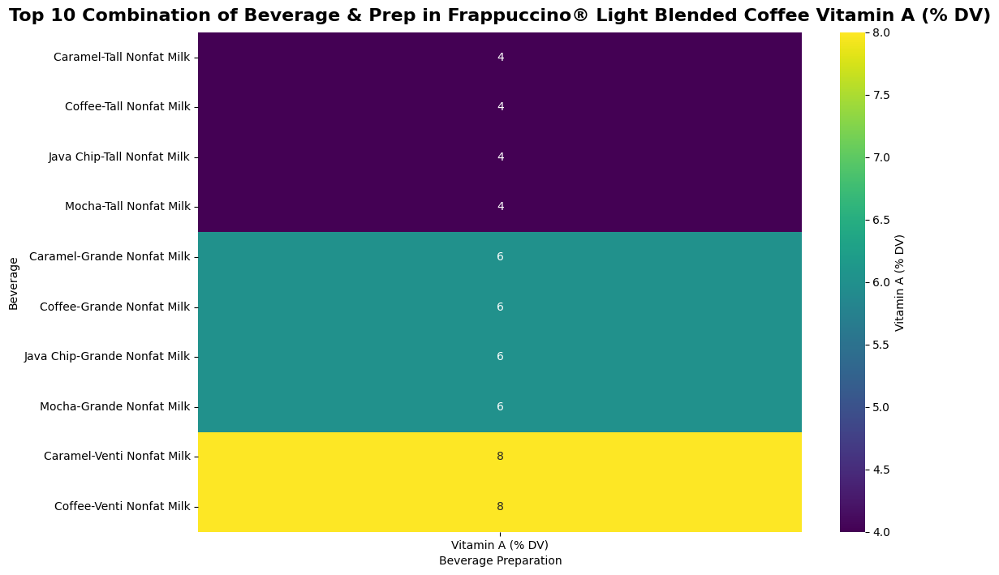

In [164]:
# Display the cross-tabulation sorted by lowest Vitamin A (% DV)
top_10_vitamin_a = cross_tab_sorted_vitamin_a.head(10)

# Create a heatmap for Vitamin A (% DV)
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_vitamin_a, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Vitamin A (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Vitamin A (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Calories in Frappuccino® Blended Coffee with Regression Lines**

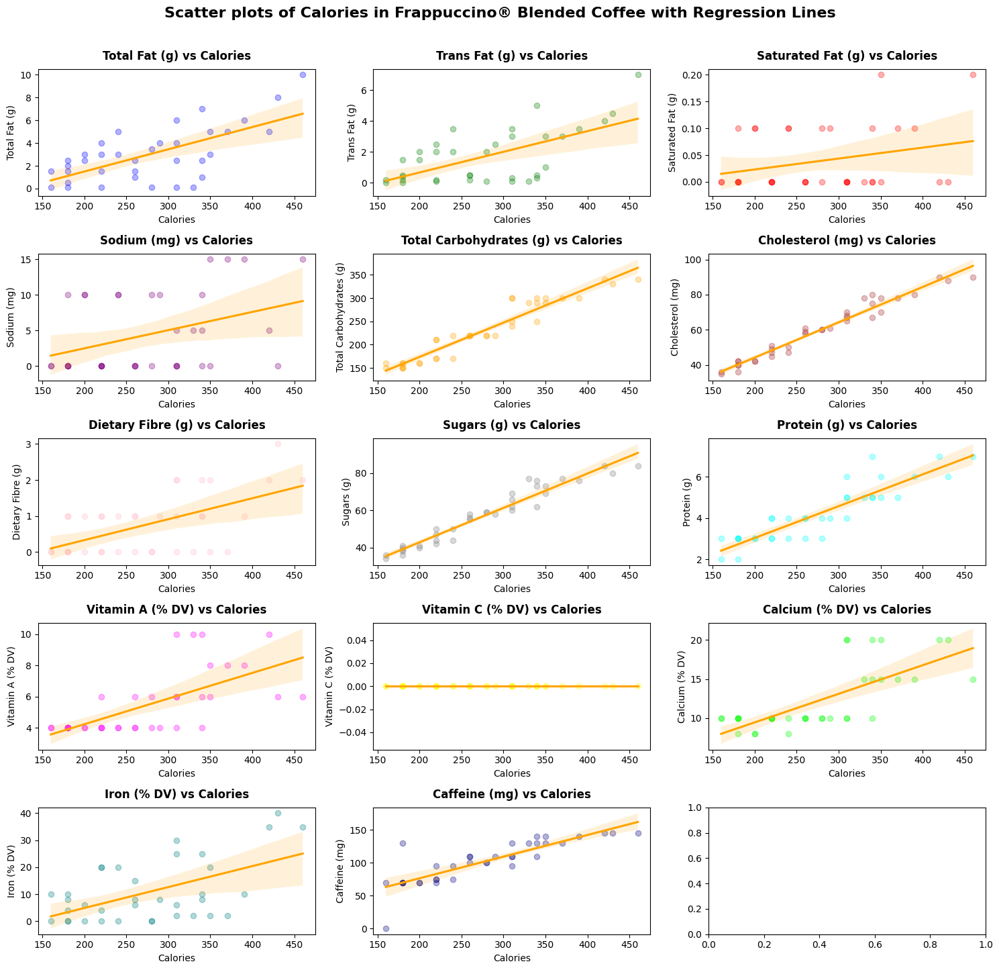

In [165]:
# Select relevant columns including 'Vitamin A (% DV)'
numeric_columns = ['Calories', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_vitamin_a = df_Fra[numeric_columns]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_vitamin_a = data_vitamin_a.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:16], scatter_colors)):  # Exclude 'Calories', and limit to the first 15 columns
    sns.regplot(data=data_vitamin_a, x='Calories', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Calories', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calories')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calories in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Calories in Frappuccino® Light Blended Coffee with Regression Lines**

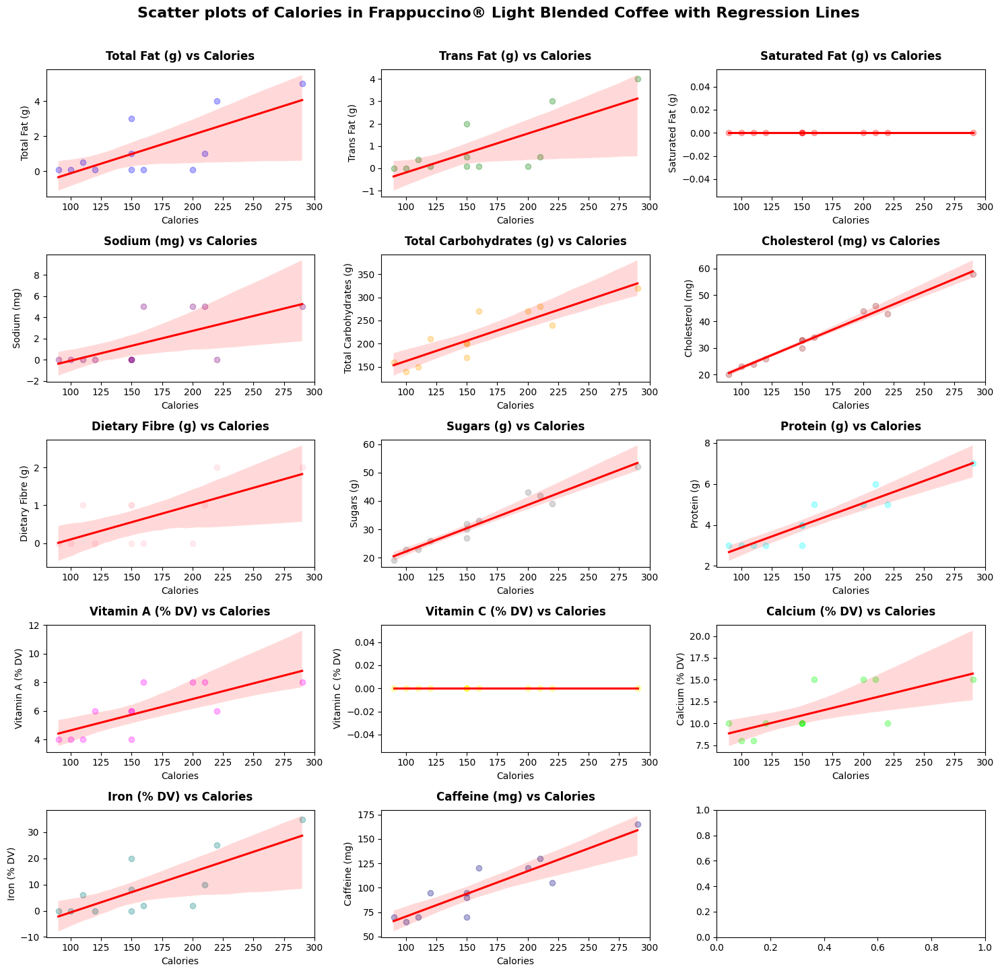

In [166]:
# Select relevant columns including 'Vitamin A (% DV)'
numeric_columns = ['Calories', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                   'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                   'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                   'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_vitamin_a = df_Frali[numeric_columns]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_vitamin_a = data_vitamin_a.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns[1:16], scatter_colors)):  # Exclude 'Calories', and limit to the first 15 columns
    sns.regplot(data=data_vitamin_a, x='Calories', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Calories', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calories')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calories in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **12. Vitamin C (% DV) Analysis Starbuck Product**
<img src = 'https://www.clearvuehealth.com/images/top-sources-vitaminc_vitaminc-sources.jpg'>

## **Top 9 Beverage Categories by Average Vitamin C (% DV)**

In [167]:
avg_vitamin_c = df.groupby(['Beverage_category'])[['Vitamin C (% DV)']].mean()


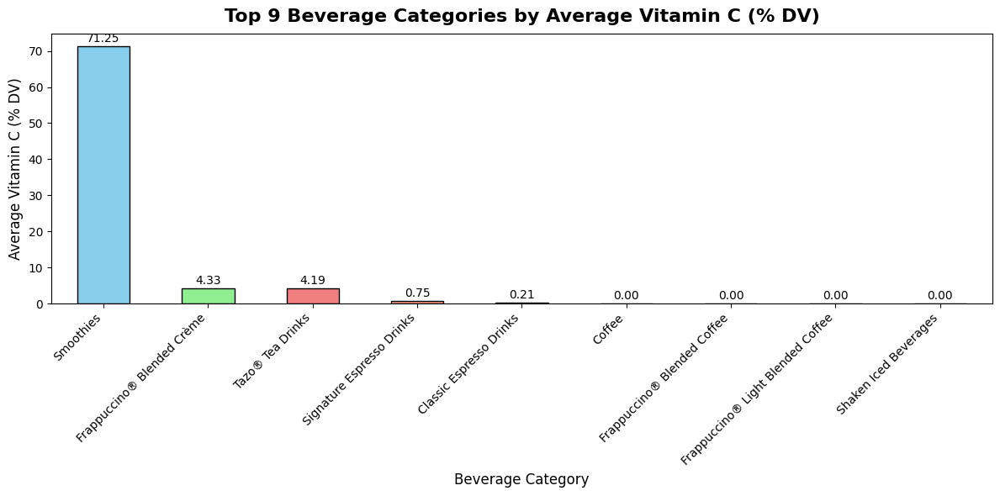

In [168]:
# Get the top 9 highest beverage categories by average Vitamin C (% DV)
top_9_avg_vitamin_c = avg_vitamin_c.sort_values(by='Vitamin C (% DV)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_vitamin_c['Vitamin C (% DV)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_vitamin_c['Vitamin C (% DV)']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Vitamin C (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Vitamin C (% DV)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Vitamin C (% DV) in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [169]:
# Calculate average Vitamin C (% DV) for each beverage category
avg_vitamin_c = df_Fra.groupby('Beverage')[['Vitamin C (% DV)']].mean()

avg_vitamin_c.head()


,Vitamin C (% DV)
Beverage,
Caramel (Without Whipped Cream),0.0
Coffee,0.0
Java Chip (Without Whipped Cream),0.0
Mocha (Without Whipped Cream),0.0


In [170]:
# Calculate average Vitamin C (% DV) for each beverage category
avg_vitamin_c1 = df_Frali.groupby('Beverage')[['Vitamin C (% DV)']].mean()

avg_vitamin_c1.head()


,Vitamin C (% DV)
Beverage,
Caramel,0.0
Coffee,0.0
Java Chip,0.0
Mocha,0.0


In [171]:
# Sort the DataFrame by 'Vitamin C (% DV)' column in descending order to get the highest values
top_5_highest_vitamin_c = avg_vitamin_c.sort_values(by='Vitamin C (% DV)', ascending=False).head(5)


In [172]:
# Sort the DataFrame by 'Vitamin C (% DV)' column in ascending order to get the lowest values
top_5_lowest_vitamin_c = avg_vitamin_c1.sort_values(by='Vitamin C (% DV)', ascending=True).head(5)


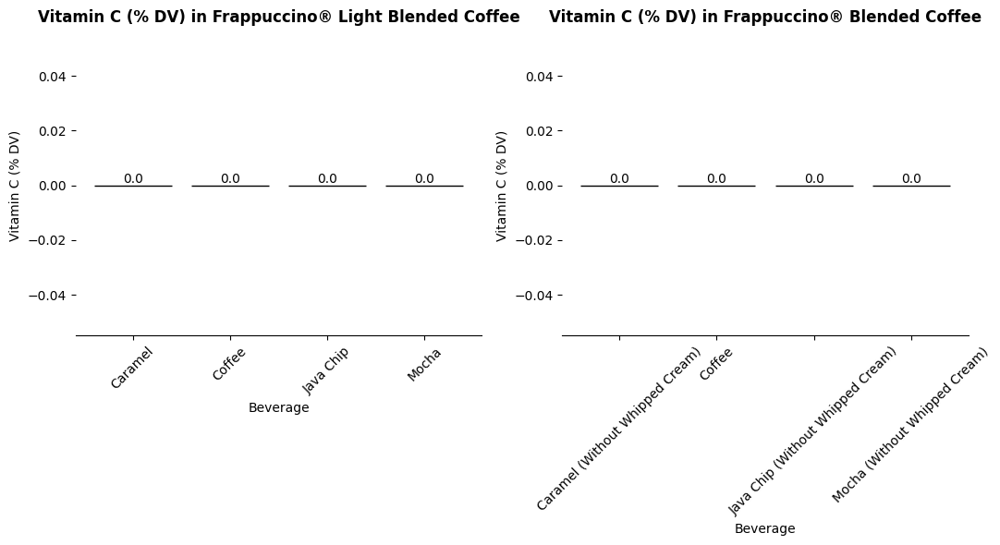

In [173]:
custom_colors = ["#FF5733", "#FF8C00", "#FFC300", "#FFD700", "#D1E231", "#9EEC77"]
custom_colors1 = ["#45A29E", "#66FCF1", "#7B2C3E", "#99235C", "#BAA6A6", "#FFB997"]
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest Vitamin C (% DV)
bars1 = axes[0].bar(top_5_lowest_vitamin_c.index, top_5_lowest_vitamin_c['Vitamin C (% DV)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Vitamin C (% DV) in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Vitamin C (% DV)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest Vitamin C (% DV)
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest Vitamin C (% DV)
bars2 = axes[1].bar(top_5_highest_vitamin_c.index, top_5_highest_vitamin_c['Vitamin C (% DV)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Vitamin C (% DV) in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Vitamin C (% DV)')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest Vitamin C (% DV)
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Vitamin C (% DV)**

In [174]:
# Create a cross-tabulation without 'All' column for 'Vitamin C (% DV)'
cross_tab_vitamin_c = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Vitamin C (% DV)', values=df_Fra['Vitamin C (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest Vitamin C (% DV)
cross_tab_vitamin_c_sorted = cross_tab_vitamin_c.sort_values(by='Vitamin C (% DV)', ascending=False)

cross_tab_vitamin_c_sorted.head(5)


col_0                                               Vitamin C (% DV)
Beverage                        Beverage_prep                       
Caramel (Without Whipped Cream) Grande Nonfat Milk               0.0
                                Soymilk                          0.0
Mocha (Without Whipped Cream)   Venti Nonfat Milk                0.0
                                Tall Nonfat Milk                 0.0
                                Soymilk                          0.0

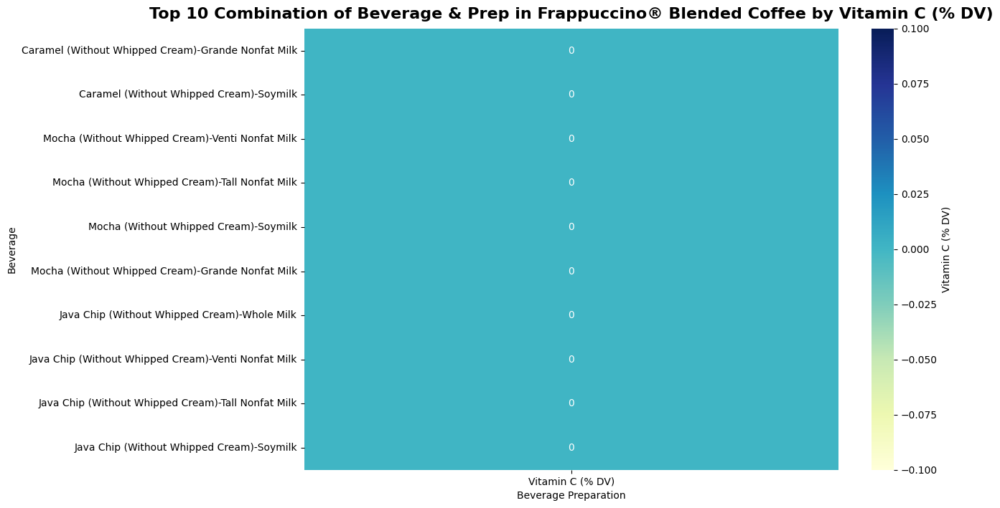

In [175]:
# Display the cross-tabulation sorted by highest Vitamin C (% DV)
top_10_vitamin_c = cross_tab_vitamin_c_sorted.head(10)

# Create a heatmap for Vitamin C (% DV)
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_vitamin_c, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Vitamin C (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Vitamin C (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Vitamin C (% DV)**

In [176]:
# Create a cross-tabulation without 'All' column for 'Vitamin C (% DV)'
cross_tab_vitamin_c = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Vitamin C (% DV)', values=df_Frali['Vitamin C (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest Vitamin C (% DV)
cross_tab_vitamin_c_sorted = cross_tab_vitamin_c.sort_values(by='Vitamin C (% DV)', ascending=False)

cross_tab_vitamin_c_sorted.head(10)


col_0                         Vitamin C (% DV)
Beverage  Beverage_prep                       
Caramel   Grande Nonfat Milk               0.0
          Tall Nonfat Milk                 0.0
          Venti Nonfat Milk                0.0
Coffee    Grande Nonfat Milk               0.0
          Tall Nonfat Milk                 0.0
          Venti Nonfat Milk                0.0
Java Chip Grande Nonfat Milk               0.0
          Tall Nonfat Milk                 0.0
          Venti Nonfat Milk                0.0
Mocha     Grande Nonfat Milk               0.0

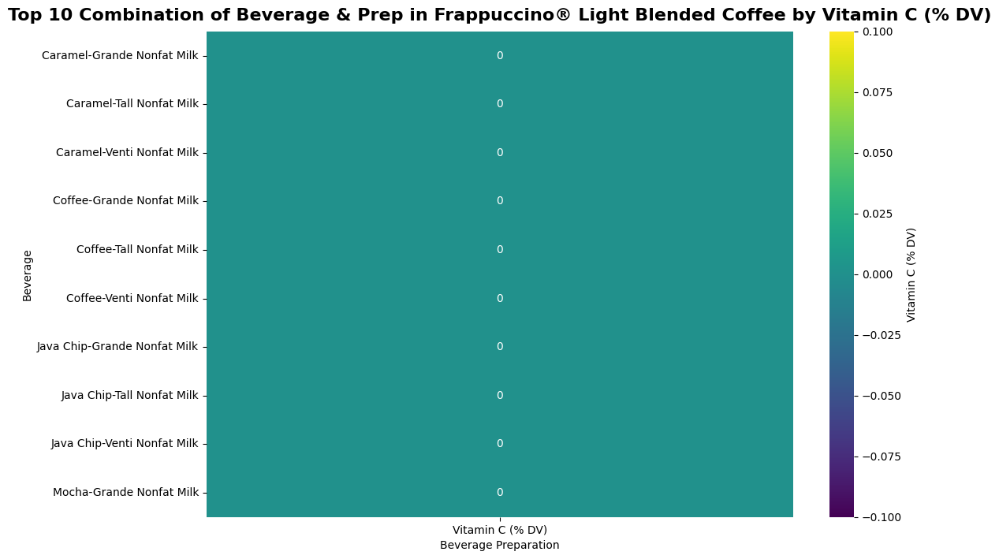

In [177]:
# Display the cross-tabulation sorted by lowest Vitamin C (% DV)
top_10_vitamin_c = cross_tab_vitamin_c_sorted.head(10)

# Create a heatmap for Vitamin C (% DV)
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_vitamin_c, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Vitamin C (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Vitamin C (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Calories in Frappuccino® Light Blended Coffee with Regression Lines**

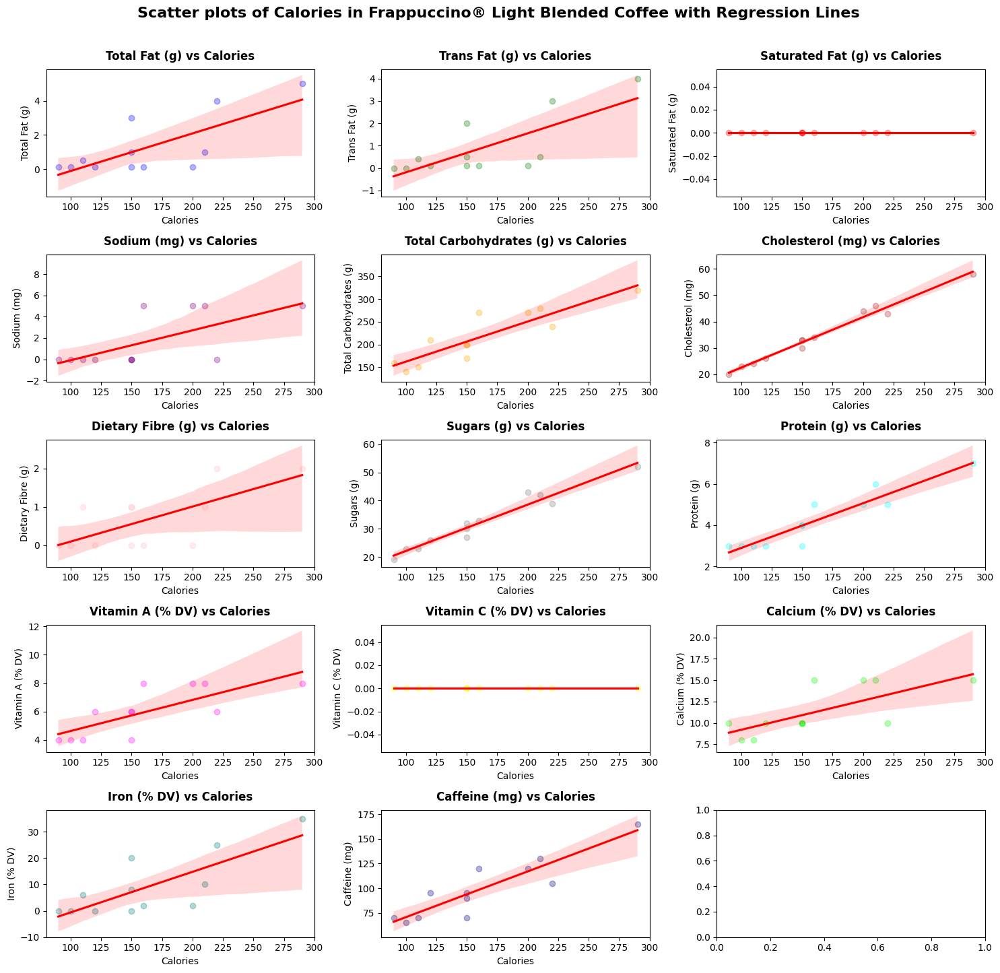

In [178]:
# Select relevant columns for Vitamin C
numeric_columns_vitamin_c = ['Calories', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                              'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                              'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                              'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_vitamin_c = df_Frali[numeric_columns_vitamin_c]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_vitamin_c = data_vitamin_c.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_vitamin_c[1:16], scatter_colors)):  # Exclude 'Calories', and limit to the first 15 columns
    sns.regplot(data=data_vitamin_c, x='Calories', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Calories', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calories')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calories in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Calories in Frappuccino® Blended Coffee with Regression Lines**

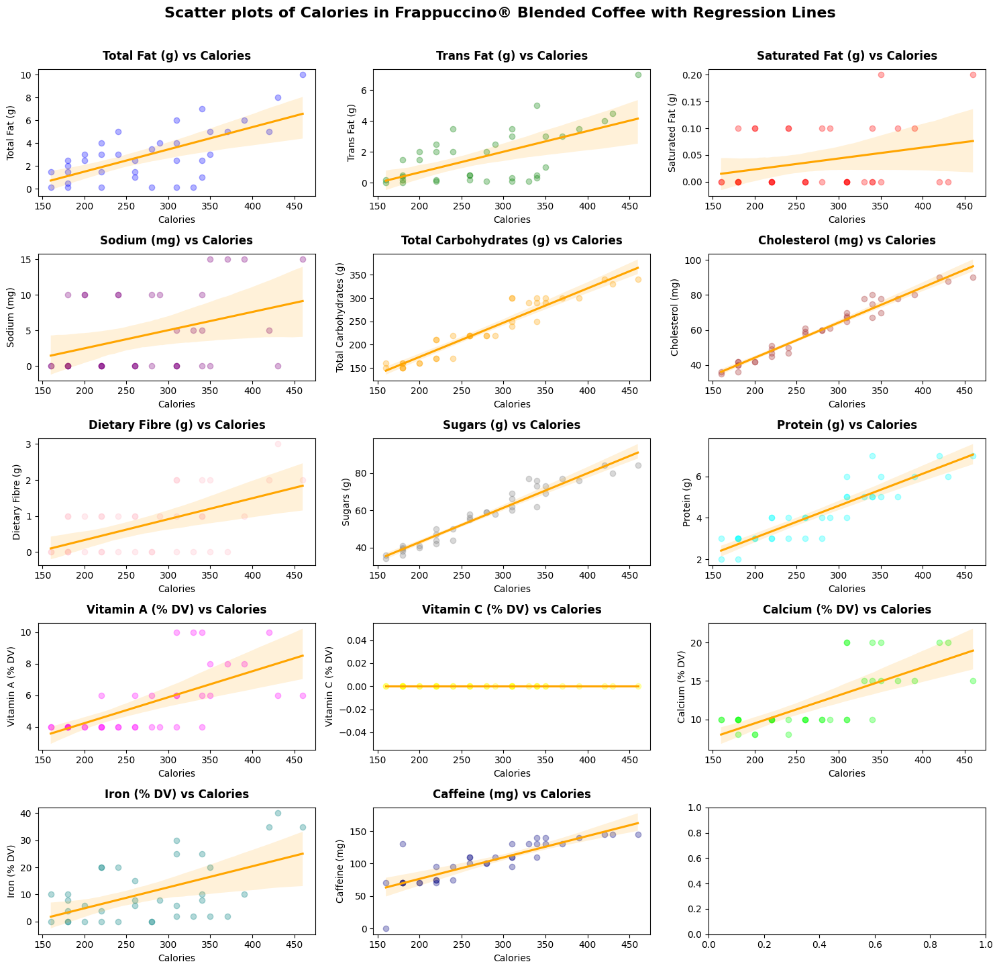

In [179]:
# Select relevant columns for Vitamin C
numeric_columns_vitamin_c = ['Calories', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                              'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                              'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                              'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_vitamin_c = df_Fra[numeric_columns_vitamin_c]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_vitamin_c = data_vitamin_c.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_vitamin_c[1:16], scatter_colors)):  # Exclude 'Calories', and limit to the first 15 columns
    sns.regplot(data=data_vitamin_c, x='Calories', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Calories', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calories')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calories in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **13. Calcium (% DV) Analysis Starbuck Product**
<img src = 'https://images.squarespace-cdn.com/content/v1/5d59f351fddabe00013cf3e6/4cddcebd-fe78-44ab-8479-55d772a65fa6/CALCIUM.png'>

## **Top 9 Beverage Categories by Average Calcium (% DV)**

In [181]:
# Calculate average Calcium (% DV) for each beverage category
avg_calcium = df.groupby(['Beverage_category'])[['Calcium (% DV)']].mean()

# Display the result
avg_calcium


,Calcium (% DV)
Beverage_category,
Classic Espresso Drinks,27.344828
Coffee,0.500000
Frappuccino® Blended Coffee,12.277778
Frappuccino® Blended Crème,13.333333
Frappuccino® Light Blended Coffee,11.333333
Shaken Iced Beverages,5.500000
Signature Espresso Drinks,31.375000
Smoothies,12.500000
Tazo® Tea Drinks,27.222222


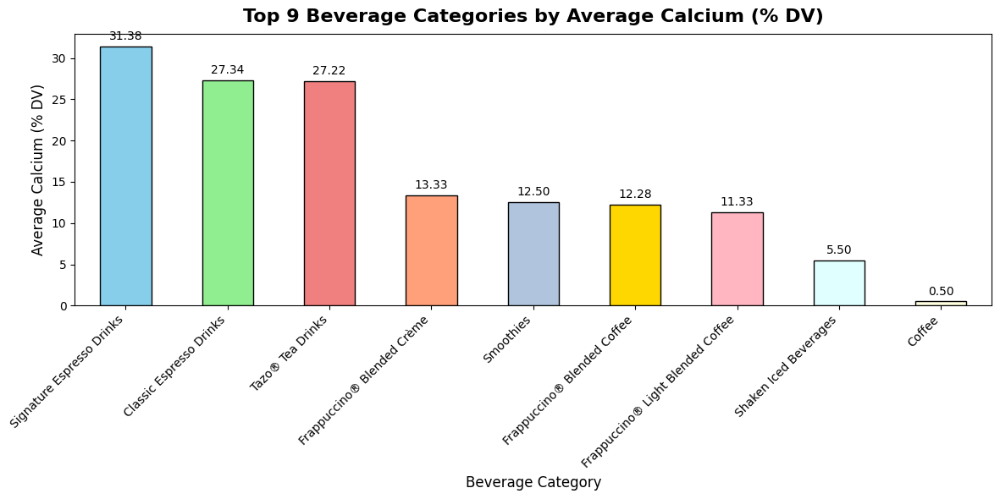

In [182]:
# Get the top 9 highest beverage categories by average Calcium (% DV)
top_9_avg_calcium = avg_calcium.sort_values(by='Calcium (% DV)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_calcium['Calcium (% DV)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_calcium['Calcium (% DV)']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Calcium (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Calcium (% DV)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Calcium (% DV) in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [183]:
# Calculate average Calcium (% DV) for each beverage category
avg_calcium = df_Fra.groupby('Beverage')[['Calcium (% DV)']].mean()

# Display the result
avg_calcium.head()


,Calcium (% DV)
Beverage,
Caramel (Without Whipped Cream),12.000000
Coffee,12.555556
Java Chip (Without Whipped Cream),12.555556
Mocha (Without Whipped Cream),12.000000


In [184]:
# Calculate average Calcium (% DV) for each beverage category
avg_calcium1 = df_Frali.groupby('Beverage')[['Calcium (% DV)']].mean()

# Display the result
avg_calcium1.head()


,Calcium (% DV)
Beverage,
Caramel,11.000000
Coffee,11.666667
Java Chip,11.666667
Mocha,11.000000


In [185]:
# Sort the DataFrame by 'Calcium (% DV)' column in descending order to get the highest values
top_5_highest_calcium = avg_calcium.sort_values(by='Calcium (% DV)', ascending=False).head(5)

# Display the result
top_5_highest_calcium


,Calcium (% DV)
Beverage,
Coffee,12.555556
Java Chip (Without Whipped Cream),12.555556
Caramel (Without Whipped Cream),12.000000
Mocha (Without Whipped Cream),12.000000


In [186]:
# Sort the DataFrame by 'Calcium (% DV)' column in ascending order to get the lowest values
top_5_lowest_calcium = avg_calcium1.sort_values(by='Calcium (% DV)', ascending=True).head(5)

# Display the result
top_5_lowest_calcium


,Calcium (% DV)
Beverage,
Caramel,11.000000
Mocha,11.000000
Coffee,11.666667
Java Chip,11.666667


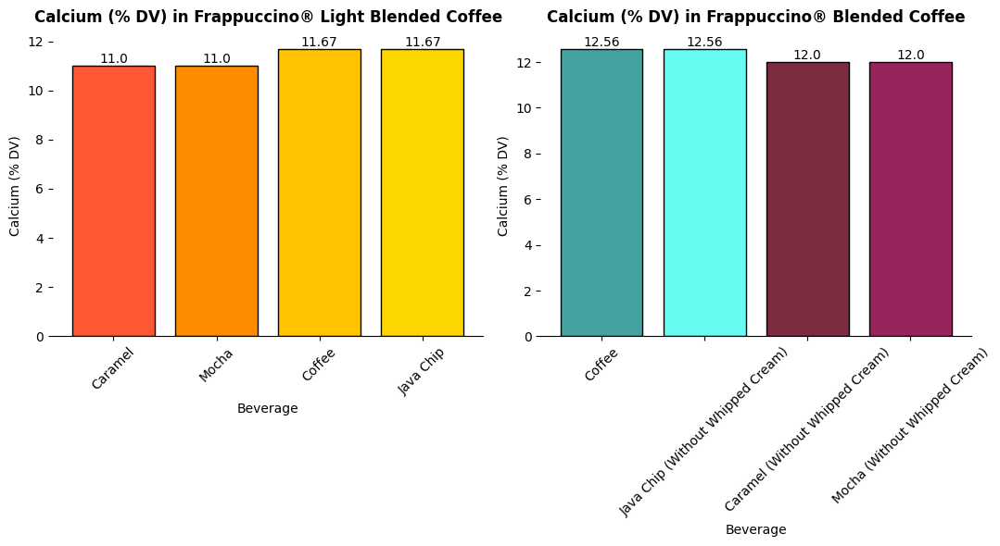

In [187]:
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest calcium
bars1 = axes[0].bar(top_5_lowest_calcium.index, top_5_lowest_calcium['Calcium (% DV)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Calcium (% DV) in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Calcium (% DV)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest calcium
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest calcium
bars2 = axes[1].bar(top_5_highest_calcium.index, top_5_highest_calcium['Calcium (% DV)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Calcium (% DV) in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Calcium (% DV)')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest calcium
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Calcium (% DV)**

In [188]:
# Create a cross-tabulation without 'All' column
cross_tab_calcium = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Calcium (% DV)', values=df_Fra['Calcium (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest calcium values
cross_tab_sorted_calcium = cross_tab_calcium.sort_values(by='Calcium (% DV)', ascending=False)

cross_tab_sorted_calcium.head(5)


,col_0,Calcium (% DV)
Beverage,Beverage_prep,
Coffee,Venti Nonfat Milk,20.000000
Java Chip (Without Whipped Cream),Venti Nonfat Milk,20.000000
Mocha (Without Whipped Cream),Venti Nonfat Milk,15.000000
Caramel (Without Whipped Cream),Venti Nonfat Milk,15.000000
Coffee,Soymilk,13.333333


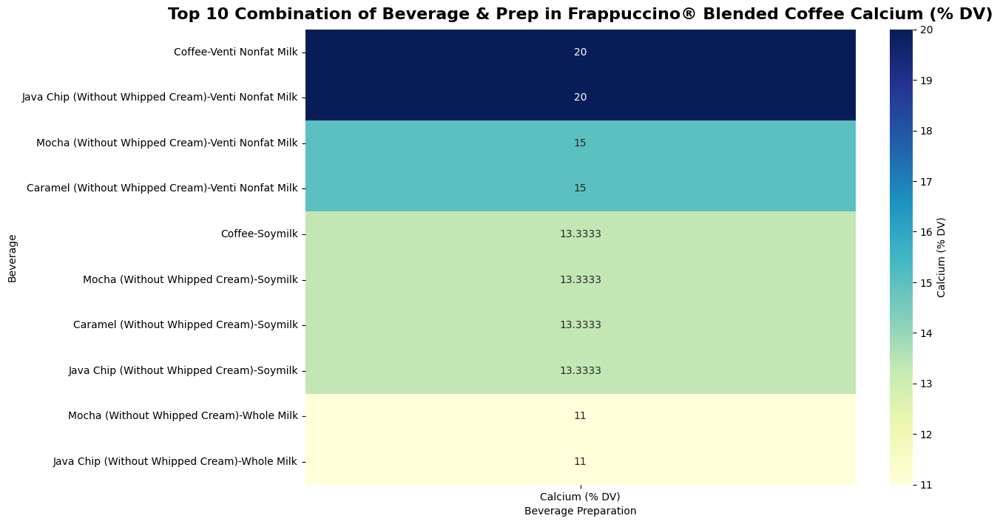

In [189]:
# Display the cross-tabulation sorted by highest calcium values
top_10_calcium = cross_tab_sorted_calcium.head(10)

# Create a heatmap for calcium
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_calcium, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Calcium (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Calcium (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Calcium (% DV)**

In [190]:
# Create a cross-tabulation without 'All' column
cross_tab_calcium = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Calcium (% DV)', values=df_Frali['Calcium (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest calcium values
cross_tab_sorted_calcium = cross_tab_calcium.sort_values(by='Calcium (% DV)', ascending=False)

cross_tab_sorted_calcium.head(10)


col_0                         Calcium (% DV)
Beverage  Beverage_prep                     
Caramel   Venti Nonfat Milk             15.0
Coffee    Venti Nonfat Milk             15.0
Java Chip Venti Nonfat Milk             15.0
Mocha     Venti Nonfat Milk             15.0
Caramel   Grande Nonfat Milk            10.0
Coffee    Grande Nonfat Milk            10.0
          Tall Nonfat Milk              10.0
Java Chip Grande Nonfat Milk            10.0
          Tall Nonfat Milk              10.0
Mocha     Grande Nonfat Milk            10.0

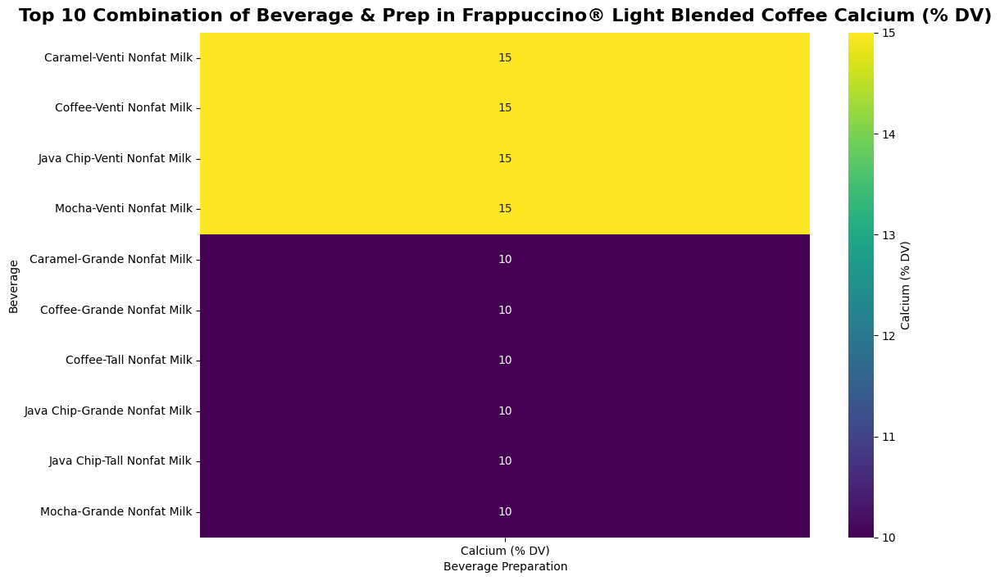

In [191]:
# Display the cross-tabulation sorted by lowest calcium values
top_10_calcium = cross_tab_sorted_calcium.head(10)

# Create a heatmap for calcium
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_calcium, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Calcium (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Calcium (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Calcium (% DV) in Frappuccino® Light Blended Coffee with Regression Lines**

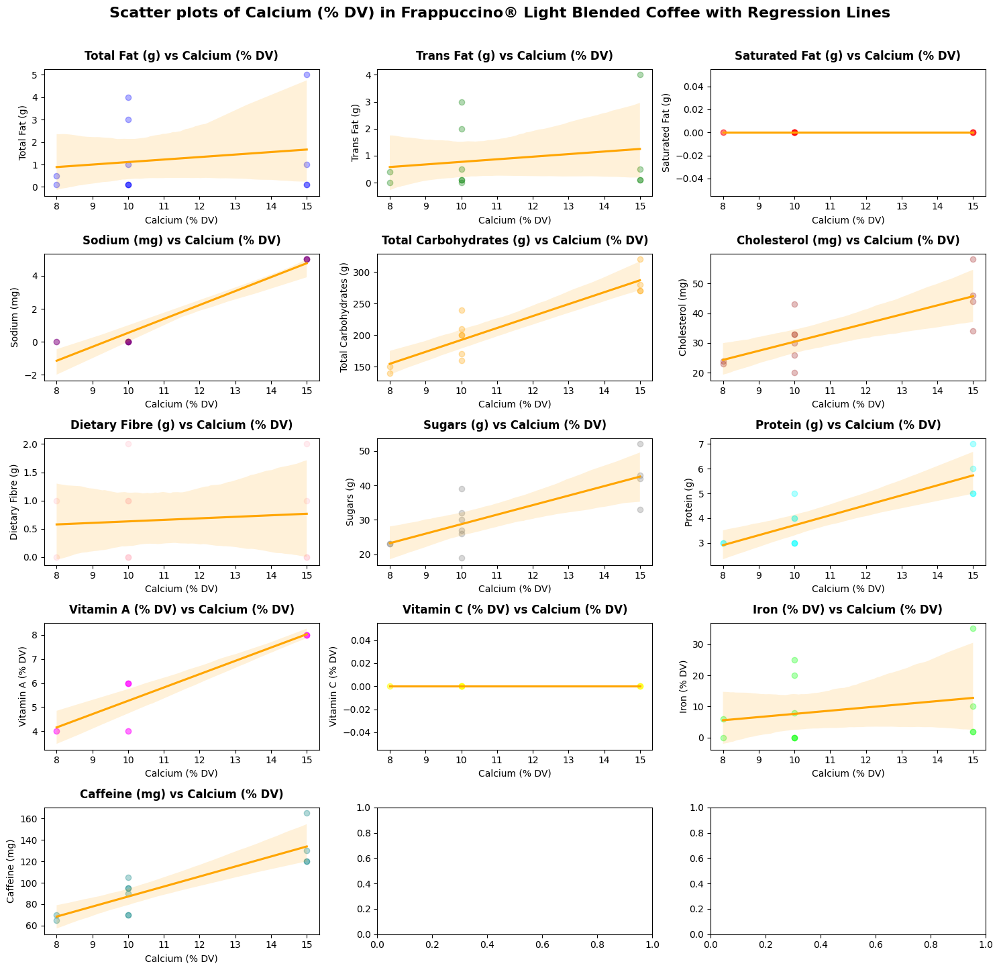

In [192]:
# Select relevant columns
numeric_columns_calcium = ['Calcium (% DV)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                            'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                            'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                            'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_calcium = df_Frali[numeric_columns_calcium]

# Re-assuring to any remaining handling missing values by dropping rows with any missing values
data_calcium = data_calcium.dropna()

# Create scatter plots with regression lines for Calcium
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_calcium[1:], scatter_colors)):  # Exclude 'Calcium (% DV)', and limit to the first 14 columns
    sns.regplot(data=data_calcium, x='Calcium (% DV)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Calcium (% DV)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calcium (% DV)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calcium (% DV) in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Calcium (% DV) in Frappuccino® Light Blended Coffee with Regression Lines**

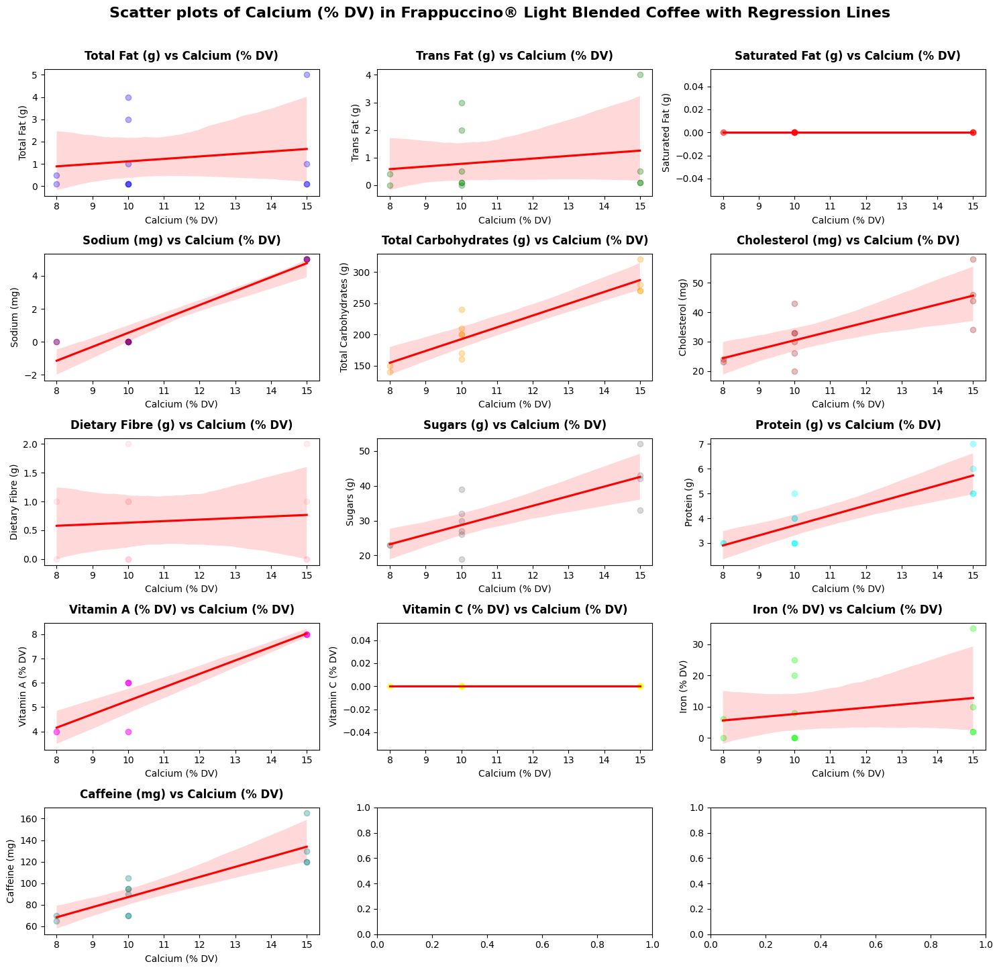

In [193]:
# Select relevant columns
numeric_columns_calcium = ['Calcium (% DV)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                            'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                            'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                            'Iron (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_calcium = df_Frali[numeric_columns_calcium]

# Re-assuring to any remaining handling missing values by dropping rows with any missing values
data_calcium = data_calcium.dropna()

# Create scatter plots with regression lines for Calcium
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_calcium[1:], scatter_colors)):  # Exclude 'Calcium (% DV)', and limit to the first 14 columns
    sns.regplot(data=data_calcium, x='Calcium (% DV)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Calcium (% DV)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Calcium (% DV)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Calcium (% DV) in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **14. Iron (% DV) Analysis Starbuck Product**
<img src = 'https://thumbs.dreamstime.com/z/iron-food-sources-health-benefits-infographic-poster-vector-design-161935609.jpg'>

## **Top 9 Beverage Categories by Average Iron (% DV)**

In [194]:
# Calculate average Iron (% DV) for each beverage category
avg_iron_dv = df.groupby(['Beverage_category'])[['Iron (% DV)']].mean()

avg_iron_dv


,Iron (% DV)
Beverage_category,
Classic Espresso Drinks,8.103448
Coffee,0.000000
Frappuccino® Blended Coffee,10.861111
Frappuccino® Blended Crème,3.333333
Frappuccino® Light Blended Coffee,9.000000
Shaken Iced Beverages,1.000000
Signature Espresso Drinks,10.550000
Smoothies,13.250000
Tazo® Tea Drinks,5.666667


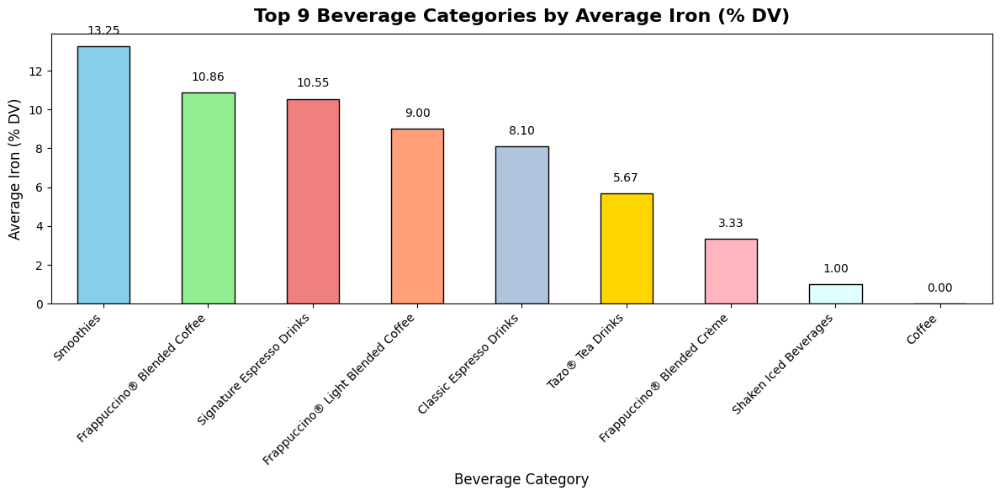

In [195]:
# Get the top 9 highest beverage categories by average Iron (% DV)
top_9_avg_iron_dv = avg_iron_dv.sort_values(by='Iron (% DV)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_iron_dv['Iron (% DV)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_iron_dv['Iron (% DV)']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Iron (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Iron (% DV)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Iron (% DV) in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffee**

In [196]:
# Calculate average Iron (% DV) for each beverage in df_Fra
avg_iron_dv = df_Fra.groupby('Beverage')[['Iron (% DV)']].mean()

avg_iron_dv.head()


,Iron (% DV)
Beverage,
Caramel (Without Whipped Cream),2.444444
Coffee,2.666667
Java Chip (Without Whipped Cream),27.777778
Mocha (Without Whipped Cream),10.555556


In [197]:
# Calculate average Iron (% DV) for each beverage in df_Frali
avg_iron_dv1 = df_Frali.groupby('Beverage')[['Iron (% DV)']].mean()

avg_iron_dv1.head()


,Iron (% DV)
Beverage,
Caramel,0.666667
Coffee,0.666667
Java Chip,26.666667
Mocha,8.000000


In [198]:
# Sort the DataFrame by 'Iron (% DV)' column in descending order to get the highest values
top_5_highest_iron_dv = avg_iron_dv.sort_values(by='Iron (% DV)', ascending=False).head(5)

top_5_highest_iron_dv


,Iron (% DV)
Beverage,
Java Chip (Without Whipped Cream),27.777778
Mocha (Without Whipped Cream),10.555556
Coffee,2.666667
Caramel (Without Whipped Cream),2.444444


In [199]:
# Sort the DataFrame by 'Iron (% DV)' column in ascending order to get the lowest values
top_5_lowest_iron_dv = avg_iron_dv1.sort_values(by='Iron (% DV)', ascending=True).head(5)

top_5_lowest_iron_dv


,Iron (% DV)
Beverage,
Caramel,0.666667
Coffee,0.666667
Mocha,8.000000
Java Chip,26.666667


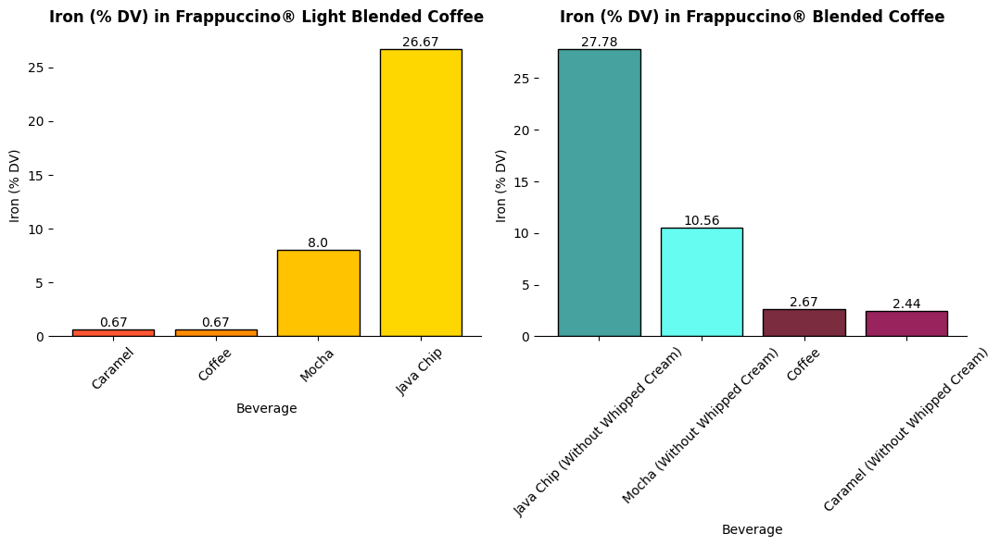

In [200]:
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest Iron (% DV)
bars1 = axes[0].bar(top_5_lowest_iron_dv.index, top_5_lowest_iron_dv['Iron (% DV)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Iron (% DV) in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Iron (% DV)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest Iron (% DV)
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest Iron (% DV)
bars2 = axes[1].bar(top_5_highest_iron_dv.index, top_5_highest_iron_dv['Iron (% DV)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Iron (% DV) in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Iron (% DV)')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest Iron (% DV)
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Iron (% DV)**

In [201]:
# Create a cross-tabulation without 'All' column for Iron (% DV)
cross_tab_iron = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Iron (% DV)', values=df_Fra['Iron (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest Iron (% DV)
cross_tab_iron_sorted = cross_tab_iron.sort_values(by='Iron (% DV)', ascending=False)

cross_tab_iron_sorted.head(5)


col_0                                                 Iron (% DV)
Beverage                          Beverage_prep                  
Java Chip (Without Whipped Cream) Venti Nonfat Milk     35.000000
                                  Soymilk               30.000000
                                  Whole Milk            26.666667
                                  Grande Nonfat Milk    25.000000
                                  Tall Nonfat Milk      20.000000

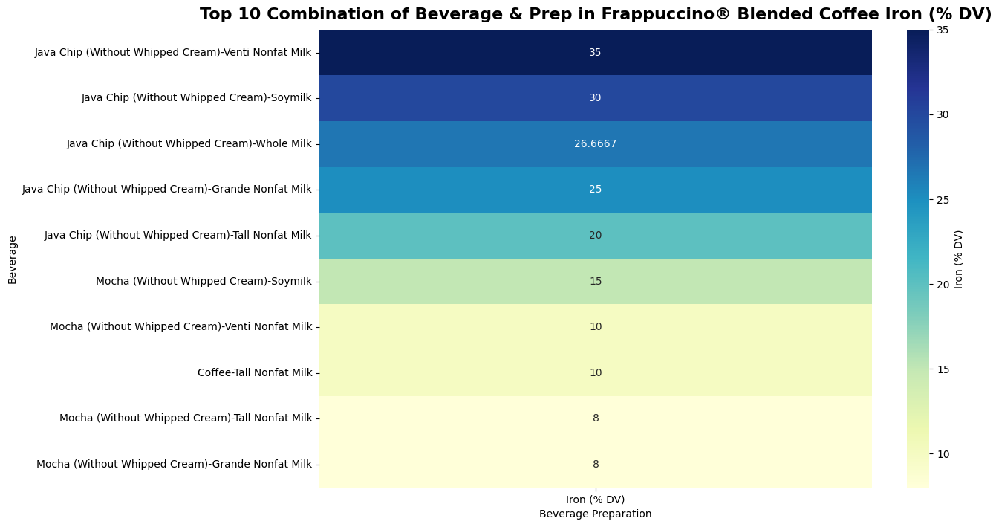

In [202]:
# Display the cross-tabulation sorted by highest Iron (% DV)
top_10_iron = cross_tab_iron_sorted.head(10)

# Create a heatmap for Iron (% DV)
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_iron, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Iron (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee Iron (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Iron (% DV)**

In [203]:
# Create a cross-tabulation without 'All' column for Iron (% DV)
cross_tab_iron = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Iron (% DV)', values=df_Frali['Iron (% DV)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest Iron (% DV)
cross_tab_iron_sorted = cross_tab_iron.sort_values(by='Iron (% DV)', ascending=False)

cross_tab_iron_sorted.head(10)


col_0                         Iron (% DV)
Beverage  Beverage_prep                  
Java Chip Venti Nonfat Milk          35.0
          Grande Nonfat Milk         25.0
          Tall Nonfat Milk           20.0
Mocha     Venti Nonfat Milk          10.0
          Grande Nonfat Milk          8.0
          Tall Nonfat Milk            6.0
Caramel   Venti Nonfat Milk           2.0
Coffee    Venti Nonfat Milk           2.0
Caramel   Grande Nonfat Milk          0.0
          Tall Nonfat Milk            0.0

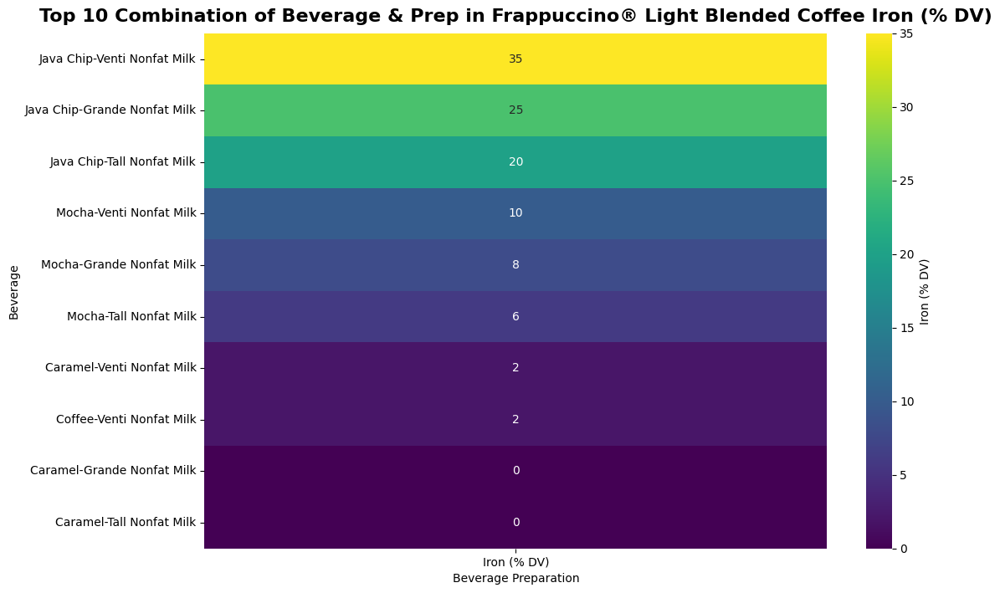

In [204]:
# Display the cross-tabulation sorted by lowest Iron (% DV)
top_10_iron = cross_tab_iron_sorted.head(10)

# Create a heatmap for Iron (% DV)
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_iron, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Iron (% DV)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee Iron (% DV)', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Iron (% DV) in Frappuccino® Light Blended Coffee with Regression Lines**

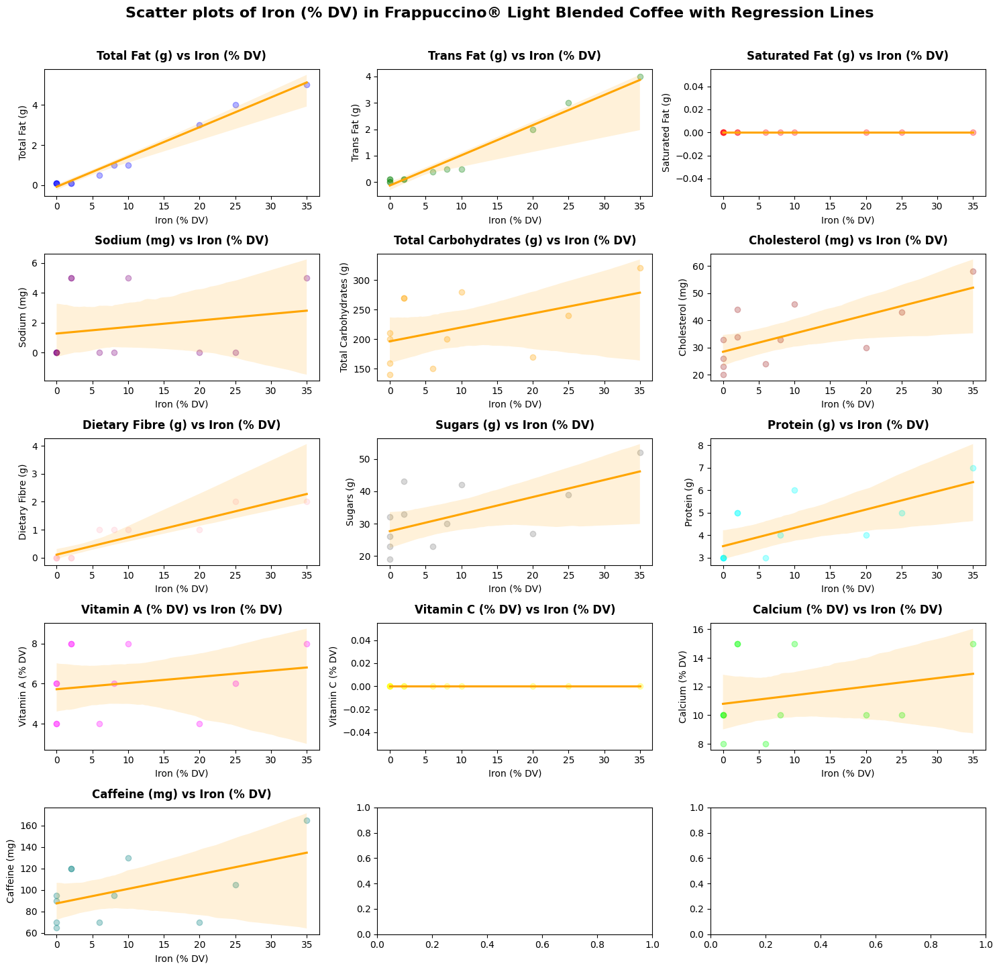

In [205]:
# Select relevant columns
numeric_columns_iron = ['Iron (% DV)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                        'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                        'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                        'Calcium (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame
data_iron = df_Frali[numeric_columns_iron]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_iron = data_iron.dropna()

# Create scatter plots with regression lines for 'Iron (% DV)'
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy']

for i, (col, color) in enumerate(zip(numeric_columns_iron[1:], scatter_colors)):  # Exclude 'Iron (% DV)' and limit to the first 14 columns
    sns.regplot(data=data_iron, x='Iron (% DV)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Iron (% DV)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Iron (% DV)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Iron (% DV) in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Iron (% DV) in Frappuccino® Light Blended Coffee with Regression Lines**

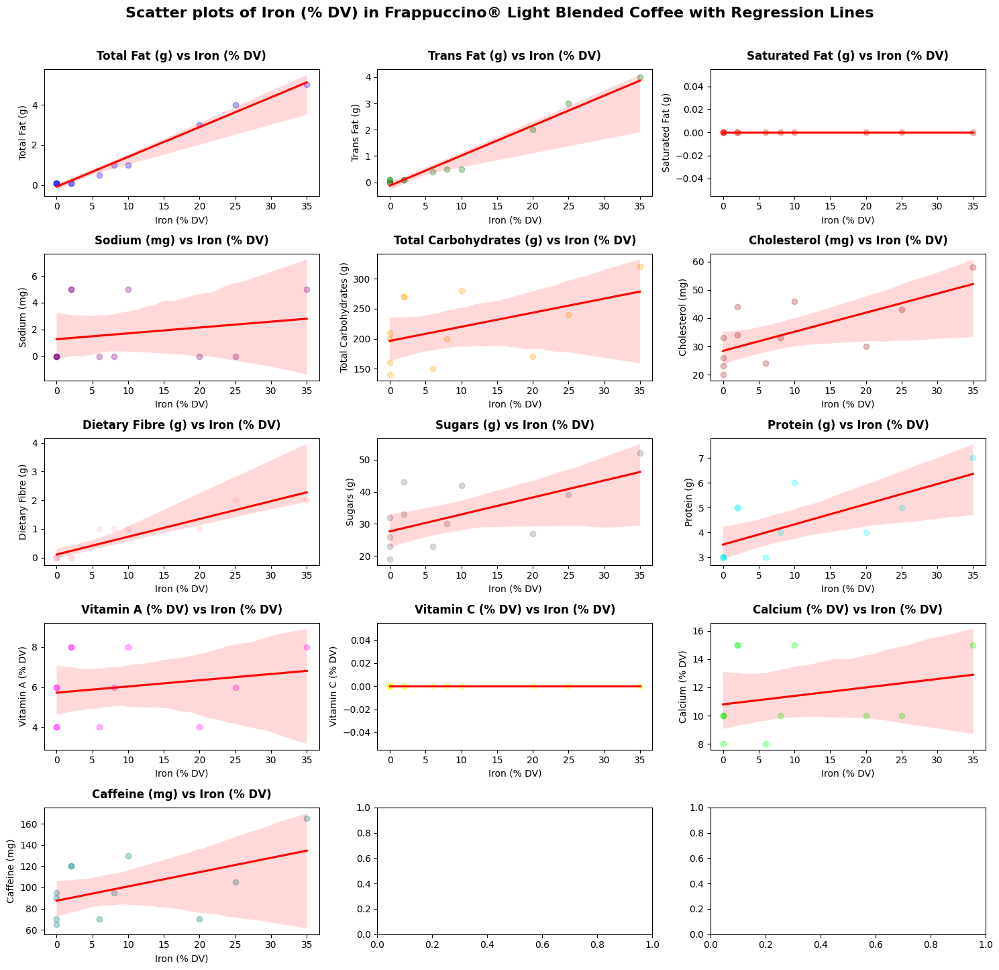

In [206]:
# Select relevant columns for Iron (% DV)
numeric_columns_iron = ['Iron (% DV)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                        'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                        'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                        'Calcium (% DV)', 'Caffeine (mg)']

# Select numeric columns from DataFrame for Iron (% DV)
data_iron = df_Frali[numeric_columns_iron]

# Reassuring to any remaining handling missing values by dropping rows with any missing values
data_iron = data_iron.dropna()

# Create scatter plots with regression lines for 'Iron (% DV)'
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                  'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_iron[1:], scatter_colors)):  # Exclude 'Iron (% DV)' and limit to the first 14 columns
    sns.regplot(data=data_iron, x='Iron (% DV)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Iron (% DV)', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Iron (% DV)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Iron (% DV) in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **15. Caffeine (mg) Analysis Starbuck Product**
<img src = 'https://www.billi-uk.com/wp-content/uploads/2017/08/amount-of-caffeine-in-drinks.jpg'>

## **Top 9 Beverage Categories by Average Caffeine Content**

In [207]:
# Calculate average caffeine for each beverage category
avg_caffeine = df.groupby(['Beverage_category'])[['Caffeine (mg)']].mean()


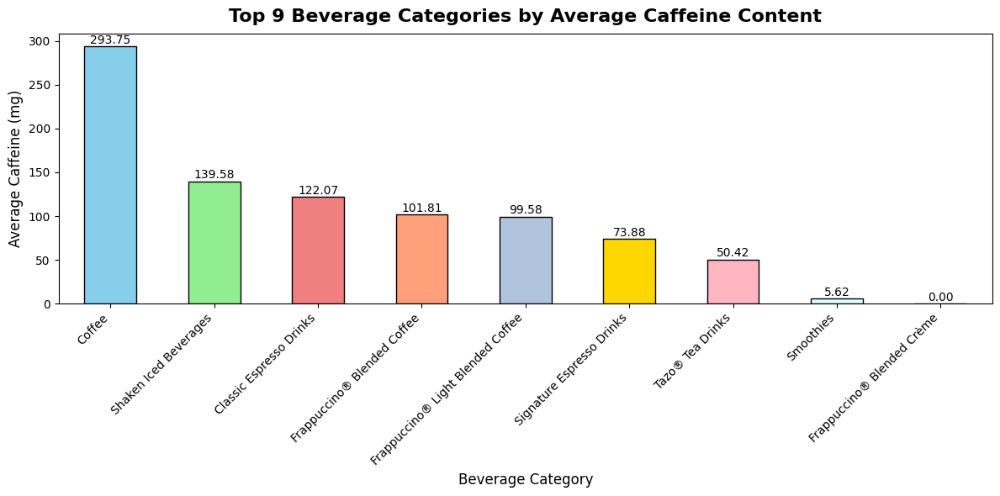

In [208]:
# Get the top 9 highest beverage categories by average caffeine
top_9_avg_caffeine = avg_caffeine.sort_values(by='Caffeine (mg)', ascending=False).head(9)

# Plotting with different colors for each bar
plt.figure(figsize=(12, 6))  # Adjusted figsize
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightsteelblue', 'gold', 'lightpink', 'lightcyan', 'lightyellow']
top_9_avg_caffeine['Caffeine (mg)'].plot(kind='bar', color=colors, edgecolor='black')

# Adding annotations
for i, value in enumerate(top_9_avg_caffeine['Caffeine (mg)']):
    plt.text(i, value + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
plt.title('Top 9 Beverage Categories by Average Caffeine Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Category', fontsize=12)
plt.ylabel('Average Caffeine (mg)', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


## **Average Caffeine in Frappuccino® Light Blended Coffee & Frappuccino® Blended Coffe**

In [209]:
# Calculate average caffeine for each beverage
avg_caffeine = df_Fra.groupby('Beverage')[['Caffeine (mg)']].mean()

avg_caffeine.head()


,Caffeine (mg)
Beverage,
Caramel (Without Whipped Cream),100.000000
Coffee,83.888889
Java Chip (Without Whipped Cream),110.000000
Mocha (Without Whipped Cream),113.333333


In [210]:
# Calculate average caffeine for each beverage
avg_caffeine1 = df_Frali.groupby('Beverage')[['Caffeine (mg)']].mean()

avg_caffeine1.head()


,Caffeine (mg)
Beverage,
Caramel,91.666667
Coffee,95.000000
Java Chip,113.333333
Mocha,98.333333


In [211]:
# Sort the DataFrame by 'Caffeine (mg)' column in descending order to get the highest values
top_5_highest_caffeine = avg_caffeine.sort_values(by='Caffeine (mg)', ascending=False).head(5)


In [212]:
# Sort the DataFrame by 'Caffeine (mg)' column in ascending order to get the lowest values
top_5_lowest_caffeine = avg_caffeine1.sort_values(by='Caffeine (mg)', ascending=True).head(5)


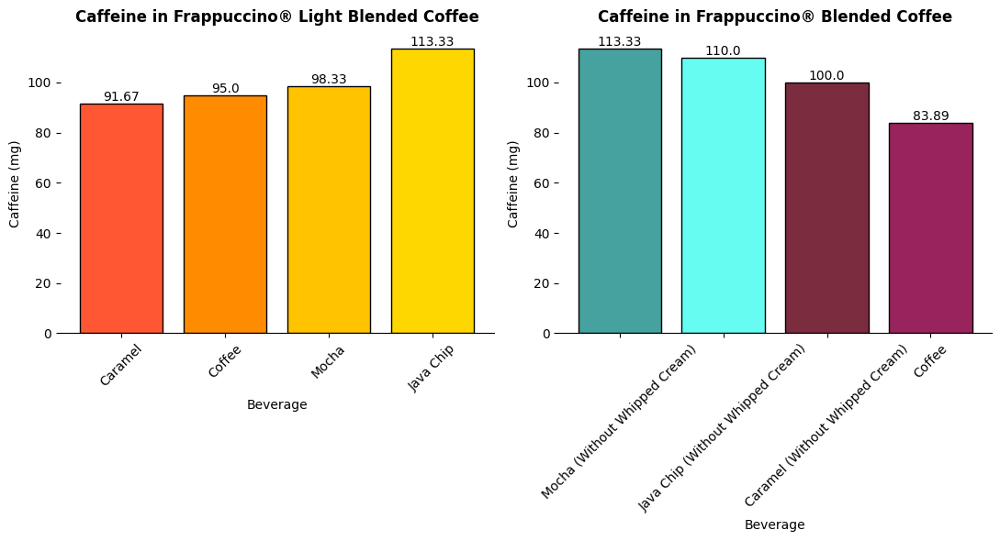

In [213]:
fig, axes = plt.subplots(1, 2, figsize=(11, 6))

# Plotting the top 5 lowest caffeine
bars1 = axes[0].bar(top_5_lowest_caffeine.index, top_5_lowest_caffeine['Caffeine (mg)'], color=custom_colors, edgecolor='black')
axes[0].set_title('Caffeine in Frappuccino® Light Blended Coffee', size=12, pad=10, fontweight='bold')
axes[0].set_xlabel('Beverage')
axes[0].set_ylabel('Caffeine (mg)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 lowest caffeine
for bar in bars1:
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

# Plotting the top 5 highest caffeine
bars2 = axes[1].bar(top_5_highest_caffeine.index, top_5_highest_caffeine['Caffeine (mg)'], color=custom_colors1, edgecolor='black')
axes[1].set_title('Caffeine in Frappuccino® Blended Coffee', size=12, pad=10, fontweight='bold')
axes[1].set_xlabel('Beverage')
axes[1].set_ylabel('Caffeine (mg)')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].spines['left'].set_visible(False)

# Adding annotations to the bars for the top 5 highest caffeine
for bar in bars2:
    yval = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Caffeine Content**

In [214]:
# Create a cross-tabulation without 'All' column for caffeine
cross_tab_caffeine = pd.crosstab(index=[df_Fra['Beverage'], df_Fra['Beverage_prep']], columns='Caffeine (mg)', values=df_Fra['Caffeine (mg)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest caffeine
cross_tab_caffeine_sorted = cross_tab_caffeine.sort_values(by='Caffeine (mg)', ascending=False)

cross_tab_caffeine_sorted.head(5)


,col_0,Caffeine (mg)
Beverage,Beverage_prep,
Java Chip (Without Whipped Cream),Venti Nonfat Milk,145.0
Mocha (Without Whipped Cream),Venti Nonfat Milk,140.0
Caramel (Without Whipped Cream),Venti Nonfat Milk,130.0
Mocha (Without Whipped Cream),Tall Nonfat Milk,130.0
Java Chip (Without Whipped Cream),Grande Nonfat Milk,110.0


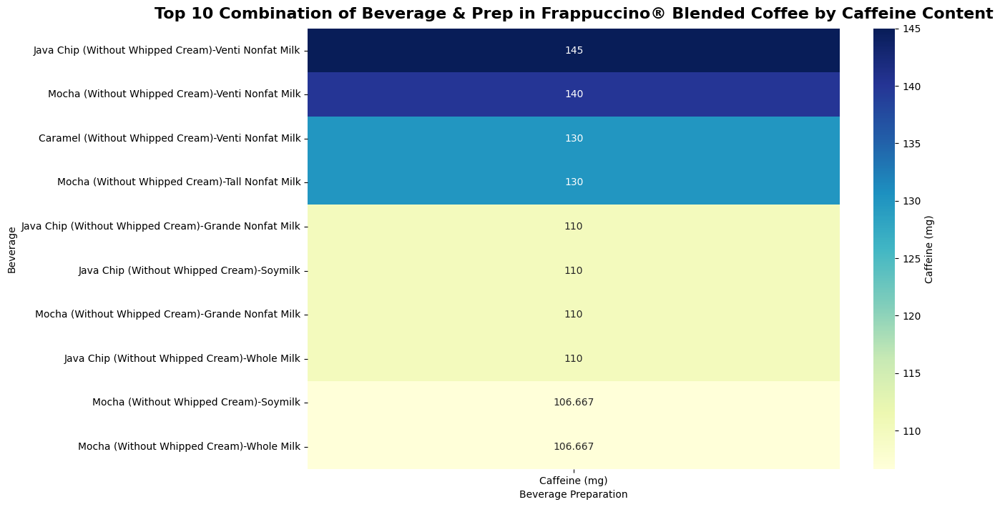

In [215]:
# Display the cross-tabulation sorted by highest caffeine
top_10_caffeine = cross_tab_caffeine_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_caffeine, annot=True, cmap="YlGnBu", fmt='g', cbar_kws={'label': 'Caffeine (mg)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Blended Coffee by Caffeine Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Caffeine Content**

In [216]:
# Create a cross-tabulation without 'All' column for caffeine
cross_tab_caffeine = pd.crosstab(index=[df_Frali['Beverage'], df_Frali['Beverage_prep']], columns='Caffeine (mg)', values=df_Frali['Caffeine (mg)'], aggfunc='mean')

# Display the cross-tabulation sorted by highest caffeine
cross_tab_caffeine_sorted = cross_tab_caffeine.sort_values(by='Caffeine (mg)', ascending=False)

cross_tab_caffeine_sorted.head(10)


,col_0,Caffeine (mg)
Beverage,Beverage_prep,
Java Chip,Venti Nonfat Milk,165.0
Mocha,Venti Nonfat Milk,130.0
Caramel,Venti Nonfat Milk,120.0
Coffee,Venti Nonfat Milk,120.0
Java Chip,Grande Nonfat Milk,105.0
Coffee,Grande Nonfat Milk,95.0
Mocha,Grande Nonfat Milk,95.0
Caramel,Grande Nonfat Milk,90.0
Coffee,Tall Nonfat Milk,70.0


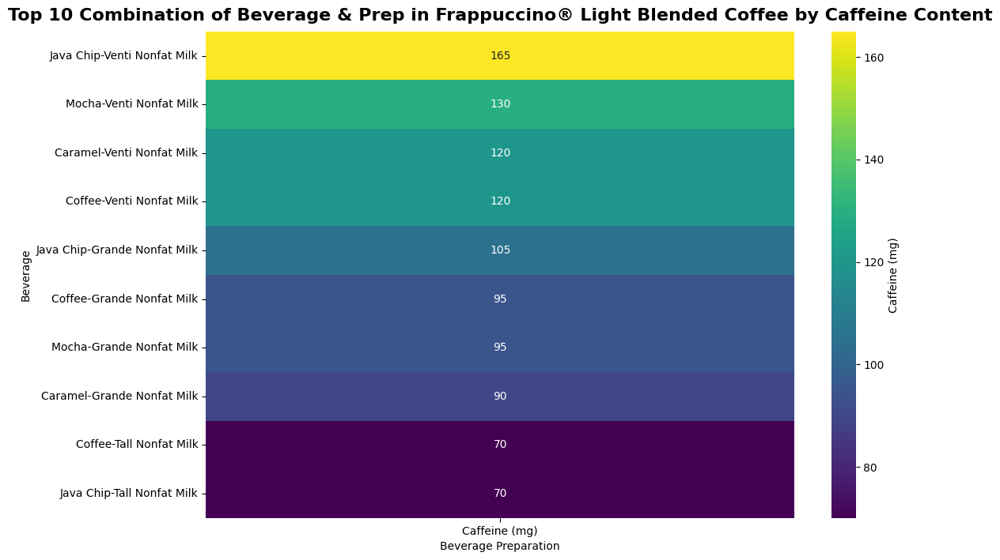

In [217]:
# Display the cross-tabulation sorted by lowest caffeine
top_10_caffeine = cross_tab_caffeine_sorted.head(10)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(top_10_caffeine, annot=True, cmap="viridis", fmt='g', cbar_kws={'label': 'Caffeine (mg)'})
plt.title('Top 10 Combination of Beverage & Prep in Frappuccino® Light Blended Coffee by Caffeine Content', size=16, pad=10, fontweight='bold')
plt.xlabel('Beverage Preparation')
plt.ylabel('Beverage')

plt.show()


## **Scatter plots of Caffeine in Frappuccino® Blended Coffee with Regression Lines**

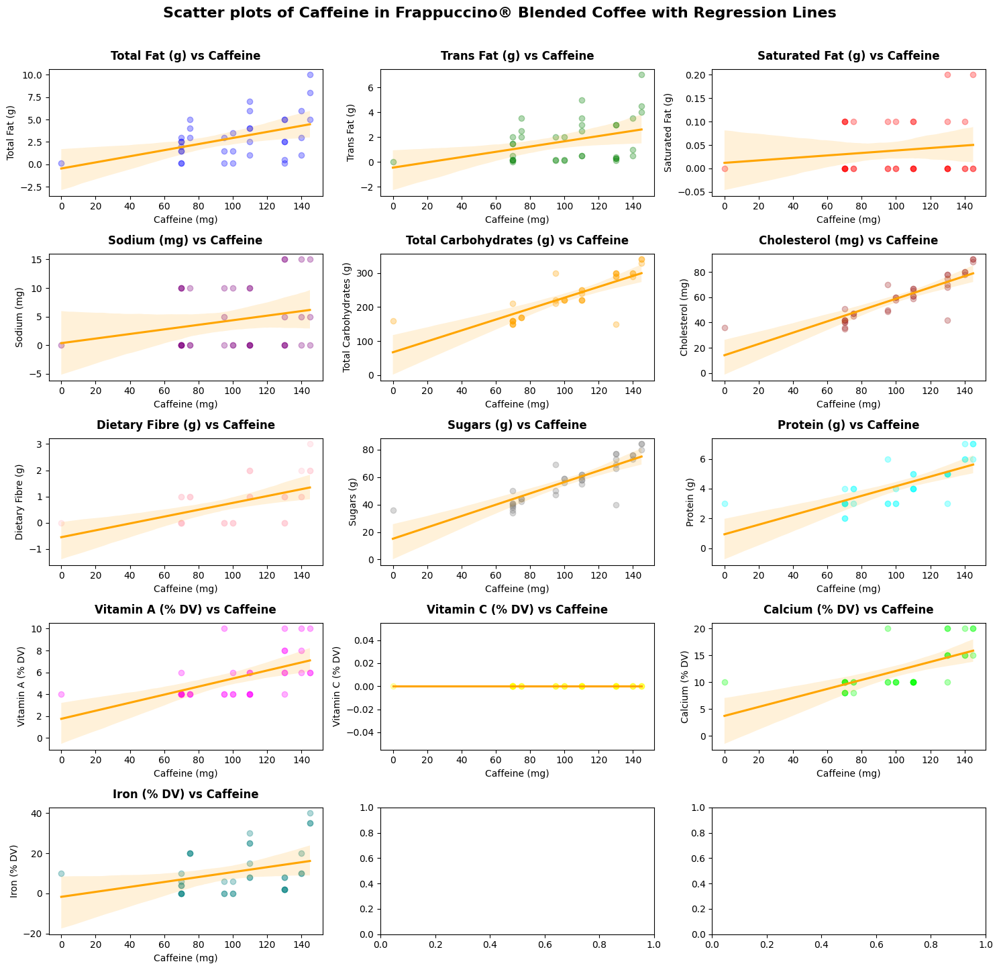

In [218]:
# Select relevant columns
numeric_columns_caffeine = ['Caffeine (mg)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                             'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                             'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                             'Calcium (% DV)', 'Iron (% DV)']

# Select numeric columns from DataFrame
data_caffeine = df_Fra[numeric_columns_caffeine]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_caffeine = data_caffeine.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_caffeine = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                            'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_caffeine[1:], scatter_colors_caffeine)):  # Exclude 'Caffeine (mg)' in x-axis
    sns.regplot(data=data_caffeine, x='Caffeine (mg)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'orange'})
    axes[i//3, i%3].set_title(f'{col} vs Caffeine', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Caffeine (mg)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Caffeine in Frappuccino® Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Scatter plots of Caffeine in Frappuccino® Light Blended Coffee with Regression Lines**

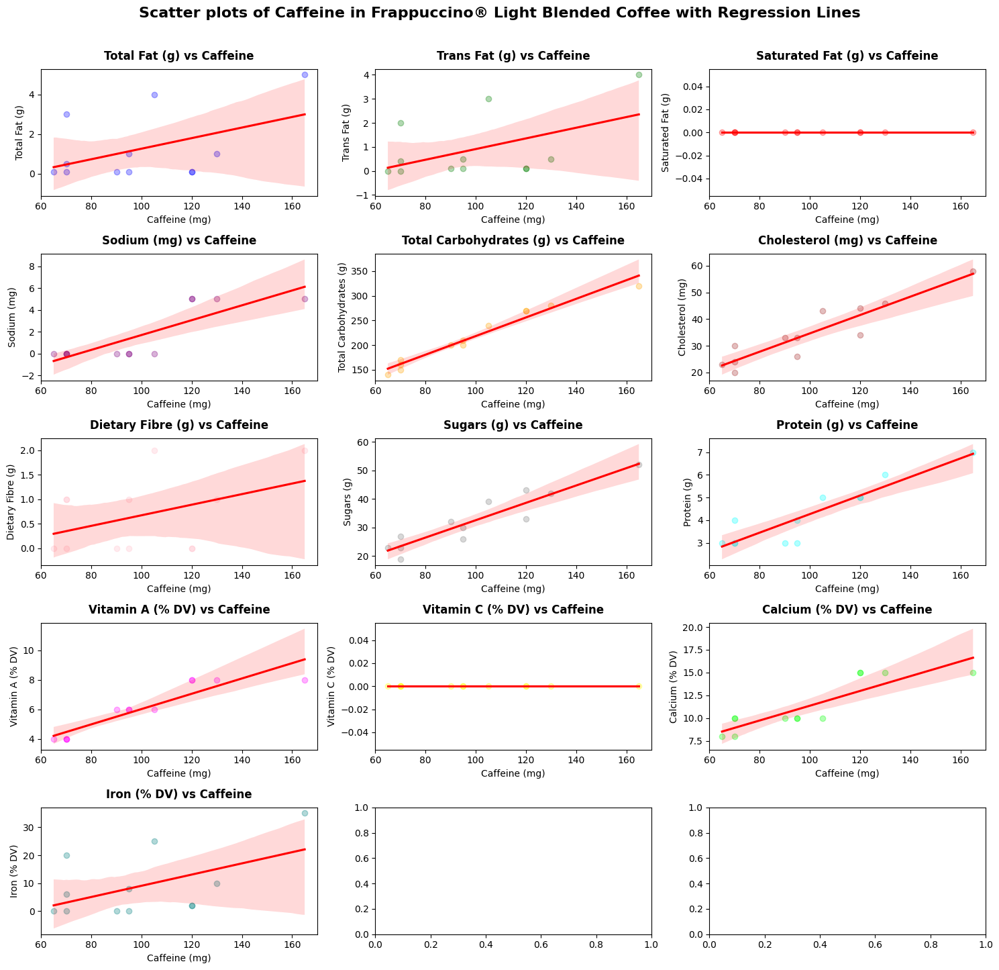

In [219]:
# Select relevant columns
numeric_columns_caffeine = ['Caffeine (mg)', 'Total Fat (g)', 'Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                             'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                             'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                             'Calcium (% DV)', 'Iron (% DV)']

# Select numeric columns from DataFrame
data_caffeine = df_Frali[numeric_columns_caffeine]

# Reassuring to any remaining Handling missing values by dropping rows with any missing values
data_caffeine = data_caffeine.dropna()

# Create scatter plots with regression lines
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

# Define a list of colors for scatter plots
scatter_colors_caffeine = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta',
                            'yellow', 'lime', 'teal', 'navy', 'salmon']

for i, (col, color) in enumerate(zip(numeric_columns_caffeine[1:], scatter_colors_caffeine)):  # Exclude 'Caffeine (mg)' in x-axis
    sns.regplot(data=data_caffeine, x='Caffeine (mg)', y=col, ax=axes[i//3, i%3], scatter_kws={'alpha': 0.3, 'color': color}, line_kws={'color': 'red'})
    axes[i//3, i%3].set_title(f'{col} vs Caffeine', pad=10, fontweight='bold', fontsize=12)
    axes[i//3, i%3].set_xlabel('Caffeine (mg)')
    axes[i//3, i%3].set_ylabel(col)

plt.suptitle('Scatter plots of Caffeine in Frappuccino® Light Blended Coffee with Regression Lines', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()


## **Save the cleaned dataframe to a new Excel file**

In [235]:
df.to_excel('Cleaned Starbuck-Data.xlsx', index=False)

## **Summary of Correlation Analysis in Frappuccino® Blended Coffee**

,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
Calories,1.000000,0.564499,0.543505,0.209449,0.376690,0.964194,0.979567,0.488539,0.977579,0.905193,0.734241,NaN,0.749388,0.434429,0.887770
Total Fat (g),0.564499,1.000000,0.960125,0.565030,0.487724,0.443822,0.426751,0.607562,0.415333,0.380234,0.018322,NaN,0.136225,0.532708,0.447928
Trans Fat (g),0.543505,0.960125,1.000000,0.576730,0.537113,0.420949,0.424055,0.648746,0.403879,0.408590,0.059128,NaN,0.063515,0.575380,0.459333
Saturated Fat (g),0.209449,0.565030,0.576730,1.000000,0.910803,0.132131,0.089233,-0.071845,0.094477,0.057099,-0.078156,NaN,-0.220384,-0.142491,0.056244
Sodium (mg),0.376690,0.487724,0.537113,0.910803,1.000000,0.333783,0.300597,-0.085700,0.308105,0.277352,0.212625,NaN,0.000000,-0.107804,0.210164
Total Carbohydrates (g),0.964194,0.443822,0.420949,0.132131,0.333783,1.000000,0.971295,0.391183,0.970669,0.910597,0.792566,NaN,0.804905,0.358775,0.846268
Cholesterol (mg),0.979567,0.426751,0.424055,0.089233,0.300597,0.971295,1.000000,0.463424,0.994066,0.929516,0.806786,NaN,0.803496,0.412203,0.901432
Dietary Fibre (g),0.488539,0.607562,0.648746,-0.071845,-0.085700,0.391183,0.463424,1.000000,0.408852,0.538861,0.127701,NaN,0.271791,0.875120,0.559954
Sugars (g),0.977579,0.415333,0.403879,0.094477,0.308105,0.970669,0.994066,0.408852,1.000000,0.908824,0.806409,NaN,0.801270,0.365041,0.883915
Protein (g),0.905193,0.380234,0.408590,0.057099,0.277352,0.910597,0.929516,0.538861,0.908824,1.000000,0.823884,NaN,0.758715,0.525500,0.811855


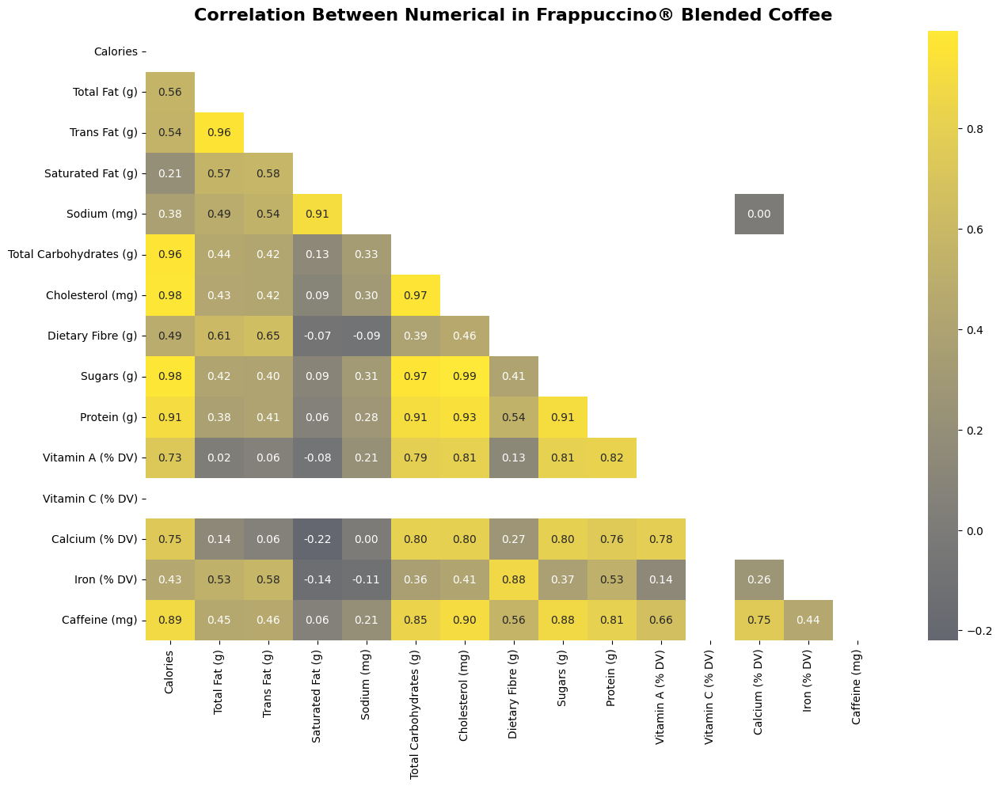

In [233]:
numerical_col = df_Fra.select_dtypes(include=['float64', 'int64']).columns
correlation = df_Fra[numerical_col].corr(method = "spearman")
matriks = np.triu(correlation)
display(correlation)

plt.figure(figsize = (15, 10))
sns.heatmap(
    data = correlation,
    annot = True,
    fmt = ".2f",
    cmap = "cividis",
    center = 0,
    mask = matriks
)

plt.title("Correlation Between Numerical in Frappuccino® Blended Coffee", size=16, pad=10, fontweight='bold')
plt.show()

**Summary in Frappuccino® Blended Coffee**

**1. Caloric Content:**

- Strong positive correlations exist between calories and various nutritional components, such as total carbohydrates, cholesterol, sugars, protein, and caffeine.
- Calories show a moderate positive correlation with total fat and a weak correlation with saturated fat.

**2. Nutritional Components:**
- Total fat, trans fat, saturated fat, sodium, and cholesterol show strong positive correlations with each other.
- Sugars and protein exhibit a strong positive correlation, indicating that products high in sugars are also likely to be high in protein.

**3. Vitamins and Minerals:**
- Vitamin A (% DV) and Vitamin C (% DV) show NaN correlations, suggesting no linear relationship. Similarly, Vitamin C (% DV) shows NaN correlations with several other components.
- Moderate positive correlations exist between total carbohydrates and Vitamin A (% DV), as well as between calcium and iron.

**4. Caffeine Content:**
- Caffeine exhibits strong positive correlations with calories, sugars, and protein. Products with higher calories tend to have more caffeine.
- The correlation between caffeine and total fat is relatively weak.

**5. Dietary Fiber:**
- Dietary fiber shows a weak correlation with several nutritional components, including total fat, trans fat, saturated fat, sodium, and sugars.

**6. Saturated Fat and Sodium:**
- Saturated fat has a strong positive correlation with sodium. Products high in saturated fat also tend to be high in sodium.

**7. Negative Correlations:**
- Some negative correlations, although weak, exist between dietary fiber and saturated fat, as well as between sodium and dietary fiber.

**8. Vitamins and Calories:**
- Calories have a strong positive correlation with Vitamin A (% DV) and a moderate positive correlation with Vitamin C (% DV).

## **Summary of Correlation Analysis in Frappuccino® Light Blended Coffee**

,Calories,Total Fat (g),Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g),Vitamin A (% DV),Vitamin C (% DV),Calcium (% DV),Iron (% DV),Caffeine (mg)
Calories,1.000000,0.602595,0.726694,NaN,0.670424,0.886931,0.973559,0.576582,0.962976,0.921500,0.803913,NaN,0.745713,0.739735,0.879009
Total Fat (g),0.602595,1.000000,0.955201,NaN,0.082158,0.326505,0.494517,0.979796,0.425210,0.593092,0.110680,NaN,0.142887,0.953463,0.343948
Trans Fat (g),0.726694,0.955201,1.000000,NaN,0.183115,0.480364,0.633396,0.935902,0.570772,0.656269,0.286958,NaN,0.276871,0.954464,0.491004
Saturated Fat (g),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sodium (mg),0.670424,0.082158,0.183115,NaN,1.000000,0.822226,0.769484,0.055902,0.769484,0.804084,0.866025,NaN,0.894427,0.313340,0.828079
Total Carbohydrates (g),0.886931,0.326505,0.480364,NaN,0.822226,1.000000,0.924430,0.294935,0.910370,0.868664,0.949425,NaN,0.919277,0.484857,0.987613
Cholesterol (mg),0.973559,0.494517,0.633396,NaN,0.769484,0.924430,1.000000,0.470302,0.989474,0.918470,0.888523,NaN,0.818249,0.648318,0.925700
Dietary Fibre (g),0.576582,0.979796,0.935902,NaN,0.055902,0.294935,0.470302,1.000000,0.393830,0.551383,0.096825,NaN,0.075000,0.934199,0.335610
Sugars (g),0.962976,0.425210,0.570772,NaN,0.769484,0.910370,0.989474,0.393830,1.000000,0.890971,0.888523,NaN,0.818249,0.587594,0.902690
Protein (g),0.921500,0.593092,0.656269,NaN,0.804084,0.868664,0.918470,0.551383,0.890971,1.000000,0.789205,NaN,0.823079,0.761454,0.874847


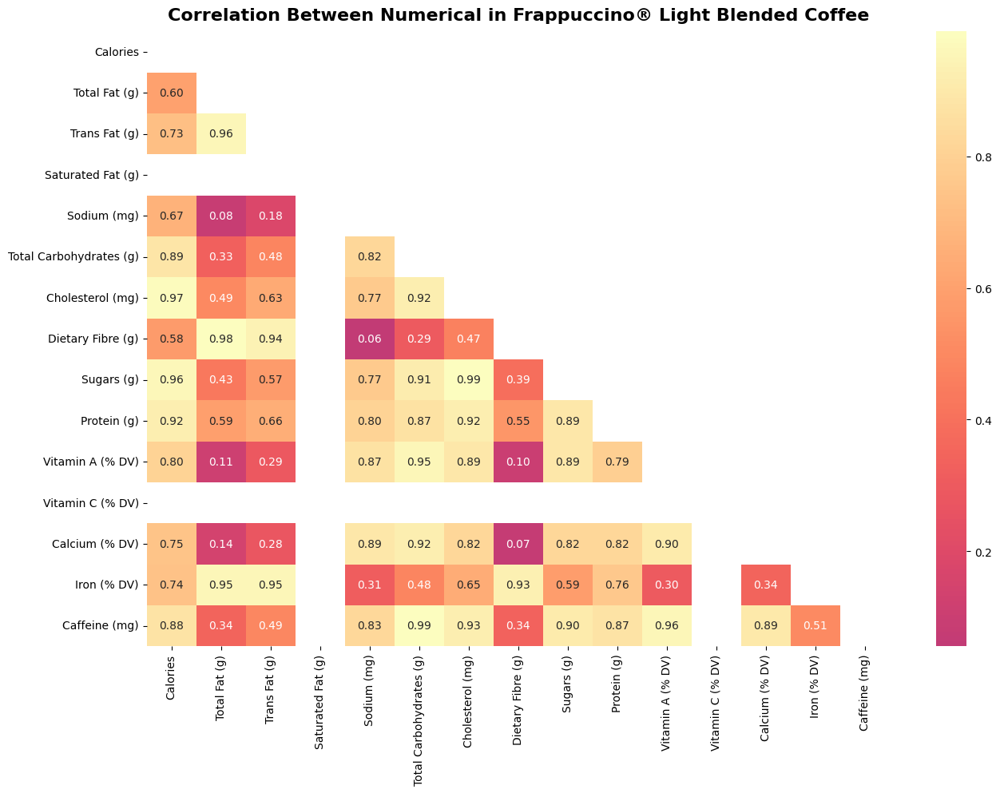

In [234]:
numerical_col = df_Frali.select_dtypes(include=['float64', 'int64']).columns
correlation = df_Frali[numerical_col].corr(method = "spearman")
matriks = np.triu(correlation)
display(correlation)

plt.figure(figsize = (15, 10))
sns.heatmap(
    data = correlation,
    annot = True,
    fmt = ".2f",
    cmap = "magma",
    center = 0,
    mask = matriks
)

plt.title("Correlation Between Numerical in Frappuccino® Light Blended Coffee", size=16, pad=10, fontweight='bold')
plt.show()

**Summary of Correlation Analysis in Frappuccino® Light Blended Coffee**

**1. Calories and Nutrients:**
- Calories have strong positive correlations with total carbohydrates, sugars, protein, and cholesterol.
- Calories have a moderate positive correlation with total fat and caffeine.

**2. Fat Content:**
- Total fat has a strong positive correlation with trans fat and saturated fat.
- Total fat also has a moderate positive correlation with cholesterol and protein.

**3. Carbohydrates and Sugars:**
- Total carbohydrates and sugars have a strong positive correlation, which is expected since sugars contribute to total carbohydrates.

**4. Protein:**
- Protein has positive correlations with total fat, trans fat, cholesterol, and total carbohydrates.

**5. Minerals and Vitamins:**
- Calcium has a positive correlation with total carbohydrates, cholesterol, and protein.
- Iron has positive correlations with total fat, trans fat, cholesterol, and protein.
- Vitamin A has positive correlations with total fat, trans fat, cholesterol, and protein.
- Vitamin C are not available (NaN) in the given matrix

**6. Caffeine:**
- Caffeine has positive correlations with total carbohydrates, sugars, protein, and vitamin A.

**7. Saturated Fat:**
- Saturated fat values are not available (NaN) in the given matrix.

## **Summary of All Nutrition Facts in Frappuccino® Light Blended Coffee**

In [221]:
nutrient_columns = ['Calories','Total Fat (g)','Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                    'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                    'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                    'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

avg_nutrients = {}

for nutrient in nutrient_columns:
    avg_nutrients[nutrient] = df_Frali.groupby(['Beverage_category','Beverage', 'Beverage_prep'])[nutrient].mean()

avg_nutrients_df = pd.DataFrame(avg_nutrients)


avg_nutrients_df

Calories  \
Beverage_category                 Beverage  Beverage_prep                  
Frappuccino® Light Blended Coffee Caramel   Grande Nonfat Milk     150.0   
                                            Tall Nonfat Milk       100.0   
                                            Venti Nonfat Milk      200.0   
                                  Coffee    Grande Nonfat Milk     120.0   
                                            Tall Nonfat Milk        90.0   
                                            Venti Nonfat Milk      160.0   
                                  Java Chip Grande Nonfat Milk     220.0   
                                            Tall Nonfat Milk       150.0   
                                            Venti Nonfat Milk      290.0   
                                  Mocha     Grande Nonfat Milk     150.0   
                                            Tall Nonfat Milk       110.0   
                                            Venti Nonfat Milk      210.0   

                                                                Total Fat (g)  \
Beverage_category                 Beverage  Beverage_prep                       
Frappuccino® Light Blended Coffee Caramel   Grande Nonfat Milk            0.1   
                                            Tall Nonfat Milk              0.1   
                                            Venti Nonfat Milk             0.1   
                                  Coffee    Grande Nonfat Milk            0.1   
                                            Tall Nonfat Milk              0.1   
                                            Venti Nonfat Milk             0.1   
                                  Java Chip Grande Nonfat Milk            4.0   
                                            Tall Nonfat Milk              3.0   
                                            Venti Nonfat Milk             5.0   
                                  Mocha     Grande Nonfat Milk            1.0   
                                            Tall Nonfat Milk              0.5   
                                            Venti Nonfat Milk             1.0   

                                                                Trans Fat (g)  \
Beverage_category                 Beverage  Beverage_prep                       
Frappuccino® Light Blended Coffee Caramel   Grande Nonfat Milk            0.1   
                                            Tall Nonfat Milk              0.0   
                                            Venti Nonfat Milk             0.1   
                                  Coffee    Grande Nonfat Milk            0.1   
                                            Tall Nonfat Milk              0.0   
                                            Venti Nonfat Milk             0.1   
                                  Java Chip Grande Nonfat Milk            3.0   
                                            Tall Nonfat Milk              2.0   
                                            Venti Nonfat Milk             4.0   
                                  Mocha     Grande Nonfat Milk            0.5   
                                            Tall Nonfat Milk              0.4   
                                            Venti Nonfat Milk             0.5   

                                                                Saturated Fat (g)  \
Beverage_category                 Beverage  Beverage_prep                           
Frappuccino® Light Blended Coffee Caramel   Grande Nonfat Milk                0.0   
                                            Tall Nonfat Milk                  0.0   
                                            Venti Nonfat Milk                 0.0   
                                  Coffee    Grande Nonfat Milk                0.0   
                                            Tall Nonfat Milk                  0.0   
                                            Venti Nonfat Milk                 0.0   
                                  Java Chip Grand

**Summary of All Nutrition Facts in Frappuccino® Light Blended Coffee**

**1. Caramel:**
The Grande Nonfat Milk Frappuccino® Light Blended Coffee (Caramel) has 150 calories, 0.1g total fat, and 33g total carbs, with 3g protein, 10% DV Vitamin A, and 90mg caffeine; the Tall Nonfat Milk option has 100 calories, 0.1g fat, and 23g carbs, with 3g protein, 8% DV Vitamin A, and 65mg caffeine; the Venti Nonfat Milk version has 200 calories, 0.1g fat, and 44g carbs, with 5g protein, 15% DV Calcium, 2% DV Iron, and 120mg caffeine.

**2. Coffee:**
The Grande Nonfat Milk Coffee has 120 calories, 0.1g total fat, and 26g total carbs, with 3g protein, 10% DV Vitamin A, and 95mg caffeine; the Tall Nonfat Milk option has 90 calories, 0.1g fat, and 20g carbs, with 3g protein, 10% DV Vitamin A, and 70mg caffeine; the Venti Nonfat Milk version has 160 calories, 0.1g fat, and 34g carbs, with 5g protein, 15% DV Calcium, 2% DV Iron, and 120mg caffeine.

**3. Java Chip:**
The Grande Nonfat Milk Java Chip has 220 calories, 4g total fat, and 43g total carbs, with 5g protein, 10% DV Vitamin A, 25% DV Calcium, and 105mg caffeine; the Tall Nonfat Milk option has 150 calories, 3g fat, and 30g carbs, with 4g protein, 10% DV Vitamin A, and 70mg caffeine; the Venti Nonfat Milk version has 290 calories, 5g fat, and 58g carbs, with 7g protein, 15% DV Calcium, 35% DV Iron, and 165mg caffeine.

**4. Mocha:**
The Grande Nonfat Milk Mocha has 150 calories, 1g total fat, and 33g total carbs, with 4g protein, 10% DV Vitamin A, 8% DV Vitamin C, and 95mg caffeine; the Tall Nonfat Milk option has 110 calories, 0.5g fat, and 24g carbs, with 3g protein, 8% DV Vitamin A, and 70mg caffeine; the Venti Nonfat Milk version has 210 calories, 1g fat, and 46g carbs, with 6g protein, 15% DV Calcium, 10% DV Iron, and 130mg caffeine.


## **Summary of All Nutrition Facts in Frappuccino® Blended Coffee**

In [222]:
nutrient_columns = ['Calories','Total Fat (g)','Trans Fat (g)', 'Saturated Fat (g)', 'Sodium (mg)',
                    'Total Carbohydrates (g)', 'Cholesterol (mg)', 'Dietary Fibre (g)',
                    'Sugars (g)', 'Protein (g)', 'Vitamin A (% DV)', 'Vitamin C (% DV)',
                    'Calcium (% DV)', 'Iron (% DV)', 'Caffeine (mg)']

avg_nutrients = {}

for nutrient in nutrient_columns:
    avg_nutrients[nutrient] = df_Fra.groupby(['Beverage_category','Beverage', 'Beverage_prep'])[nutrient].mean()

avg_nutrients_df = pd.DataFrame(avg_nutrients)

avg_nutrients_df

Calories  \
Beverage_category           Beverage                          Beverage_prep                    
Frappuccino® Blended Coffee Caramel (Without Whipped Cream)   Grande Nonfat Milk  280.000000   
                                                              Soymilk             260.000000   
                                                              Tall Nonfat Milk    180.000000   
                                                              Venti Nonfat Milk   330.000000   
                                                              Whole Milk          283.333333   
                            Coffee                            Grande Nonfat Milk  220.000000   
                                                              Soymilk             230.000000   
                                                              Tall Nonfat Milk    160.000000   
                                                              Venti Nonfat Milk   310.000000   
                                                              Whole Milk          256.666667   
                            Java Chip (Without Whipped Cream) Grande Nonfat Milk  310.000000   
                                                              Soymilk             320.000000   
                                                              Tall Nonfat Milk    220.000000   
                                                              Venti Nonfat Milk   420.000000   
                                                              Whole Milk          346.666667   
                            Mocha (Without Whipped Cream)     Grande Nonfat Milk  260.000000   
                                                              Soymilk             263.333333   
                                                              Tall Nonfat Milk    180.000000   
                                                              Venti Nonfat Milk   340.000000   
                                                              Whole Milk          293.333333   

                                                                                  Total Fat (g)  \
Beverage_category           Beverage                          Beverage_prep                       
Frappuccino® Blended Coffee Caramel (Without Whipped Cream)   Grande Nonfat Milk       0.100000   
                                                              Soymilk                  1.833333   
                                                              Tall Nonfat Milk         0.100000   
                                                              Venti Nonfat Milk        0.100000   
                                                              Whole Milk               3.666667   
                            Coffee                            Grande Nonfat Milk       0.100000   
                                                              Soymilk                  1.833333   
                                                              Tall Nonfat Milk         0.100000   
                                                              Venti Nonfat Milk        0.100000   
                                                              Whole Milk               3.500000   
                            Java Chip (Without Whipped Cream) Grande Nonfat Milk       4.000000   
                                                              Soymilk                  6.000000   
                                                              Tall Nonfat Milk         3.000000   
                                                              Venti Nonfat Milk        5.000000   
                                                              Whole Milk               7.333333   
                            Mocha (Without Whipped Cream)     Grande Nonfat Milk       1.000000   
                                                              Soymilk                  2.500000   
                                                              Tall Nonfat Milk         0.5

## **Frappuccino® Blended Coffee**

**1. Caramel (Without Whipped Cream):**

The Grande Nonfat Milk Caramel Frappuccino has 280 calories, 0.1g total fat, and 59g total carbs, with notable Vitamin A (6% DV) and 100mg caffeine; the Soymilk version has 260 calories, 1.83g fat, and 56g carbs, with Vitamin C (6% DV) and 100mg caffeine; the Tall Nonfat Milk has 180 calories, 0.1g fat, and 41g carbs, with 4% DV Vitamin A and 70mg caffeine; the Venti Nonfat Milk has 330 calories, 0.1g fat, and 77g carbs, with 2% DV Iron and 130mg caffeine; the Whole Milk option has 283.33 calories, 3.67g fat, and 59g carbs, with 0.67% DV Calcium and 100mg caffeine.

**2. Coffee:**
The Grande Nonfat Milk Coffee has 220 calories, 0.1g total fat, and 51g total carbs, with 4% DV Vitamin A, 4% DV Vitamin C, and 70mg caffeine; the Soymilk option has 230 calories, 1.83g fat, and 50.67g carbs, with 3.33% DV Vitamin A, 13.33% DV Vitamin C, and 98.33mg caffeine; the Tall Nonfat Milk has 160 calories, 0.1g fat, and 36g carbs, with 10% DV calcium; the Venti Nonfat Milk has 310 calories, 0.1g fat, and 70g carbs, with 6% DV iron, 20% DV calcium, and 95mg caffeine; the Whole Milk option has 256.67 calories, 3.5g fat, and 51.67g carbs, with 3.67% DV Vitamin A, 11% DV calcium, and 98.33mg caffeine.


**3. Java Chip (Without Whipped Cream):**
The Grande Nonfat Milk Java Chip has 310 calories, 4g total fat, and 67g total carbs, with 5g protein, 10% DV Vitamin A, and 110mg caffeine; the Soymilk option has 320 calories, 6g fat, and 66g carbs, with 4.33g protein, 13.33% DV Vitamin C, and 110mg caffeine; the Tall Nonfat Milk has 220 calories, 3g fat, and 47g carbs, with 4g protein, 10% DV Vitamin A, and 75mg caffeine; the Venti Nonfat Milk has 420 calories, 5g fat, and 90g carbs, with 7g protein, 20% DV calcium, and 145mg caffeine; the Whole Milk option has 346.67 calories, 7.33g fat, and 68g carbs, with 5.33g protein, 11% DV calcium, and 110mg caffeine.
    
**4. Mocha (Without Whipped Cream):**
The Grande Nonfat Milk Mocha has 260 calories, 1g total fat, and 61g total carbs, with 4g protein, 10% DV Vitamin A, 8% DV Vitamin C, and 110mg caffeine; the Soymilk option has 263.33 calories, 2.5g fat, and 59g carbs, with 4.33g protein, 13.33% DV Vitamin C, and 106.67mg caffeine; the Tall Nonfat Milk has 180 calories, 0.5g fat, and 42g carbs, with 3g protein, 10% DV Vitamin A, and 130mg caffeine; the Venti Nonfat Milk has 340 calories, 1g fat, and 80g carbs, with 7g protein, 15% DV Calcium, 10% DV Iron, and 140mg caffeine; the Whole Milk option has 293.33 calories, 4.33g fat, and 61g carbs, with 4.33g protein, 8% DV Vitamin A, and 106.67mg caffeine.



## **Based on Observation the Healthy product in Frappuccino® Light Blended**

In general, the "healthiness" of a beverage depends on individual dietary needs and preferences. However, if we consider lower calorie, lower fat, and moderate sugar content as indicators of healthier options, here are some observations:

1. Frappuccino® Light Blended Coffee (Caramel):
The Tall Nonfat Milk option has the lowest calories (100) and fat (0.1g).
The Venti Nonfat Milk version offers more calcium (15% DV) but has a slightly higher calorie count (200).

2. Frappuccino® Light Blended Coffee (Coffee):
The Tall Nonfat Milk Coffee has the lowest calories (90) and fat (0.1g).
The Grande Nonfat Milk Coffee has moderate calorie content and offers a reasonable amount of protein (3g).

3. Frappuccino® Light Blended Coffee (Java Chip):
The Tall Nonfat Milk Java Chip has the lowest calories (150) and fat (3g).
The Venti Nonfat Milk version has a higher calorie count (290) but also provides more calcium (15% DV) and iron (35% DV).

4. Frappuccino® Light Blended Coffee (Mocha):
The Tall Nonfat Milk Mocha has the lowest calories (110) and fat (0.5g).
The Venti Nonfat Milk version offers more calcium (15% DV) but has a slightly higher calorie count (210).

**For individuals aiming to reduce calorie and fat intake, the Frappuccino® Light Blended Tall Nonfat Milk options for both Caramel and Mocha might be considered relatively healthier. However, it's essential to consider your overall diet, nutritional needs, and personal preferences when choosing beverages.**

## **Based on Observation the Healthy product in Frappuccino® Blended**

Determining the healthiest options depends on individual dietary preferences and nutritional needs. However, if we consider lower calorie, lower fat, and moderate sugar content as indicators of healthier options, here are some observations:

1. Caramel Frappuccino® (Without Whipped Cream):
The Tall Nonfat Milk option stands out with 180 calories, 0.1g fat, and 41g carbs, providing a relatively lower calorie and fat content.
The Soymilk option is also a reasonable choice with 260 calories, 1.83g fat, and 56g carbs, offering additional Vitamin C.

2. Coffee:
The Tall Nonfat Milk Coffee is a lighter choice with 160 calories, 0.1g fat, and 36g carbs, and it provides 10% DV calcium.
The Venti Nonfat Milk Coffee is a good option with 310 calories, 0.1g fat, and 70g carbs, delivering additional iron and calcium.

3. Java Chip (Without Whipped Cream):
The Tall Nonfat Milk Java Chip is a relatively lower-calorie option with 220 calories, 3g fat, and 47g carbs, providing 4g protein.
The Venti Nonfat Milk Java Chip, while higher in calories, offers more calcium (20% DV) and iron (6% DV).

4. Mocha (Without Whipped Cream):
The Tall Nonfat Milk Mocha is a lighter choice with 180 calories, 0.5g fat, and 42g carbs, and it includes 10% DV Vitamin A.
The Soymilk Mocha is also reasonable with 263.33 calories, 2.5g fat, and 59g carbs, providing extra Vitamin C.


Remember that individual health goals and preferences play a significant role in determining what may be considered a "healthy" option. It's advisable to consider overall dietary balance and consult with a healthcare professional or nutritionist for personalized recommendations. 

**Among the options provided, the Frappuccino® Blended Tall Nonfat Milk Coffee stands out as a relatively healthier choice, considering lower calorie and fat content while still providing some nutritional value with 10% DV calcium.**

## **Conclusion for Frappuccino® Blended Coffee & Frappuccino® Light Blended Coffee**

**1. Frappuccino® Blended Coffee:**

a. The Frappuccino® Blended Coffee line offers a variety of flavors and ingredient combinations.

b. Options like the Tall Nonfat Milk versions tend to be lighter in calories and fat, providing a more balanced choice.

c. Consider individual preferences, as some options may include more caffeine, calcium, or other nutrients.

**2. Frappuccino® Light Blended Coffee:**

a. The Frappuccino® Light Blended Coffee line is designed to be a lighter version, typically lower in calories and fat.

b. Options like the Tall Nonfat Milk versions of the Light line generally offer a reduced-calorie alternative with lower fat content.

c. Consider these for a lighter treat without compromising too much on flavor, and be mindful of additional nutritional aspects such as caffeine and vitamins.

**In conclusion, both Frappuccino® Blended Coffee and Frappuccino® Light Blended Coffee offer various choices to cater to different tastes and dietary preferences. For a relatively healthier option, consider the Tall Nonfat Milk versions in both lines. Remember to balance your choices with your overall dietary needs and personal preferences.**

## **Reccomendation for Frappuccino® Blended Coffee & Frappuccino® Light Blended Coffee**

**1. Transparent Nutrition Information:**
- Provide easily accessible and detailed nutritional information for all menu items.

**2. Highlight Lower-Calorie Options:**
- Feature and promote beverages with lower calorie and fat content to cater to health-conscious customers.

**3. Encourage Customization:**
- Educate customers on customization options, allowing them to control factors like milk type, sweetness level, and toppings.

**4. Expand Plant-Based Choices:**
- Increase availability of plant-based milk alternatives (almond, coconut, oat) to meet demand and promote environmental and health benefits.

**5. Promote Healthier Ingredients:**
- Explore and incorporate healthier ingredients without compromising flavor, reducing added sugars where feasible.

**6. Staff Nutrition Training:**
- Ensure Starbucks staff is well-informed about nutritional content and can guide customers based on dietary preferences.